<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#1.-Import-packages" data-toc-modified-id="1.-Import-packages-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>1. Import packages</a></span></li><li><span><a href="#2.-Set-variables" data-toc-modified-id="2.-Set-variables-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>2. Set variables</a></span></li><li><span><a href="#3.-Set-functions" data-toc-modified-id="3.-Set-functions-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>3. Set functions</a></span></li><li><span><a href="#4.-Load-data" data-toc-modified-id="4.-Load-data-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>4. Load data</a></span></li><li><span><a href="#5.-Feature-generation" data-toc-modified-id="5.-Feature-generation-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>5. Feature generation</a></span><ul class="toc-item"><li><span><a href="#5.1-Kaggle-main-functions" data-toc-modified-id="5.1-Kaggle-main-functions-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>5.1 Kaggle main functions</a></span></li><li><span><a href="#5.1-Kaggle-class" data-toc-modified-id="5.1-Kaggle-class-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>5.1 Kaggle class</a></span></li><li><span><a href="#5.2-Oskin's-function" data-toc-modified-id="5.2-Oskin's-function-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>5.2 Oskin's function</a></span></li><li><span><a href="#5.3-Process-train-data" data-toc-modified-id="5.3-Process-train-data-5.4"><span class="toc-item-num">5.4&nbsp;&nbsp;</span>5.3 Process train data</a></span></li><li><span><a href="#5.4-Process-test-data" data-toc-modified-id="5.4-Process-test-data-5.5"><span class="toc-item-num">5.5&nbsp;&nbsp;</span>5.4 Process test data</a></span></li><li><span><a href="#5.5-Get-skewed-columns" data-toc-modified-id="5.5-Get-skewed-columns-5.6"><span class="toc-item-num">5.6&nbsp;&nbsp;</span>5.5 Get skewed columns</a></span></li><li><span><a href="#5.6-Get-highly-correlated-columns" data-toc-modified-id="5.6-Get-highly-correlated-columns-5.7"><span class="toc-item-num">5.7&nbsp;&nbsp;</span>5.6 Get highly correlated columns</a></span></li><li><span><a href="#5.7-Drop-bad-features" data-toc-modified-id="5.7-Drop-bad-features-5.8"><span class="toc-item-num">5.8&nbsp;&nbsp;</span>5.7 Drop bad features</a></span></li></ul></li><li><span><a href="#6.-Prepaire-final-dataset" data-toc-modified-id="6.-Prepaire-final-dataset-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>6. Prepaire final dataset</a></span><ul class="toc-item"><li><span><a href="#6.1-Searching-the-best-feature-fraction-for-Boruta" data-toc-modified-id="6.1-Searching-the-best-feature-fraction-for-Boruta-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>6.1 Searching the best feature fraction for Boruta</a></span></li><li><span><a href="#6.2-XGBoost" data-toc-modified-id="6.2-XGBoost-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>6.2 XGBoost</a></span></li><li><span><a href="#6.3-LightGBM" data-toc-modified-id="6.3-LightGBM-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>6.3 LightGBM</a></span></li><li><span><a href="#6.4-Catboost" data-toc-modified-id="6.4-Catboost-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span>6.4 Catboost</a></span></li></ul></li></ul></div>

# 1. Import packages

In [1]:
#%%time
%pylab inline
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import gc
gc.enable()
import sys

from sklearn.ensemble import *
from sklearn.metrics import *
from sklearn.model_selection import *
from sklearn.linear_model import *
from sklearn.cluster import *
from sklearn.pipeline import *
from sklearn.preprocessing import *
import xgboost as xgb
import lightgbm as lgb
import catboost as ctbst
from boruta import BorutaPy

import tensorflow
KERAS_BACKEND=tensorflow
import keras
from keras import *
from keras.utils import *
from keras.models import *
from keras.callbacks import *
from keras.optimizers import *
from keras.layers import *
from keras.layers.core import *
from keras.layers.recurrent import *
from keras.layers.normalization import *
from keras.layers.advanced_activations import *
from keras import backend as K
from keras.utils.vis_utils import model_to_dot

import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 20, 10
plt.style.use('fivethirtyeight')
plt.figure(figsize=(20, 10))
import seaborn as sns
import plotly
from plotly.offline import *
import plotly.plotly as py
from plotly.graph_objs import *
from pylab import *
init_notebook_mode(connected=True)
import shap
from tqdm import *
from IPython.display import *
import missingno

import threading as th
import multiprocessing as mp
import itertools

Populating the interactive namespace from numpy and matplotlib


Using TensorFlow backend.


<Figure size 1440x720 with 0 Axes>

In [2]:
from scipy import *
from scipy import stats
from scipy.signal import *
from tsfresh.feature_extraction import feature_calculators
from joblib import Parallel, delayed
import feather

# 2. Set variables

In [3]:
#cannot use seed cause python has function with the same name
random_state = 1
path = 'D:/Python/Kaggle/LANL/'
n_threads = mp.cpu_count()-1 #th.active_count()

# 3. Set functions

In [383]:
def plot_wide(f):
    def wrapped():
        rcParams['figure.figsize'] = 20, 10
    return wrapped

def data_convert(df, col_exc, do_print=True):
    
    columns = [column for column in df.columns if column not in [col_exc]]
    
    for column in columns:

        if (df[column].dtype not in ['datetime64[ns]', 'object', 'float']):
            
            mn = df[column].min()
            mx = df[column].max()
            
            #uint
            if (mn >= 0):
                
                #uint8
                if (mx < 255):
                    try:
                        column_type = str(df[column].dtype)
                        df[column] = df[column].astype('uint8')
                        if do_print:
                            print(
                                column,
                                'with type',
                                column_type,
                                'converted to uint8'
                            )
                    except:
                        print(sys.exc_info()[0])
                
                #uint16
                elif (mx < 65535):
                    try:
                        column_type = str(df[column].dtype)
                        df[column] = df[column].astype('uint16')
                        if do_print:
                            print(
                                column,
                                'with type',
                                column_type,
                                'converted to uint16'
                            )
                    except:
                        print(sys.exc_info()[0])
                        
                #uint32
                elif (mx < 4294967295):
                    try:
                        column_type = str(df[column].dtype)
                        df[column] = df[column].astype('uint32')
                        if do_print:
                            print(
                                column,
                                'with type',
                                column_type,
                                'converted to uint32'
                            )
                    except:
                        print(sys.exc_info()[0])
                        
                #uint64
                elif (mx < 18446744073709551615):
                    try:
                        column_type = str(df[column].dtype)
                        df[column] = df[column].astype('uint64')
                        if do_print:
                            print(
                                column,
                                'with type',
                                column_type,
                                'converted to uint64'
                            )
                    except:
                        print(sys.exc_info()[0])
            
            #int8
            elif ((-128 <= mn <= 127) & (-128 <= mx <= 127)):
                try:
                    column_type = str(df[column].dtype)
                    df[column] = df[column].astype('int8')
                    if do_print:
                        print(
                            column,
                            'with type',
                            column_type,
                            'converted to int8'
                        )
                except:
                    print(sys.exc_info()[0])
                
            #int16
            elif ((-32768 <= mn <= 32767) & (-32768 <= mx <= 32767)):
                try:
                    column_type = str(df[column].dtype)
                    df[column] = df[column].astype('int16')
                    if do_print:
                        print(
                            column,
                            'with type',
                            column_type,
                            'converted to int16'
                        )
                except:
                    print(sys.exc_info()[0])
                
            #int32
            elif ((-2147483648 <= mn <= 2147483647) & (-2147483648 <= mx <= 2147483647)):
                try:
                    column_type = str(df[column].dtype)
                    df[column] = df[column].astype('int32')
                    if do_print:
                        print(
                            column,
                            'with type',
                            column_type,
                            'converted to int32'
                        )
                except:
                    print(sys.exc_info()[0])
        
        elif (df[column].dtype == 'float'):
            
            try:
                column_type = str(df[column].dtype)
                df[column] = df[column].astype('float32')
                if do_print:
                    print(
                        column,
                        'with type',
                        column_type,
                        'converted to float32'
                    )
            except:
                print(sys.exc_info()[0]) 
        
        else:
            if do_print:
                print(
                    column,
                    'has no convertable type'
                )
                
    return df
            
def data_desc(df):
    
    df_types = pd.DataFrame(df.dtypes.reset_index()).rename(columns={'index': 'column', 0: 'type'})
    
    for c in df_types['column'].values:
        
        null = 'EXIST' if df[c].isnull().any()==True else 'DOES NOT EXIST'
        column_type = df_types[df_types['column']==c]['type'].values[0]
        
        print(
            'NULL VALUES',
            null,
            'WITH FORMAT',
            column_type,
            'IN COLUMN',
            c
        )
        
    print(df.dtypes)
    return df.describe().T

#@plot_wide
def simple_analysis(df, cat_feat=None, target=''):
    
    features = df.columns
    dt = df.dtypes
    
    sns.heatmap(df.corr())
    plt.show()
    
    columns = pd.DataFrame(df.dtypes).reset_index().rename(columns={'index': 'column', 0: 'type'})
    dig_feat = columns[columns['type']!='object']['column'].values
    
    for d in dig_feat:
        
        sns.distplot(df[d])
        plt.show()
        
    if cat_feat != None:
        
        for c in cat_feat:
            
            #sns.stripplot(
            #    x=target,
            #    y=c,
            #    data=df,
            #    jitter=True,
            #    linewidth=1
            #)
            sns.boxplot(
                x=c,
                y=target,
                data=df
            )
            plt.show()
            
def data_skew(df):
    
    sk_df = pd.DataFrame(
        [
            {
                'column': c,
                'uniq': df[c].nunique(),
                'skewness': df[c].value_counts(normalize=True).values[0] * 100
            } for c in df.columns
        ]
    )
    sk_df = sk_df.sort_values('skewness', ascending=False)
    
    return sk_df
            
def plot_feat_imp(feat, imp, n_feat):
    
    feat = feat[:n_feat]
    df_temp = pd.DataFrame(feat, columns=['feature'])
    df_temp['imp'] = imp[:n_feat]
    df_temp.sort_values(
        by=['imp'],
        ascending=True,
        inplace=True
    )
    
    n_feat = len(feat)
    
    plt.barh(
        range(n_feat),
        df_temp['imp'],
        align='center'
    )
    
    plt.yticks(np.arange(n_feat), df_temp['feature'])
    plt.xlabel(xlabel('Importance'))
    plt.ylabel('Feature')
    del df_temp; gc.collect()
    
def plot_vc(x, y_train, y_valid, xlabel='DEPTH'):
    '''
    plt.title('Validation curve')
    plt.xlabel('depth')
    plt.ylabel('roc_auc')
    sns.lineplot(
        x=x,
        y=y_train,
        label='Train'
    )

    sns.lineplot(
        x=x,
        y=y_valid,
        label='Valid'
    )
    
    plt.show()
    '''
    train = Scatter(
        x=x,
        y=y_train,
        name='Train',
        line=dict(
            color='rgba(240, 65, 65, .9)',
            shape='hvh'
        ),
        mode='lines+markers',
        connectgaps=True
    )
    
    valid = Scatter(
        x=x,
        y=y_valid,
        name='Valid',
        line=dict(
            color='rgba(65, 100, 240, .9)',
            shape='hvh'
        ),
        mode='lines+markers',
        connectgaps=True
    )
    
    data = [train, valid]
    
    layout = dict(
        title='Validation curve',
        legend=dict(
            x=.9,
            y=1
        ),
        yaxis = dict(
            title='MAE',
            autorange=False,
            range=[0, max(y_valid)*2],
            #tickformat='0.0%'
        ),
        xaxis = dict(
            title=xlabel,
            dtick=1
        ),
        showlegend=True
    )
    
    fig = dict(
        data=data,
        layout=layout
    )
    
    iplot(fig)
            
def model_mean(**kwargs):
    
    X_train = kwargs['X_train']
    X_valid = kwargs['X_valid']
    X_test = kwargs['X_test']
    y_train = kwargs['y_train']
    y_valid = kwargs['y_valid']
    y_test = kwargs['y_test']
    feat = kwargs['feat']

    if 'cat_feat' in kwargs.keys():
        cat_feat = kwargs['cat_feat']

    model = kwargs['model']
    random_state = kwargs['random_state']
    samples = kwargs['samples']
    info = kwargs['info']
    y_valid_preds = []
    y_test_preds = []
    
    for i in range(0, samples):
        
        if 'cat_feat' in kwargs.keys():
            
            y_valid_pred_, y_test_pred_ = model(
                X_train,
                X_valid,
                X_test,
                y_train,
                y_valid,
                y_test,
                feat,
                cat_feat,
                random_state+i
            )
            
        else:
            
            y_valid_pred_, y_test_pred_ = model(
                X_train,
                X_valid,
                X_test,
                y_train,
                y_valid,
                y_test,
                feat,
                random_state+1
            )

        y_valid_preds.append(y_valid_pred_)
        y_test_preds.append(y_test_pred_)
    
    y_valid_pred = np.mean(y_valid_preds, axis=0)
    y_test_pred = np.mean(y_test_preds, axis=0)
    
    try:
        
        print(
            samples,
            info,
            'MODELS',
            '\nMAE va;od score:',
            mean_absolute_error(y_valid, y_valid_pred)
        )
        
    except:
        
        'CANNOT CALC METRIC'
    
    print(
        samples,
        info,
        'MODELS',
        '\nMAE test score:',
        mean_absolute_error(y_test, y_test_pred)
    )
   
    return y_valid_pred, y_test_pred

# 4. Load data

In [5]:
#%%time

X_train = pd.read_csv(path + 'train.csv', dtype={'acoustic_data': np.int16, 'time_to_failure': np.float32})

#X_test = pd.read_csv(path + 'test.csv', sep=',')

In [6]:
pd.options.display.precision = 20

In [21]:
X_train.shape

(629145480, 2)

In [22]:
X_train.loc[1000:1100]

,acoustic_data,time_to_failure
1000,6,1.46909892559051513672
1001,13,1.46909892559051513672
1002,12,1.46909892559051513672
1003,9,1.46909892559051513672
1004,10,1.46909892559051513672
1005,8,1.46909892559051513672
1006,8,1.46909892559051513672
1007,8,1.46909892559051513672
1008,4,1.46909892559051513672
1009,1,1.46909892559051513672


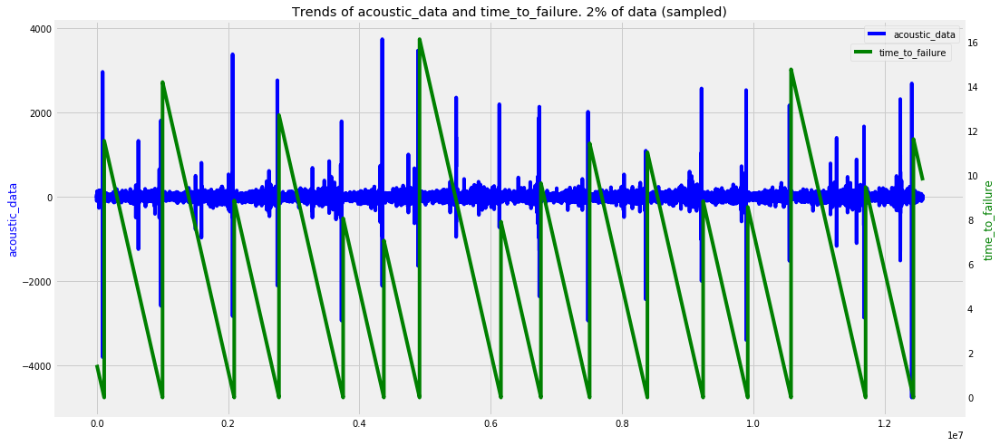

In [23]:
train_acoustic_data_small = X_train['acoustic_data'].values[::50]
train_time_to_failure_small = X_train['time_to_failure'].values[::50]

fig, ax1 = plt.subplots(figsize=(16, 8))
plt.title("Trends of acoustic_data and time_to_failure. 2% of data (sampled)")
plt.plot(train_acoustic_data_small, color='b')
ax1.set_ylabel('acoustic_data', color='b')
plt.legend(['acoustic_data'])
ax2 = ax1.twinx()
plt.plot(train_time_to_failure_small, color='g')
ax2.set_ylabel('time_to_failure', color='g')
plt.legend(['time_to_failure'], loc=(0.875, 0.9))
plt.grid(False)

del train_acoustic_data_small
del train_time_to_failure_small

# 5. Feature generation

## 5.1 Kaggle main functions

In [5]:
# Create a training file with simple derived features
#rows = 150_000
#segments = int(np.floor(X_train.shape[0] / rows))

def add_trend_feature(arr, abs_values=False):
    
    idx = np.array(range(len(arr)))
    if abs_values:
        arr = np.abs(arr)
    lr = LinearRegression()
    lr.fit(idx.reshape(-1, 1), arr)
    return lr.coef_[0]

def classic_sta_lta(x, length_sta, length_lta):
    
    sta = np.cumsum(x ** 2)

    # Convert to float
    sta = np.require(sta, dtype=np.float)

    # Copy for LTA
    lta = sta.copy()

    # Compute the STA and the LTA
    sta[length_sta:] = sta[length_sta:] - sta[:-length_sta]
    sta /= length_sta
    lta[length_lta:] = lta[length_lta:] - lta[:-length_lta]
    lta /= length_lta

    # Pad zeros
    sta[:length_lta - 1] = 0

    # Avoid division by zero by setting zero values to tiny float
    dtiny = np.finfo(0.0).tiny
    idx = lta < dtiny
    lta[idx] = dtiny

    return sta / lta

def calc_change_rate(x):
    
    change = (np.diff(x) / x[:-1]).values
    change = change[np.nonzero(change)[0]]
    change = change[~np.isnan(change)]
    change = change[change != -np.inf]
    change = change[change != np.inf]
    return np.mean(change)

#for segment in tqdm_notebook(range(segments)):
#    
#    seg = X_train.iloc[segment*rows:segment*rows+rows]
#    create_features(seg_id, seg, X_tr)
#    y_tr.loc[seg_id, 'time_to_failure'] = seg['time_to_failure'].values[-1]

## 5.1 Kaggle class

In [6]:
class FeatureGenerator(object):
    
    def __init__(self, dtype, n_jobs=1, chunk_size=None):
        
        self.chunk_size = chunk_size
        self.dtype = dtype
        self.filename = None
        self.n_jobs = n_jobs
        self.test_files = []
        
        if self.dtype == 'train':
            
            self.filename = path + 'train.csv'
            self.total_data = int(629145481 / self.chunk_size)
            
        else:
            
            submission = pd.read_csv(path + 'sample_submission.csv')
            
            for seg_id in submission.seg_id.values:
                
                self.test_files.append((seg_id, path + 'test/' + seg_id + '.csv'))
                
            self.total_data = int(len(submission))

    def read_chunks(self):
        
        if self.dtype == 'train':
            
            iter_df = pd.read_csv(self.filename, iterator=True, chunksize=self.chunk_size,
                                  dtype={'acoustic_data': np.float64, 'time_to_failure': np.float64})
            
            for counter, df in enumerate(iter_df):
                
                x = df.acoustic_data.values
                y = df.time_to_failure.values[-1]
                seg_id = 'train_' + str(counter)
                del df
                yield seg_id, x, y
                
        else:
            
            for seg_id, f in self.test_files:
                
                df = pd.read_csv(f, dtype={'acoustic_data': np.float64})
                x = df.acoustic_data.values[-self.chunk_size:]
                del df
                yield seg_id, x, -999
    
    def get_features(self, x, y, seg_id):
        
        """
        Gets three groups of features: from original data and from reald and imaginary parts of FFT.
        """
        
        x = pd.Series(x)
    
        zc = np.fft.fft(x)
        realFFT = pd.Series(np.real(zc))
        imagFFT = pd.Series(np.imag(zc))
        
        main_dict = self.features(x, y, seg_id)
        r_dict = self.features(realFFT, y, seg_id)
        i_dict = self.features(imagFFT, y, seg_id)
        
        for k, v in r_dict.items():
            
            if k not in ['target', 'seg_id']:
                
                main_dict[f'fftr_{k}'] = v
                
        for k, v in i_dict.items():
            
            if k not in ['target', 'seg_id']:
                
                main_dict[f'ffti_{k}'] = v
        
        return main_dict
        
    
    def features(self, x, y, seg_id):
        
        feature_dict = dict()
        feature_dict['target'] = y
        feature_dict['seg_id'] = seg_id
        
        # create features here

        # lists with parameters to iterate over them
        percentiles = [1, 5, 10, 20, 25, 30, 40, 50, 60, 70, 75, 80, 90, 95, 99]
        hann_windows = [50, 150, 1500, 15000]
        spans = [300, 3000, 30000, 50000]
        windows = [10, 50, 100, 500, 1000, 10000]
        borders = list(range(-4000, 4001, 1000))
        peaks = [10, 20, 50, 100]
        coefs = [1, 5, 10, 50, 100]
        lags = [10, 100, 1000, 10000]
        autocorr_lags = [5, 10, 50, 100, 500, 1000, 5000, 10000]

        # basic stats
        feature_dict['mean'] = x.mean()
        feature_dict['std'] = x.std()
        feature_dict['max'] = x.max()
        feature_dict['min'] = x.min()

        # basic stats on absolute values
        feature_dict['mean_change_abs'] = np.mean(np.diff(x))
        feature_dict['abs_max'] = np.abs(x).max()
        feature_dict['abs_mean'] = np.abs(x).mean()
        feature_dict['abs_std'] = np.abs(x).std()

        # geometric and harminic means
        feature_dict['hmean'] = stats.hmean(np.abs(x[np.nonzero(x)[0]]))
        feature_dict['gmean'] = stats.gmean(np.abs(x[np.nonzero(x)[0]])) 
        
        # k-statistic and moments
        for i in range(1, 5):
            
            feature_dict[f'kstat_{i}'] = stats.kstat(x, i)
            feature_dict[f'moment_{i}'] = stats.moment(x, i)

        for i in [1, 2]:
            
            feature_dict[f'kstatvar_{i}'] = stats.kstatvar(x, i)
        
        # aggregations on various slices of data
        for agg_type, slice_length, direction in itertools.product(['std', 'min', 'max', 'mean'], [1000, 10000, 50000], ['first', 'last']):
            
            if direction == 'first':
                
                feature_dict[f'{agg_type}_{direction}_{slice_length}'] = x[:slice_length].agg(agg_type)
                
            elif direction == 'last':
                
                feature_dict[f'{agg_type}_{direction}_{slice_length}'] = x[-slice_length:].agg(agg_type)

        feature_dict['max_to_min'] = x.max() / np.abs(x.min())
        feature_dict['max_to_min_diff'] = x.max() - np.abs(x.min())
        feature_dict['count_big'] = len(x[np.abs(x) > 500])
        feature_dict['sum'] = x.sum()

        feature_dict['mean_change_rate'] = calc_change_rate(x)
        # calc_change_rate on slices of data
        for slice_length, direction in itertools.product([1000, 10000, 50000], ['first', 'last']):
            
            if direction == 'first':
                
                feature_dict[f'mean_change_rate_{direction}_{slice_length}'] = calc_change_rate(x[:slice_length])
                
            elif direction == 'last':
                
                feature_dict[f'mean_change_rate_{direction}_{slice_length}'] = calc_change_rate(x[-slice_length:])

        # percentiles on original and absolute values
        for p in percentiles:
            
            feature_dict[f'percentile_{p}'] = np.percentile(x, p)
            feature_dict[f'abs_percentile_{p}'] = np.percentile(np.abs(x), p)

        feature_dict['trend'] = add_trend_feature(x)
        feature_dict['abs_trend'] = add_trend_feature(x, abs_values=True)

        feature_dict['mad'] = x.mad()
        feature_dict['kurt'] = x.kurtosis()
        feature_dict['skew'] = x.skew()
        feature_dict['med'] = x.median()

        feature_dict['Hilbert_mean'] = np.abs(hilbert(x)).mean()

        for hw in hann_windows:
            feature_dict[f'Hann_window_mean_{hw}'] = (convolve(x, hann(hw), mode='same') / sum(hann(hw))).mean()

        feature_dict['classic_sta_lta1_mean'] = classic_sta_lta(x, 500, 10000).mean()
        feature_dict['classic_sta_lta2_mean'] = classic_sta_lta(x, 5000, 100000).mean()
        feature_dict['classic_sta_lta3_mean'] = classic_sta_lta(x, 3333, 6666).mean()
        feature_dict['classic_sta_lta4_mean'] = classic_sta_lta(x, 10000, 25000).mean()
        feature_dict['classic_sta_lta5_mean'] = classic_sta_lta(x, 50, 1000).mean()
        feature_dict['classic_sta_lta6_mean'] = classic_sta_lta(x, 100, 5000).mean()
        feature_dict['classic_sta_lta7_mean'] = classic_sta_lta(x, 333, 666).mean()
        feature_dict['classic_sta_lta8_mean'] = classic_sta_lta(x, 4000, 10000).mean()

        # exponential rolling statistics
        ewma = pd.Series.ewm
        for s in spans:
            
            feature_dict[f'exp_Moving_average_{s}_mean'] = (ewma(x, span=s).mean(skipna=True)).mean(skipna=True)
            feature_dict[f'exp_Moving_average_{s}_std'] = (ewma(x, span=s).mean(skipna=True)).std(skipna=True)
            feature_dict[f'exp_Moving_std_{s}_mean'] = (ewma(x, span=s).std(skipna=True)).mean(skipna=True)
            feature_dict[f'exp_Moving_std_{s}_std'] = (ewma(x, span=s).std(skipna=True)).std(skipna=True)

        feature_dict['iqr'] = np.subtract(*np.percentile(x, [75, 25]))
        feature_dict['iqr1'] = np.subtract(*np.percentile(x, [95, 5]))
        feature_dict['ave10'] = stats.trim_mean(x, 0.1)
        
        for slice_length, threshold in itertools.product([50000, 100000, 150000], [5, 10, 20, 50, 100]):
            
            feature_dict[f'count_big_{slice_length}_threshold_{threshold}'] = (np.abs(x[-slice_length:]) > threshold).sum()
            feature_dict[f'count_big_{slice_length}_less_threshold_{threshold}'] = (np.abs(x[-slice_length:]) < threshold).sum()

        # tfresh features take too long to calculate, so I comment them for now
        feature_dict['abs_energy'] = feature_calculators.abs_energy(x)
        feature_dict['abs_sum_of_changes'] = feature_calculators.absolute_sum_of_changes(x)
        feature_dict['count_above_mean'] = feature_calculators.count_above_mean(x)
        feature_dict['count_below_mean'] = feature_calculators.count_below_mean(x)
        feature_dict['mean_abs_change'] = feature_calculators.mean_abs_change(x)
        feature_dict['mean_change'] = feature_calculators.mean_change(x)
        feature_dict['var_larger_than_std_dev'] = feature_calculators.variance_larger_than_standard_deviation(x)
        feature_dict['range_minf_m4000'] = feature_calculators.range_count(x, -np.inf, -4000)
        feature_dict['range_p4000_pinf'] = feature_calculators.range_count(x, 4000, np.inf)

        for i, j in zip(borders, borders[1:]):
            
            feature_dict[f'range_{i}_{j}'] = feature_calculators.range_count(x, i, j)

        feature_dict['ratio_unique_values'] = feature_calculators.ratio_value_number_to_time_series_length(x)
        feature_dict['first_loc_min'] = feature_calculators.first_location_of_minimum(x)
        feature_dict['first_loc_max'] = feature_calculators.first_location_of_maximum(x)
        feature_dict['last_loc_min'] = feature_calculators.last_location_of_minimum(x)
        feature_dict['last_loc_max'] = feature_calculators.last_location_of_maximum(x)

        for lag in lags:
            feature_dict[f'time_rev_asym_stat_{lag}'] = feature_calculators.time_reversal_asymmetry_statistic(x, lag)

        for autocorr_lag in autocorr_lags:
        
            feature_dict[f'autocorrelation_{autocorr_lag}'] = feature_calculators.autocorrelation(x, autocorr_lag)
            feature_dict[f'c3_{autocorr_lag}'] = feature_calculators.c3(x, autocorr_lag)

        for coeff, attr in itertools.product([1, 2, 3, 4, 5], ['real', 'imag', 'angle']):
            
             feature_dict[f'fft_{coeff}_{attr}'] = list(feature_calculators.fft_coefficient(x, [{'coeff': coeff, 'attr': attr}]))[0][1]

        feature_dict['long_strk_above_mean'] = feature_calculators.longest_strike_above_mean(x)
        feature_dict['long_strk_below_mean'] = feature_calculators.longest_strike_below_mean(x)
        feature_dict['cid_ce_0'] = feature_calculators.cid_ce(x, 0)
        feature_dict['cid_ce_1'] = feature_calculators.cid_ce(x, 1)

        for p in percentiles:
        
            feature_dict[f'binned_entropy_{p}'] = feature_calculators.binned_entropy(x, p)

        feature_dict['num_crossing_0'] = feature_calculators.number_crossing_m(x, 0)

        for peak in peaks:
            feature_dict[f'num_peaks_{peak}'] = feature_calculators.number_peaks(x, peak)

        for c in coefs:
            
            feature_dict[f'spkt_welch_density_{c}'] = list(feature_calculators.spkt_welch_density(x, [{'coeff': c}]))[0][1]
            feature_dict[f'time_rev_asym_stat_{c}'] = feature_calculators.time_reversal_asymmetry_statistic(x, c)  

        # statistics on rolling windows of various sizes
        for w in windows:
            
            x_roll_std = x.rolling(w).std().dropna().values
            x_roll_mean = x.rolling(w).mean().dropna().values

            feature_dict[f'ave_roll_std_{w}'] = x_roll_std.mean()
            feature_dict[f'std_roll_std_{w}'] = x_roll_std.std()
            feature_dict[f'max_roll_std_{w}'] = x_roll_std.max()
            feature_dict[f'min_roll_std_{w}'] = x_roll_std.min()

            for p in percentiles:
                
                feature_dict[f'percentile_roll_std_{p}_window_{w}'] = np.percentile(x_roll_std, p)

            feature_dict[f'av_change_abs_roll_std_{w}'] = np.mean(np.diff(x_roll_std))
            feature_dict[f'av_change_rate_roll_std_{w}'] = np.mean(np.nonzero((np.diff(x_roll_std) / x_roll_std[:-1]))[0])
            feature_dict[f'abs_max_roll_std_{w}'] = np.abs(x_roll_std).max()

            feature_dict[f'ave_roll_mean_{w}'] = x_roll_mean.mean()
            feature_dict[f'std_roll_mean_{w}'] = x_roll_mean.std()
            feature_dict[f'max_roll_mean_{w}'] = x_roll_mean.max()
            feature_dict[f'min_roll_mean_{w}'] = x_roll_mean.min()

            for p in percentiles:
                
                feature_dict[f'percentile_roll_mean_{p}_window_{w}'] = np.percentile(x_roll_mean, p)

            feature_dict[f'av_change_abs_roll_mean_{w}'] = np.mean(np.diff(x_roll_mean))
            feature_dict[f'av_change_rate_roll_mean_{w}'] = np.mean(np.nonzero((np.diff(x_roll_mean) / x_roll_mean[:-1]))[0])
            feature_dict[f'abs_max_roll_mean_{w}'] = np.abs(x_roll_mean).max()       

        return feature_dict

    def generate(self):
        
        feature_list = []
        res = Parallel(n_jobs=self.n_jobs,
                       backend='threading')(delayed(self.get_features)(x, y, s)
                                            for s, x, y in tqdm_notebook(self.read_chunks(), total=self.total_data))
        
        for r in res:
            
            feature_list.append(r)
        
        return pd.DataFrame(feature_list)

## 5.2 Oskin's function

In [7]:
def gen_feature(X,split = 150000,seg_ids = None):   
    
    try:
        if split == 150000:
            parts = len(seg_ids)
        else:
            parts = int(np.floor(X.shape[0]/split))
    except:
        parts = int(np.floor(X.shape[0]/split))
        
    train_zip = pd.DataFrame(index=range(parts))
    
    print('Number of partition:', parts)
    
    for p in tqdm_notebook(range(0,parts),every=1):
        #print(p+1,end=' ')
        part = X.iloc[p*split:p*split+split]
        part = part.reset_index(drop=True)
        
        try:
            
            if split == 150000:
                
                seg = seg_ids[p]
                
            else:
                
                seg = seg_ids[p//(150000//split)]
        except:
            
            seg=''
            
        train_zip.loc[p,'ALL_min']    = part['acoustic_data'].min()
        train_zip.loc[p,'ALL_idxmin'] = part['acoustic_data'].idxmin()
        train_zip.loc[p,'ALL_max']   = part['acoustic_data'].max()
        train_zip.loc[p,'ALL_idxmax']   = part['acoustic_data'].idxmax()
        train_zip.loc[p,'ALL_mean']  = part['acoustic_data'].mean()
        train_zip.loc[p,'ALL_sum']  = part['acoustic_data'].sum()
        train_zip.loc[p,'ALL_std']   = part['acoustic_data'].std()

        rng = 30000
        for a,b in zip(range(0,split-rng,rng),range(rng,split,rng)):
            
            #print(a,'-',b)
            train_zip.loc[p, str(a)+'_'+str(b)+'_min']         = part[a:b] ['acoustic_data'].min()
            train_zip.loc[p, str(a)+'_'+str(b)+'_idxmin']      = part[a:b] ['acoustic_data'].idxmin()
            train_zip.loc[p, str(a)+'_'+str(b)+'_max']         = part[a:b] ['acoustic_data'].max()
            train_zip.loc[p, str(a)+'_'+str(b)+'_idxmax']      = part[a:b] ['acoustic_data'].idxmax()
            train_zip.loc[p, str(a)+'_'+str(b)+'_mean']        = part[a:b] ['acoustic_data'].mean()
            train_zip.loc[p, str(a)+'_'+str(b)+'_sum']         = part[a:b] ['acoustic_data'].sum()
            
            train_zip.loc[p, str(a)+'_'+str(b)+'_ptp']         = train_zip.loc[p, str(a)+'_'+str(b)+'_max']-train_zip.loc[p, str(a)+'_'+str(b)+'_min']
            train_zip.loc[p, str(a)+'_'+str(b)+'_idxptp']      = train_zip.loc[p, str(a)+'_'+str(b)+'_idxmax']-train_zip.loc[p, str(a)+'_'+str(b)+'_idxmin']
            train_zip.loc[p, str(a)+'_'+str(b)+'_diff_min']    = part[a:b] ['acoustic_data'].diff().min()
            train_zip.loc[p, str(a)+'_'+str(b)+'_diff_max']    = part[a:b] ['acoustic_data'].diff().max()
            train_zip.loc[p, str(a)+'_'+str(b)+'_diff_idxmax'] = part[a:b] ['acoustic_data'].diff().idxmax()
            train_zip.loc[p, str(a)+'_'+str(b)+'_diff_idxmin'] = part[a:b] ['acoustic_data'].diff().idxmin()
            train_zip.loc[p, str(a)+'_'+str(b)+'_diff_sum']    = part[a:b] ['acoustic_data'].diff().sum()
            train_zip.loc[p, str(a)+'_'+str(b)+'_diff_mean']   = part[a:b] ['acoustic_data'].diff().mean()
            train_zip.loc[p, str(a)+'_'+str(b)+'_diff_ptp']    = train_zip.loc[p, str(a)+'_'+str(b)+'_diff_max'] - train_zip.loc[p, str(a)+'_'+str(b)+'_diff_min']
            train_zip.loc[p, str(a)+'_'+str(b)+'_diff_idxptp'] = train_zip.loc[p, str(a)+'_'+str(b)+'_diff_idxmax'] - train_zip.loc[p, str(a)+'_'+str(b)+'_diff_idxmin']
            
            train_zip.loc[p, str(a)+'_'+str(b)+'_min_partALL']         = train_zip.loc[p, str(a)+'_'+str(b)+'_min']/train_zip.loc[p,'ALL_min']
            train_zip.loc[p, str(a)+'_'+str(b)+'_idxmin_partALL']      = train_zip.loc[p, str(a)+'_'+str(b)+'_idxmin']/train_zip.loc[p,'ALL_idxmin']
            train_zip.loc[p, str(a)+'_'+str(b)+'_max_partALL']         = train_zip.loc[p, str(a)+'_'+str(b)+'_max']/train_zip.loc[p,'ALL_max']
            train_zip.loc[p, str(a)+'_'+str(b)+'_idxmax_partALL']      = train_zip.loc[p, str(a)+'_'+str(b)+'_idxmax']/train_zip.loc[p,'ALL_idxmax']
            train_zip.loc[p, str(a)+'_'+str(b)+'_mean_partALL']        = train_zip.loc[p, str(a)+'_'+str(b)+'_mean']/train_zip.loc[p,'ALL_mean']
            train_zip.loc[p, str(a)+'_'+str(b)+'_sum_partALL']         = train_zip.loc[p, str(a)+'_'+str(b)+'_sum']/train_zip.loc[p,'ALL_sum']
        
            for c in [5,10,50,100,500,1000]:
                train_zip.loc[p, 'autocorrelation_'+ str(a)+'_'+str(c)] = feature_calculators.autocorrelation(part[a:b] ['acoustic_data'], c)
                train_zip.loc[p, 'c3_'+ str(a)+'_'+str(c)] = feature_calculators.c3(part[a:b] ['acoustic_data'], c)
        
            for c in [5,10,50,100,200,400,1000]:
                 train_zip.loc[p, 'num_peaks_'+ str(a)+'_'+str(c)] = feature_calculators.number_peaks(part[a:b] ['acoustic_data'], c)
            

        train_zip.loc[p,'ALL_diff_low_min']    = part['acoustic_data'].diff().min()
        train_zip.loc[p,'ALL_diff_low_idxmin'] = part['acoustic_data'].diff().idxmin()
        train_zip.loc[p,'ALL_diff_high_max']   = part['acoustic_data'].diff().max()
        train_zip.loc[p,'ALL_diff_high_max']   = part['acoustic_data'].diff().idxmax()
        train_zip.loc[p,'ALL_diff_high_mean']  = part['acoustic_data'].diff().mean()
        train_zip.loc[p,'ALL_diff_high_std']   = part['acoustic_data'].diff().std()

        train_zip.loc[p,'count_big'] = len(part['acoustic_data'][np.abs(part['acoustic_data']) > 500])

        for q in [0.95,0.99,0.05,0.01]:
            train_zip.loc[p, 'q'+str(q)]      = np.quantile(part['acoustic_data'], q)
            train_zip.loc[p, 'abs_q'+str(q)]  = np.quantile(np.abs(part['acoustic_data']), q)

        train_zip.loc[p, 'mad']      = part['acoustic_data'].mad()
        train_zip.loc[p, 'kurt']     = part['acoustic_data'].kurtosis()
        train_zip.loc[p, 'skew']     = part['acoustic_data'].skew()
        train_zip.loc[p, 'med']      = part['acoustic_data'].median()

        for w in [300,600,1500,3000,6000,15000,25000]:
            train_zip.loc[p, 'Moving_average_'+str(w)+'_mean'] = part['acoustic_data'].rolling(window=w).mean().mean(skipna=True)
            train_zip.loc[p, 'Moving_average_'+str(w)+'_std']  = part['acoustic_data'].rolling(window=w).std( ).mean(skipna=True)

        
        #https://www.kaggle.com/gpreda/lanl-earthquake-eda-and-prediction
        zc = np.fft.fft(part['acoustic_data'])
        realFFT = np.real(zc)
        imagFFT = np.imag(zc)
        train_zip.loc[p, 'Rmean'] = realFFT.mean()
        train_zip.loc[p, 'Rstd'] = realFFT.std()
        train_zip.loc[p, 'Rmax'] = realFFT.max()
        train_zip.loc[p, 'Rmin'] = realFFT.min()
        train_zip.loc[p, 'Imean'] = imagFFT.mean()
        train_zip.loc[p, 'Istd'] = imagFFT.std()
        train_zip.loc[p, 'Imax'] = imagFFT.max()
        train_zip.loc[p, 'Imin'] = imagFFT.min()
        
        for a in [5000,10000,15000,25000,40000]:
            
            train_zip.loc[p, 'Rmean_first_'+str(a)]= realFFT[ a:].mean()
            train_zip.loc[p, 'Rstd_first_'+str(a)] = realFFT[ a:].std()
            train_zip.loc[p, 'Rmax_first_'+str(a)] = realFFT[ a:].max()
            train_zip.loc[p, 'Rmin_first_'+str(a)] = realFFT[ a:].min()
            
            train_zip.loc[p, 'Rmean_last_'+str(a)] = realFFT[-a:].mean()
            train_zip.loc[p, 'Rstd__last_'+str(a)] = realFFT[-a:].std()
            train_zip.loc[p, 'Rmax_last_'+str(a)]  = realFFT[-a:].max()
            train_zip.loc[p, 'Rmin_last_'+str(a)]  = realFFT[-a:].min()
        
        
        train_zip.loc[p, 'mean_change_abs'] = np.mean(np.diff(part['acoustic_data']))
        train_zip.loc[p, 'mean_change_rate'] = np.mean(np.nonzero((np.diff(part['acoustic_data']) / part['acoustic_data'][:-1]))[0])
        train_zip.loc[p, 'abs_max'] = np.abs(part['acoustic_data']).max()
        train_zip.loc[p, 'abs_min'] = np.abs(part['acoustic_data']).min()
        
        for windows in [5, 10, 100, 1000, 10000]:
            
            x_roll_std = part['acoustic_data'].rolling(windows).std().dropna().values
            x_roll_mean = part['acoustic_data'].rolling(windows).mean().dropna().values

            train_zip.loc[p, 'ave_roll_std_' + str(windows)] = x_roll_std.mean()
            train_zip.loc[p, 'std_roll_std_' + str(windows)] = x_roll_std.std()
            train_zip.loc[p, 'max_roll_std_' + str(windows)] = x_roll_std.max()
            train_zip.loc[p, 'min_roll_std_' + str(windows)] = x_roll_std.min()
            train_zip.loc[p, 'q01_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.01)
            train_zip.loc[p, 'q05_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.05)
            train_zip.loc[p, 'q10_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.1)
            train_zip.loc[p, 'q90_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.9)
            train_zip.loc[p, 'q95_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.95)
            train_zip.loc[p, 'q99_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.99)
            train_zip.loc[p, 'av_change_abs_roll_std_' + str(windows)] = np.mean(np.diff(x_roll_std))
            train_zip.loc[p, 'av_change_rate_roll_std_' + str(windows)] = np.mean(np.nonzero((np.diff(x_roll_std) / x_roll_std[:-1]))[0])
            train_zip.loc[p, 'abs_max_roll_std_' + str(windows)] = np.abs(x_roll_std).max()

            train_zip.loc[p, 'ave_roll_mean_' + str(windows)] = x_roll_mean.mean()
            train_zip.loc[p, 'std_roll_mean_' + str(windows)] = x_roll_mean.std()
            train_zip.loc[p, 'max_roll_mean_' + str(windows)] = x_roll_mean.max()
            train_zip.loc[p, 'min_roll_mean_' + str(windows)] = x_roll_mean.min()
            train_zip.loc[p, 'q01_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.01)
            train_zip.loc[p, 'q05_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.05)
            train_zip.loc[p, 'q10_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.1)
            train_zip.loc[p, 'q90_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.9)
            train_zip.loc[p, 'q95_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.95)
            train_zip.loc[p, 'q99_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.99)
            train_zip.loc[p, 'av_change_abs_roll_mean_' + str(windows)] = np.mean(np.diff(x_roll_mean))
            train_zip.loc[p, 'av_change_rate_roll_mean_' + str(windows)] = np.mean(np.nonzero((np.diff(x_roll_mean) / x_roll_mean[:-1]))[0])
            train_zip.loc[p, 'abs_max_roll_mean_' + str(windows)] = np.abs(x_roll_mean).max()
            for a in [5,10,50,100,1000,5000,10000]:
                train_zip.loc[p, 'autocorrelation_'+ str(windows)+'_'+str(a)] = feature_calculators.autocorrelation(x_roll_std, a)
                train_zip.loc[p, 'c3_'+ str(windows)+'_'+str(a)] = feature_calculators.c3(x_roll_std, a)
        
            for a in [5,10,20,50,100,1000]:
                 train_zip.loc[p, 'num_peaks_'+ str(windows)+'_'+str(a)] = feature_calculators.number_peaks(x_roll_std, a)
            
            
        #https://www.kaggle.com/artgor/even-more-features    
        train_zip.loc[p, 'range_minf_m4000'] = feature_calculators.range_count(part['acoustic_data'], -np.inf, -4000)
        train_zip.loc[p, 'range_p4000_pinf'] = feature_calculators.range_count(part['acoustic_data'], 4000, np.inf)
        
        train_zip.loc[p, 'ratio_unique_values'] = feature_calculators.ratio_value_number_to_time_series_length(part['acoustic_data'])
        train_zip.loc[p, 'first_loc_min'] = feature_calculators.first_location_of_minimum(part['acoustic_data'])
        train_zip.loc[p, 'first_loc_max'] = feature_calculators.first_location_of_maximum(part['acoustic_data'])
        train_zip.loc[p, 'last_loc_min'] = feature_calculators.last_location_of_minimum(part['acoustic_data'])
        train_zip.loc[p, 'last_loc_max'] = feature_calculators.last_location_of_maximum(part['acoustic_data'])
        
        for a in [5, 10, 50, 100, 500, 1000, 5000, 10000]:
            train_zip.loc[p, 'autocorrelation_'+str(a)] = feature_calculators.autocorrelation(part['acoustic_data'], a)
            train_zip.loc[p, 'c3_'+str(a)] = feature_calculators.c3(part['acoustic_data'], a)
        
        for a in [5,10,20,50,100,200,400,1000]:
             train_zip.loc[p, 'num_peaks_'+str(a)] = feature_calculators.number_peaks(part['acoustic_data'], a)
        
        # https://www.kaggle.com/abhishek/quite-a-few-features-1-51
        for a in [10,20,30,40,50,60,70,80,90]:
            train_zip.loc[p, 'precentile_' + str(a)] = np.percentile(part['acoustic_data'], a)
                
                
        train_zip.loc[p, 'skew'] = sp.stats.skew(part['acoustic_data'])
        train_zip.loc[p, 'kurtosis'] = sp.stats.kurtosis(part['acoustic_data'])
        
        
        for a in [1,2,3,4]:
            train_zip.loc[p, 'kstat_' + str(a)] = sp.stats.kstat(part['acoustic_data'], a)
            train_zip.loc[p, 'moment_' + str(a)] = sp.stats.moment(part['acoustic_data'], a)
        
        try:
            tg = part['time_to_failure'].values[-1]
        except:
            tgz=0

        part = part.sort_values('acoustic_data',ascending=False)

        mrng = 5
        for a in range(0,mrng):
            str_a = str(a+1)
            train_zip.loc[p,'max'+str_a]     = part.head(mrng)['acoustic_data'].values[a]
            train_zip.loc[p,'idxmax'+str_a]  = part.head(mrng).index.values[a]
            train_zip.loc[p,'premax'+str_a]  = part[part.index == train_zip.loc[p,'idxmax'+str_a].max()-1]['acoustic_data'].max()
            train_zip.loc[p,'postmax'+str_a] = part[part.index == train_zip.loc[p,'idxmax'+str_a].max()+1]['acoustic_data'].max()
            train_zip.loc[p,'prediffmax'+str_a] = train_zip.loc[p,'max'+str_a] - train_zip.loc[p,'premax'+str_a]
            train_zip.loc[p,'postdiffmax'+str_a]= train_zip.loc[p,'max'+str_a] - train_zip.loc[p,'postmax'+str_a]


        part = part.sort_values('acoustic_data',ascending=True)

        for a in range(0,mrng):
            str_a = str(a+1)
            train_zip.loc[p,'min'+str_a]        = part.head(mrng)['acoustic_data'].values[a]
            train_zip.loc[p,'idxmin'+str_a]     = part.head(mrng).index.values[a]
            train_zip.loc[p,'ptp_val'+str_a]    = train_zip.loc[p,'max'+str_a]    - train_zip.loc[p,'min'+str_a]
            train_zip.loc[p,'ptpidx_val'+str_a] = train_zip.loc[p,'idxmax'+str_a] - train_zip.loc[p,'idxmin'+str_a]
            train_zip.loc[p,'premin'+str_a]  = part[part.index == train_zip.loc[p,'idxmin'+str_a].max()-1]['acoustic_data'].max()
            train_zip.loc[p,'postmin'+str_a] = part[part.index == train_zip.loc[p,'idxmin'+str_a].max()+1]['acoustic_data'].max()
            train_zip.loc[p,'prediffmin'+str_a] = train_zip.loc[p,'min'+str_a] - train_zip.loc[p,'premin'+str_a]
            train_zip.loc[p,'postdiffmin'+str_a]= train_zip.loc[p,'min'+str_a] - train_zip.loc[p,'postmin'+str_a]


        for a in range(1,mrng):
            str_a = str(a+1)
            str_b = str(a)
            train_zip.loc[p,'ptpmax_val'+str_a]    = train_zip.loc[p,'max'+str_b]    - train_zip.loc[p,'max'+str_a]
            train_zip.loc[p,'ptpmin_val'+str_a]    = train_zip.loc[p,'min'+str_b]    - train_zip.loc[p,'min'+str_a]
            train_zip.loc[p,'ptpidxmax_val'+str_a] = train_zip.loc[p,'idxmax'+str_b] - train_zip.loc[p,'idxmax'+str_a]
            train_zip.loc[p,'ptpidxmin_val'+str_a] = train_zip.loc[p,'idxmin'+str_b] - train_zip.loc[p,'idxmin'+str_a]

        try:
            train_zip.loc[p,'time_to_failure'] = tg
        except:
            train_zip.loc[p,'seg_id'] = seg
    return train_zip

## 5.3 Process train data

In [61]:
training_fg = FeatureGenerator(dtype='train', n_jobs=n_threads, chunk_size=150000)
training_data = training_fg.generate()

X = training_data.drop(['target', 'seg_id'], axis=1)

y = training_data.target

X_train.to_csv(path + 'train_features.csv', index=None)

In [ ]:
train_zip = gen_feature(X_train, 150000)

train_zip.to_feather(path + 'train_zip.fth')

In [8]:
X_train = feather.read_dataframe(path + 'train_zip.fth')
X_train['idx'] = X_train.index
print(X_train.shape)
X_train

(4194, 622)


,ALL_min,ALL_idxmin,ALL_max,ALL_idxmax,ALL_mean,ALL_sum,ALL_std,0_30000_min,0_30000_idxmin,0_30000_max,...,ptpmax_val4,ptpmin_val4,ptpidxmax_val4,ptpidxmin_val4,ptpmax_val5,ptpmin_val5,ptpidxmax_val5,ptpidxmin_val5,time_to_failure,idx
0,-98.0,2601.0,104.0,2592.0,4.884113,732617.0,5.101106,-98.0,2601.0,104.0,...,5.0,-1.0,3.0,19.0,4.0,-6.0,-99.0,-1.0,1.430664,0
1,-154.0,11874.0,181.0,11860.0,4.725767,708865.0,6.588824,-154.0,11874.0,181.0,...,1.0,0.0,-3.0,43011.0,15.0,-3.0,4.0,-2.0,1.391602,1
2,-106.0,129635.0,140.0,129279.0,4.906393,735959.0,6.967397,-87.0,3024.0,97.0,...,17.0,-4.0,3.0,1.0,1.0,0.0,-4.0,-367.0,1.353516,2
3,-199.0,67060.0,197.0,67035.0,4.902240,735336.0,6.922305,-48.0,9055.0,75.0,...,2.0,-20.0,94.0,-3.0,1.0,-9.0,-2.0,4.0,1.313477,3
4,-126.0,142497.0,145.0,80896.0,4.908720,736308.0,7.301110,-96.0,14170.0,93.0,...,1.0,-2.0,557.0,-182.0,4.0,0.0,-1.0,183.0,1.274414,4
5,-144.0,52839.0,142.0,52830.0,4.913513,737027.0,5.434111,-24.0,17241.0,36.0,...,16.0,-15.0,-34.0,-3.0,1.0,-10.0,-1.0,-32.0,1.236328,5
6,-78.0,86191.0,120.0,86184.0,4.855660,728349.0,5.687823,-41.0,13073.0,64.0,...,1.0,-1.0,-54080.0,54127.0,3.0,-2.0,54081.0,-54126.0,1.197266,6
7,-134.0,128396.0,139.0,128371.0,4.505427,675814.0,5.854512,-89.0,27453.0,103.0,...,5.0,-10.0,-3.0,3.0,15.0,-13.0,4.0,-4.0,1.158203,7
8,-156.0,45669.0,168.0,45692.0,4.717833,707675.0,7.789643,-145.0,1815.0,132.0,...,4.0,-1.0,66.0,-32.0,3.0,0.0,-49.0,47.0,1.119141,8
9,-126.0,46070.0,152.0,46005.0,4.730960,709644.0,6.890459,-62.0,24089.0,74.0,...,2.0,-4.0,-259.0,-1.0,1.0,-2.0,1.0,-137.0,1.080078,9


In [9]:
X_train_kaggle = pd.read_csv(path + 'train_features.csv').drop(index=4194)
X_train_kaggle['idx'] = X_train_kaggle.index
print(X_train_kaggle.shape)
X_train_kaggle

(4194, 1519)


,Hann_window_mean_150,Hann_window_mean_1500,Hann_window_mean_15000,Hann_window_mean_50,Hilbert_mean,abs_energy,abs_max,abs_max_roll_mean_10,abs_max_roll_mean_100,abs_max_roll_mean_1000,...,time_rev_asym_stat_1,time_rev_asym_stat_10,time_rev_asym_stat_100,time_rev_asym_stat_1000,time_rev_asym_stat_10000,time_rev_asym_stat_5,time_rev_asym_stat_50,trend,var_larger_than_std_dev,idx
0,4.883327,4.876661,4.809076,4.883860,7.027028,7.481351e+06,104.0,68.5,10.04,5.629,...,-0.177656,-1.476469e+01,-1.703218e+00,1.169500e+00,-51.047108,-9.583306e-01,5.087825e+00,-3.268300e-06,True,0
1,4.725049,4.718421,4.653152,4.725527,7.380383,9.861777e+06,181.0,145.1,16.67,5.667,...,-0.284957,9.100109e+01,-3.872923e+01,-6.659730e-01,-52.383715,7.181411e+01,2.133668e+01,9.090424e-07,True,1
2,4.905511,4.898921,4.832204,4.906040,8.016930,1.089255e+07,140.0,94.8,12.38,5.957,...,-0.693163,-1.057192e+02,7.875172e+01,4.284682e+00,46.923231,-5.785213e+01,4.103761e+01,3.962182e-06,True,2
3,4.901428,4.894639,4.827671,4.901985,7.606850,1.079249e+07,199.0,136.6,18.26,5.858,...,0.234850,1.162642e+01,2.636678e+02,2.092236e+01,-13.254977,2.207156e+01,-8.562510e+01,1.637207e-06,True,3
4,4.908115,4.901855,4.836297,4.908528,7.895403,1.161021e+07,145.0,107.6,14.41,6.078,...,0.126008,1.257410e+01,9.932357e+01,-1.419596e+01,17.525423,1.898019e+01,5.939066e+01,-6.668392e-07,True,4
5,4.912774,4.906394,4.845421,4.913251,7.216360,8.050797e+06,144.0,84.4,9.78,5.838,...,-0.885752,6.457530e+01,2.510794e+01,-2.682176e+00,18.132785,1.925162e+00,-1.150955e+01,-3.785218e-06,True,5
6,4.854952,4.848689,4.785555,4.855427,7.426131,8.389283e+06,120.0,63.2,9.25,5.546,...,-0.054121,8.360155e+00,2.047802e+01,3.782034e+00,13.342677,1.169451e+00,-3.623189e+00,-1.196055e-06,True,6
7,4.504695,4.498371,4.436899,4.505212,6.953779,8.186092e+06,139.0,93.9,10.53,5.180,...,0.674716,1.364050e+02,2.079759e+01,-1.221224e+01,-19.933962,5.402128e+01,-2.428472e+01,-1.101157e-06,True,7
8,4.717196,4.711077,4.649247,4.717661,8.154894,1.244041e+07,168.0,89.2,11.71,5.717,...,-0.728416,-3.696059e+01,-3.832853e+01,-2.711041e+01,-19.757669,-1.984422e+01,-7.532696e+01,1.373384e-06,True,8
9,4.730270,4.723958,4.660671,4.730704,7.742478,1.047901e+07,152.0,102.8,14.86,5.423,...,-1.102955,1.326439e+02,-7.956776e+01,-6.713851e+00,6.895954,-6.477279e+01,2.284315e+01,3.334579e-06,True,9


In [10]:
X_train = pd.merge(X_train, X_train_kaggle, how='inner', on=['idx'])

del X_train_kaggle
gc.collect()

X_train.drop(labels=['idx'], axis=1, inplace=True)
print(X_train.shape)
X_train

(4194, 2139)


,ALL_min,ALL_idxmin,ALL_max,ALL_idxmax,ALL_mean,ALL_sum,ALL_std,0_30000_min,0_30000_idxmin,0_30000_max,...,sum,time_rev_asym_stat_1,time_rev_asym_stat_10,time_rev_asym_stat_100,time_rev_asym_stat_1000,time_rev_asym_stat_10000,time_rev_asym_stat_5,time_rev_asym_stat_50,trend,var_larger_than_std_dev
0,-98.0,2601.0,104.0,2592.0,4.884113,732617.0,5.101106,-98.0,2601.0,104.0,...,732617.0,-0.177656,-1.476469e+01,-1.703218e+00,1.169500e+00,-51.047108,-9.583306e-01,5.087825e+00,-3.268300e-06,True
1,-154.0,11874.0,181.0,11860.0,4.725767,708865.0,6.588824,-154.0,11874.0,181.0,...,708865.0,-0.284957,9.100109e+01,-3.872923e+01,-6.659730e-01,-52.383715,7.181411e+01,2.133668e+01,9.090424e-07,True
2,-106.0,129635.0,140.0,129279.0,4.906393,735959.0,6.967397,-87.0,3024.0,97.0,...,735959.0,-0.693163,-1.057192e+02,7.875172e+01,4.284682e+00,46.923231,-5.785213e+01,4.103761e+01,3.962182e-06,True
3,-199.0,67060.0,197.0,67035.0,4.902240,735336.0,6.922305,-48.0,9055.0,75.0,...,735336.0,0.234850,1.162642e+01,2.636678e+02,2.092236e+01,-13.254977,2.207156e+01,-8.562510e+01,1.637207e-06,True
4,-126.0,142497.0,145.0,80896.0,4.908720,736308.0,7.301110,-96.0,14170.0,93.0,...,736308.0,0.126008,1.257410e+01,9.932357e+01,-1.419596e+01,17.525423,1.898019e+01,5.939066e+01,-6.668392e-07,True
5,-144.0,52839.0,142.0,52830.0,4.913513,737027.0,5.434111,-24.0,17241.0,36.0,...,737027.0,-0.885752,6.457530e+01,2.510794e+01,-2.682176e+00,18.132785,1.925162e+00,-1.150955e+01,-3.785218e-06,True
6,-78.0,86191.0,120.0,86184.0,4.855660,728349.0,5.687823,-41.0,13073.0,64.0,...,728349.0,-0.054121,8.360155e+00,2.047802e+01,3.782034e+00,13.342677,1.169451e+00,-3.623189e+00,-1.196055e-06,True
7,-134.0,128396.0,139.0,128371.0,4.505427,675814.0,5.854512,-89.0,27453.0,103.0,...,675814.0,0.674716,1.364050e+02,2.079759e+01,-1.221224e+01,-19.933962,5.402128e+01,-2.428472e+01,-1.101157e-06,True
8,-156.0,45669.0,168.0,45692.0,4.717833,707675.0,7.789643,-145.0,1815.0,132.0,...,707675.0,-0.728416,-3.696059e+01,-3.832853e+01,-2.711041e+01,-19.757669,-1.984422e+01,-7.532696e+01,1.373384e-06,True
9,-126.0,46070.0,152.0,46005.0,4.730960,709644.0,6.890459,-62.0,24089.0,74.0,...,709644.0,-1.102955,1.326439e+02,-7.956776e+01,-6.713851e+00,6.895954,-6.477279e+01,2.284315e+01,3.334579e-06,True


In [11]:
feat_clear = []

for f in sorted(X_train.columns):
    #print(f)
    if 'idx' not in f:
        print(f)
        feat_clear.append(f)

0_30000_diff_max
0_30000_diff_mean
0_30000_diff_min
0_30000_diff_ptp
0_30000_diff_sum
0_30000_max
0_30000_max_partALL
0_30000_mean
0_30000_mean_partALL
0_30000_min
0_30000_min_partALL
0_30000_ptp
0_30000_sum
0_30000_sum_partALL
30000_60000_diff_max
30000_60000_diff_mean
30000_60000_diff_min
30000_60000_diff_ptp
30000_60000_diff_sum
30000_60000_max
30000_60000_max_partALL
30000_60000_mean
30000_60000_mean_partALL
30000_60000_min
30000_60000_min_partALL
30000_60000_ptp
30000_60000_sum
30000_60000_sum_partALL
60000_90000_diff_max
60000_90000_diff_mean
60000_90000_diff_min
60000_90000_diff_ptp
60000_90000_diff_sum
60000_90000_max
60000_90000_max_partALL
60000_90000_mean
60000_90000_mean_partALL
60000_90000_min
60000_90000_min_partALL
60000_90000_ptp
60000_90000_sum
60000_90000_sum_partALL
90000_120000_diff_max
90000_120000_diff_mean
90000_120000_diff_min
90000_120000_diff_ptp
90000_120000_diff_sum
90000_120000_max
90000_120000_max_partALL
90000_120000_mean
90000_120000_mean_partALL
90000_1

ffti_percentile_95
ffti_percentile_99
ffti_percentile_roll_mean_10_window_10
ffti_percentile_roll_mean_10_window_100
ffti_percentile_roll_mean_10_window_1000
ffti_percentile_roll_mean_10_window_10000
ffti_percentile_roll_mean_10_window_50
ffti_percentile_roll_mean_10_window_500
ffti_percentile_roll_mean_1_window_10
ffti_percentile_roll_mean_1_window_100
ffti_percentile_roll_mean_1_window_1000
ffti_percentile_roll_mean_1_window_10000
ffti_percentile_roll_mean_1_window_50
ffti_percentile_roll_mean_1_window_500
ffti_percentile_roll_mean_20_window_10
ffti_percentile_roll_mean_20_window_100
ffti_percentile_roll_mean_20_window_1000
ffti_percentile_roll_mean_20_window_10000
ffti_percentile_roll_mean_20_window_50
ffti_percentile_roll_mean_20_window_500
ffti_percentile_roll_mean_25_window_10
ffti_percentile_roll_mean_25_window_100
ffti_percentile_roll_mean_25_window_1000
ffti_percentile_roll_mean_25_window_10000
ffti_percentile_roll_mean_25_window_50
ffti_percentile_roll_mean_25_window_500
ffti

fftr_percentile_roll_mean_50_window_10
fftr_percentile_roll_mean_50_window_100
fftr_percentile_roll_mean_50_window_1000
fftr_percentile_roll_mean_50_window_10000
fftr_percentile_roll_mean_50_window_50
fftr_percentile_roll_mean_50_window_500
fftr_percentile_roll_mean_5_window_10
fftr_percentile_roll_mean_5_window_100
fftr_percentile_roll_mean_5_window_1000
fftr_percentile_roll_mean_5_window_10000
fftr_percentile_roll_mean_5_window_50
fftr_percentile_roll_mean_5_window_500
fftr_percentile_roll_mean_60_window_10
fftr_percentile_roll_mean_60_window_100
fftr_percentile_roll_mean_60_window_1000
fftr_percentile_roll_mean_60_window_10000
fftr_percentile_roll_mean_60_window_50
fftr_percentile_roll_mean_60_window_500
fftr_percentile_roll_mean_70_window_10
fftr_percentile_roll_mean_70_window_100
fftr_percentile_roll_mean_70_window_1000
fftr_percentile_roll_mean_70_window_10000
fftr_percentile_roll_mean_70_window_50
fftr_percentile_roll_mean_70_window_500
fftr_percentile_roll_mean_75_window_10
fft

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [13]:
X_train = X_train[feat_clear]

0        1.430664
1        1.391602
2        1.353516
3        1.313477
4        1.274414
5        1.236328
6        1.197266
7        1.158203
8        1.119141
9        1.080078
10       1.041016
11       1.001953
12       0.962891
13       0.924316
14       0.884766
15       0.846680
16       0.807129
17       0.768066
18       0.729492
19       0.690430
20       0.650879
21       0.612793
22       0.573242
23       0.535156
24       0.495605
25       0.456299
26       0.417969
27       0.378418
28       0.339111
29       0.300781
          ...    
4164    10.898438
4165    10.859375
4166    10.820312
4167    10.781250
4168    10.742188
4169    10.703125
4170    10.664062
4171    10.625000
4172    10.585938
4173    10.546875
4174    10.507812
4175    10.476562
4176    10.429688
4177    10.398438
4178    10.359375
4179    10.312500
4180    10.281250
4181    10.242188
4182    10.195312
4183    10.164062
4184    10.125000
4185    10.085938
4186    10.046875
4187    10.007812
4188     9

In [14]:
means_dict = {}

for col in X_train.columns:
    
    if X_train[col].isnull().any():
        
        print(col)
        mean_value = X_train.loc[X_train[col] != -np.inf, col].mean()
        X_train.loc[X_train[col] == -np.inf, col] = mean_value
        X_train[col] = X_train[col].fillna(mean_value)
        means_dict[col] = mean_value

prediffmax2
premax2


In [15]:
X_train.to_csv(path + 'X_train.csv', index=None)

In [16]:
X_train = data_convert(
    df=X_train,
    col_exc='time_to_failure'
)

0_30000_diff_max with type float64 converted to float32
0_30000_diff_mean with type float64 converted to float32
0_30000_diff_min with type float64 converted to float32
0_30000_diff_ptp with type float64 converted to float32
0_30000_diff_sum with type float64 converted to float32
0_30000_max with type float64 converted to float32
0_30000_max_partALL with type float64 converted to float32
0_30000_mean with type float64 converted to float32
0_30000_mean_partALL with type float64 converted to float32
0_30000_min with type float64 converted to float32
0_30000_min_partALL with type float64 converted to float32
0_30000_ptp with type float64 converted to float32
0_30000_sum with type float64 converted to float32
0_30000_sum_partALL with type float64 converted to float32
30000_60000_diff_max with type float64 converted to float32
30000_60000_diff_mean with type float64 converted to float32
30000_60000_diff_min with type float64 converted to float32
30000_60000_diff_ptp with type float64 conver

av_change_abs_roll_std_5 with type float64 converted to float32
av_change_abs_roll_std_50 with type float64 converted to float32
av_change_abs_roll_std_500 with type float64 converted to float32
av_change_rate_roll_mean_10000_x with type float64 converted to float32
av_change_rate_roll_mean_10000_y with type float64 converted to float32
av_change_rate_roll_mean_1000_x with type float64 converted to float32
av_change_rate_roll_mean_1000_y with type float64 converted to float32
av_change_rate_roll_mean_100_x with type float64 converted to float32
av_change_rate_roll_mean_100_y with type float64 converted to float32
av_change_rate_roll_mean_10_x with type float64 converted to float32
av_change_rate_roll_mean_10_y with type float64 converted to float32
av_change_rate_roll_mean_5 with type float64 converted to float32
av_change_rate_roll_mean_50 with type float64 converted to float32
av_change_rate_roll_mean_500 with type float64 converted to float32
av_change_rate_roll_std_10000_x with typ

ffti_av_change_rate_roll_mean_50 with type float64 converted to float32
ffti_av_change_rate_roll_mean_500 with type float64 converted to float32
ffti_av_change_rate_roll_std_10 with type float64 converted to float32
ffti_av_change_rate_roll_std_100 with type float64 converted to float32
ffti_av_change_rate_roll_std_1000 with type float64 converted to float32
ffti_av_change_rate_roll_std_10000 with type float64 converted to float32
ffti_av_change_rate_roll_std_50 with type float64 converted to float32
ffti_av_change_rate_roll_std_500 with type float64 converted to float32
ffti_ave10 with type float64 converted to float32
ffti_ave_roll_mean_10 with type float64 converted to float32
ffti_ave_roll_mean_100 with type float64 converted to float32
ffti_ave_roll_mean_1000 with type float64 converted to float32
ffti_ave_roll_mean_10000 with type float64 converted to float32
ffti_ave_roll_mean_50 with type float64 converted to float32
ffti_ave_roll_mean_500 with type float64 converted to float32

ffti_percentile_roll_mean_50_window_10 with type float64 converted to float32
ffti_percentile_roll_mean_50_window_100 with type float64 converted to float32
ffti_percentile_roll_mean_50_window_1000 with type float64 converted to float32
ffti_percentile_roll_mean_50_window_10000 with type float64 converted to float32
ffti_percentile_roll_mean_50_window_50 with type float64 converted to float32
ffti_percentile_roll_mean_50_window_500 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_10 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_100 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_1000 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_10000 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_50 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_500 with type float64 converted to float32
ffti_percentile_roll_mean_60_window_10 with type float64

fftr_abs_sum_of_changes with type float64 converted to float32
fftr_abs_trend with type float64 converted to float32
fftr_autocorrelation_10 with type float64 converted to float32
fftr_autocorrelation_100 with type float64 converted to float32
fftr_autocorrelation_1000 with type float64 converted to float32
fftr_autocorrelation_10000 with type float64 converted to float32
fftr_autocorrelation_5 with type float64 converted to float32
fftr_autocorrelation_50 with type float64 converted to float32
fftr_autocorrelation_500 with type float64 converted to float32
fftr_autocorrelation_5000 with type float64 converted to float32
fftr_av_change_abs_roll_mean_10 with type float64 converted to float32
fftr_av_change_abs_roll_mean_100 with type float64 converted to float32
fftr_av_change_abs_roll_mean_1000 with type float64 converted to float32
fftr_av_change_abs_roll_mean_10000 with type float64 converted to float32
fftr_av_change_abs_roll_mean_50 with type float64 converted to float32
fftr_av_ch

fftr_percentile_roll_mean_20_window_100 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_1000 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_10000 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_50 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_500 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_10 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_100 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_1000 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_10000 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_50 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_500 with type float64 converted to float32
fftr_percentile_roll_mean_30_window_10 with type float64 converted to float32
fftr_percentile_roll_mean_30_window_100 with type 

kstat_1_x with type float64 converted to float32
kstat_1_y with type float64 converted to float32
kstat_2_x with type float64 converted to float32
kstat_2_y with type float64 converted to float32
kstat_3_x with type float64 converted to float32
kstat_3_y with type float64 converted to float32
kstat_4_x with type float64 converted to float32
kstat_4_y with type float64 converted to float32
kstatvar_1 with type float64 converted to float32
kstatvar_2 with type float64 converted to float32
kurt_x with type float64 converted to float32
kurt_y with type float64 converted to float32
kurtosis with type float64 converted to float32
last_loc_max_x with type float64 converted to float32
last_loc_max_y with type float64 converted to float32
last_loc_min_x with type float64 converted to float32
last_loc_min_y with type float64 converted to float32
long_strk_above_mean with type int64 converted to uint8
long_strk_below_mean with type int64 converted to uint8
mad_x with type float64 converted to flo

percentile_roll_mean_80_window_1000 with type float64 converted to float32
percentile_roll_mean_80_window_10000 with type float64 converted to float32
percentile_roll_mean_80_window_50 with type float64 converted to float32
percentile_roll_mean_80_window_500 with type float64 converted to float32
percentile_roll_mean_90_window_10 with type float64 converted to float32
percentile_roll_mean_90_window_100 with type float64 converted to float32
percentile_roll_mean_90_window_1000 with type float64 converted to float32
percentile_roll_mean_90_window_10000 with type float64 converted to float32
percentile_roll_mean_90_window_50 with type float64 converted to float32
percentile_roll_mean_90_window_500 with type float64 converted to float32
percentile_roll_mean_95_window_10 with type float64 converted to float32
percentile_roll_mean_95_window_100 with type float64 converted to float32
percentile_roll_mean_95_window_1000 with type float64 converted to float32
percentile_roll_mean_95_window_1000

std_last_10000 with type float64 converted to float32
std_last_50000 with type float64 converted to float32
std_roll_mean_10000_x with type float64 converted to float32
std_roll_mean_10000_y with type float64 converted to float32
std_roll_mean_1000_x with type float64 converted to float32
std_roll_mean_1000_y with type float64 converted to float32
std_roll_mean_100_x with type float64 converted to float32
std_roll_mean_100_y with type float64 converted to float32
std_roll_mean_10_x with type float64 converted to float32
std_roll_mean_10_y with type float64 converted to float32
std_roll_mean_5 with type float64 converted to float32
std_roll_mean_50 with type float64 converted to float32
std_roll_mean_500 with type float64 converted to float32
std_roll_std_10000_x with type float64 converted to float32
std_roll_std_10000_y with type float64 converted to float32
std_roll_std_1000_x with type float64 converted to float32
std_roll_std_1000_y with type float64 converted to float32
std_roll_s

## 5.4 Process test data

In [78]:
test_fg = FeatureGenerator(dtype='test', n_jobs=n_threads, chunk_size=150000)
test_data = test_fg.generate()
X_ = test_data.drop(['target', 'seg_id'], axis=1)
test_segs = test_data.seg_id

X_.to_csv(path + 'test_features.csv', index=None)

In [93]:
submission = pd.read_csv(path + 'sample_submission.csv', index_col='seg_id')

X_test = pd.DataFrame(columns=X_train.columns, dtype=np.float64, index=submission.index)

plt.figure(figsize=(22, 16))

<Figure size 1584x1152 with 0 Axes>

<Figure size 1584x1152 with 0 Axes>

In [138]:
arr=[]

for a in tqdm_notebook(submission.index):

    temp = pd.read_csv(path + 'test/' + a + '.csv')
    temp['seg_id'] = a
    arr.append(temp)

X_test = pd.concat(arr)
X_test = X_test.reset_index(drop=True)

In [ ]:
seg_ids = X_test['seg_id'].unique()
test_zip = gen_feature(test, 150000, seg_ids)

test_zip.to_feather(path + 'test_zip.fth')

In [17]:
X_test = feather.read_dataframe(path + 'test_zip.fth')
X_test['idx'] = X_test.index
print(X_test.shape)
X_test

(2624, 622)


,ALL_min,ALL_idxmin,ALL_max,ALL_idxmax,ALL_mean,ALL_sum,ALL_std,0_30000_min,0_30000_idxmin,0_30000_max,...,ptpmax_val4,ptpmin_val4,ptpidxmax_val4,ptpidxmin_val4,ptpmax_val5,ptpmin_val5,ptpidxmax_val5,ptpidxmin_val5,seg_id,idx
0,-75.0,15564.0,115.0,15552.0,4.491780,673767.0,4.893690,-75.0,15564.0,115.0,...,7.0,-4.0,3.0,-2.0,3.0,-1.0,-4.0,5.0,seg_00030f,0
1,-140.0,40548.0,152.0,40539.0,4.171153,625673.0,5.922839,-62.0,26769.0,50.0,...,7.0,-1.0,-15126.0,3.0,2.0,-18.0,-1.0,-4.0,seg_0012b5,1
2,-193.0,26440.0,248.0,26325.0,4.610260,691539.0,6.946990,-193.0,26440.0,248.0,...,10.0,0.0,1.0,-2.0,6.0,-6.0,-4.0,3.0,seg_00184e,2
3,-93.0,72387.0,85.0,72375.0,4.531473,679721.0,4.114147,-23.0,2872.0,34.0,...,0.0,-2.0,-2.0,-3.0,3.0,-13.0,-20.0,4.0,seg_003339,3
4,-147.0,110871.0,177.0,110816.0,4.128340,619251.0,5.797164,-37.0,6667.0,49.0,...,7.0,-6.0,3.0,44.0,26.0,0.0,-4.0,-1.0,seg_0042cc,4
5,-675.0,20564.0,671.0,20535.0,4.148607,622291.0,24.782769,-675.0,20564.0,671.0,...,5.0,-26.0,247.0,3.0,5.0,-3.0,-248.0,-288.0,seg_004314,5
6,-107.0,52074.0,125.0,52082.0,4.113987,617098.0,4.707150,-25.0,25040.0,36.0,...,8.0,-3.0,34.0,-17.0,2.0,-2.0,-1.0,32.0,seg_004cd2,6
7,-120.0,148925.0,120.0,104318.0,4.328380,649257.0,5.964443,-37.0,7542.0,46.0,...,0.0,-2.0,-44565.0,-33.0,2.0,-7.0,-1.0,2.0,seg_004ee5,7
8,-114.0,8220.0,118.0,8306.0,4.000733,600110.0,5.874469,-114.0,8220.0,118.0,...,0.0,-5.0,-54371.0,-72683.0,1.0,-1.0,54369.0,-1.0,seg_004f1f,8
9,-258.0,83830.0,281.0,83820.0,4.458800,668820.0,8.926476,-192.0,23878.0,216.0,...,6.0,-6.0,3.0,-209.0,15.0,-6.0,-4.0,212.0,seg_00648a,9


In [18]:
X_test_kaggle = pd.read_csv(path + 'test_features.csv')
X_test_kaggle['idx'] = X_test_kaggle.index
print(X_test_kaggle.shape)
X_test_kaggle

(2624, 1519)


,Hann_window_mean_150,Hann_window_mean_1500,Hann_window_mean_15000,Hann_window_mean_50,Hilbert_mean,abs_energy,abs_max,abs_max_roll_mean_10,abs_max_roll_mean_100,abs_max_roll_mean_1000,...,time_rev_asym_stat_1,time_rev_asym_stat_10,time_rev_asym_stat_100,time_rev_asym_stat_1000,time_rev_asym_stat_10000,time_rev_asym_stat_5,time_rev_asym_stat_50,trend,var_larger_than_std_dev,idx
0,4.491140,4.484860,4.426717,4.491630,6.703153,6618619.0,115.0,91.6,10.42,5.495,...,-0.052494,24.461415,-24.696669,4.889196,-15.915115,2.838643,-2.437498,-2.476946e-07,True,0
1,4.170633,4.165608,4.111654,4.170983,6.833615,7871747.0,152.0,99.3,11.90,5.009,...,0.588375,185.380124,-12.056081,3.398635,3.620708,56.675625,53.214837,2.009021e-06,True,1
2,4.609608,4.603891,4.544624,4.610042,7.180588,10427227.0,248.0,209.1,19.11,6.234,...,1.517607,416.757088,-32.027690,15.106615,-10.087323,143.248043,-2.538065,3.577592e-07,True,2
3,4.530821,4.524946,4.466192,4.531238,6.079078,5619051.0,93.0,62.1,9.18,5.446,...,0.051814,0.705854,15.880020,1.392851,-3.153900,3.613541,-8.094229,-1.825526e-07,True,3
4,4.127661,4.121530,4.061062,4.128137,6.618645,7597511.0,177.0,107.7,14.13,5.027,...,-0.643042,136.725937,56.830895,-3.955500,5.037738,-23.090826,-1.608672,-1.556475e-06,True,4
5,4.147994,4.142567,4.087578,4.148393,14.391869,94708871.0,675.0,550.8,74.22,10.911,...,-2.044001,6901.866956,9610.157503,-4469.959615,174.343038,692.571385,-9983.411968,1.022707e-06,True,5
6,4.113657,4.108478,4.053811,4.114005,6.131441,5862300.0,125.0,65.0,8.05,4.889,...,-0.364125,-17.468863,-17.906001,8.723486,6.440585,-16.227515,-2.140133,8.934958e-07,True,6
7,4.327650,4.321708,4.259536,4.328054,7.148697,8146383.0,120.0,72.9,10.89,5.306,...,0.476780,41.266976,44.566175,29.159899,29.115415,51.166271,-10.112402,3.277823e-06,True,7
8,4.000124,3.994957,3.941073,4.000504,6.836962,7577254.0,118.0,72.3,9.66,4.844,...,-0.448053,5.263442,-16.530601,-6.253831,-20.388431,-8.614028,-37.598492,1.001612e-06,True,8
9,4.458263,4.452294,4.391987,4.458712,8.118982,14934352.0,281.0,217.9,18.59,5.847,...,-3.972386,-398.340925,-484.546829,-4.537905,-5.754646,-283.153330,32.715497,-1.064334e-06,True,9


In [19]:
X_test = pd.merge(X_test, X_test_kaggle, how='inner', on=['idx'])

del X_test_kaggle
gc.collect()

X_test.drop(labels=['idx'], axis=1, inplace=True)
print(X_test.shape)
X_test

(2624, 2139)


,ALL_min,ALL_idxmin,ALL_max,ALL_idxmax,ALL_mean,ALL_sum,ALL_std,0_30000_min,0_30000_idxmin,0_30000_max,...,sum,time_rev_asym_stat_1,time_rev_asym_stat_10,time_rev_asym_stat_100,time_rev_asym_stat_1000,time_rev_asym_stat_10000,time_rev_asym_stat_5,time_rev_asym_stat_50,trend,var_larger_than_std_dev
0,-75.0,15564.0,115.0,15552.0,4.491780,673767.0,4.893690,-75.0,15564.0,115.0,...,673767.0,-0.052494,24.461415,-24.696669,4.889196,-15.915115,2.838643,-2.437498,-2.476946e-07,True
1,-140.0,40548.0,152.0,40539.0,4.171153,625673.0,5.922839,-62.0,26769.0,50.0,...,625673.0,0.588375,185.380124,-12.056081,3.398635,3.620708,56.675625,53.214837,2.009021e-06,True
2,-193.0,26440.0,248.0,26325.0,4.610260,691539.0,6.946990,-193.0,26440.0,248.0,...,691539.0,1.517607,416.757088,-32.027690,15.106615,-10.087323,143.248043,-2.538065,3.577592e-07,True
3,-93.0,72387.0,85.0,72375.0,4.531473,679721.0,4.114147,-23.0,2872.0,34.0,...,679721.0,0.051814,0.705854,15.880020,1.392851,-3.153900,3.613541,-8.094229,-1.825526e-07,True
4,-147.0,110871.0,177.0,110816.0,4.128340,619251.0,5.797164,-37.0,6667.0,49.0,...,619251.0,-0.643042,136.725937,56.830895,-3.955500,5.037738,-23.090826,-1.608672,-1.556475e-06,True
5,-675.0,20564.0,671.0,20535.0,4.148607,622291.0,24.782769,-675.0,20564.0,671.0,...,622291.0,-2.044001,6901.866956,9610.157503,-4469.959615,174.343038,692.571385,-9983.411968,1.022707e-06,True
6,-107.0,52074.0,125.0,52082.0,4.113987,617098.0,4.707150,-25.0,25040.0,36.0,...,617098.0,-0.364125,-17.468863,-17.906001,8.723486,6.440585,-16.227515,-2.140133,8.934958e-07,True
7,-120.0,148925.0,120.0,104318.0,4.328380,649257.0,5.964443,-37.0,7542.0,46.0,...,649257.0,0.476780,41.266976,44.566175,29.159899,29.115415,51.166271,-10.112402,3.277823e-06,True
8,-114.0,8220.0,118.0,8306.0,4.000733,600110.0,5.874469,-114.0,8220.0,118.0,...,600110.0,-0.448053,5.263442,-16.530601,-6.253831,-20.388431,-8.614028,-37.598492,1.001612e-06,True
9,-258.0,83830.0,281.0,83820.0,4.458800,668820.0,8.926476,-192.0,23878.0,216.0,...,668820.0,-3.972386,-398.340925,-484.546829,-4.537905,-5.754646,-283.153330,32.715497,-1.064334e-06,True


In [20]:
feat_clear = []

for f in sorted(X_test.columns):
    #print(f)
    if 'idx' not in f:
        print(f)
        feat_clear.append(f)

0_30000_diff_max
0_30000_diff_mean
0_30000_diff_min
0_30000_diff_ptp
0_30000_diff_sum
0_30000_max
0_30000_max_partALL
0_30000_mean
0_30000_mean_partALL
0_30000_min
0_30000_min_partALL
0_30000_ptp
0_30000_sum
0_30000_sum_partALL
30000_60000_diff_max
30000_60000_diff_mean
30000_60000_diff_min
30000_60000_diff_ptp
30000_60000_diff_sum
30000_60000_max
30000_60000_max_partALL
30000_60000_mean
30000_60000_mean_partALL
30000_60000_min
30000_60000_min_partALL
30000_60000_ptp
30000_60000_sum
30000_60000_sum_partALL
60000_90000_diff_max
60000_90000_diff_mean
60000_90000_diff_min
60000_90000_diff_ptp
60000_90000_diff_sum
60000_90000_max
60000_90000_max_partALL
60000_90000_mean
60000_90000_mean_partALL
60000_90000_min
60000_90000_min_partALL
60000_90000_ptp
60000_90000_sum
60000_90000_sum_partALL
90000_120000_diff_max
90000_120000_diff_mean
90000_120000_diff_min
90000_120000_diff_ptp
90000_120000_diff_sum
90000_120000_max
90000_120000_max_partALL
90000_120000_mean
90000_120000_mean_partALL
90000_1

ffti_percentile_95
ffti_percentile_99
ffti_percentile_roll_mean_10_window_10
ffti_percentile_roll_mean_10_window_100
ffti_percentile_roll_mean_10_window_1000
ffti_percentile_roll_mean_10_window_10000
ffti_percentile_roll_mean_10_window_50
ffti_percentile_roll_mean_10_window_500
ffti_percentile_roll_mean_1_window_10
ffti_percentile_roll_mean_1_window_100
ffti_percentile_roll_mean_1_window_1000
ffti_percentile_roll_mean_1_window_10000
ffti_percentile_roll_mean_1_window_50
ffti_percentile_roll_mean_1_window_500
ffti_percentile_roll_mean_20_window_10
ffti_percentile_roll_mean_20_window_100
ffti_percentile_roll_mean_20_window_1000
ffti_percentile_roll_mean_20_window_10000
ffti_percentile_roll_mean_20_window_50
ffti_percentile_roll_mean_20_window_500
ffti_percentile_roll_mean_25_window_10
ffti_percentile_roll_mean_25_window_100
ffti_percentile_roll_mean_25_window_1000
ffti_percentile_roll_mean_25_window_10000
ffti_percentile_roll_mean_25_window_50
ffti_percentile_roll_mean_25_window_500
ffti

fftr_percentile_roll_mean_50_window_10
fftr_percentile_roll_mean_50_window_100
fftr_percentile_roll_mean_50_window_1000
fftr_percentile_roll_mean_50_window_10000
fftr_percentile_roll_mean_50_window_50
fftr_percentile_roll_mean_50_window_500
fftr_percentile_roll_mean_5_window_10
fftr_percentile_roll_mean_5_window_100
fftr_percentile_roll_mean_5_window_1000
fftr_percentile_roll_mean_5_window_10000
fftr_percentile_roll_mean_5_window_50
fftr_percentile_roll_mean_5_window_500
fftr_percentile_roll_mean_60_window_10
fftr_percentile_roll_mean_60_window_100
fftr_percentile_roll_mean_60_window_1000
fftr_percentile_roll_mean_60_window_10000
fftr_percentile_roll_mean_60_window_50
fftr_percentile_roll_mean_60_window_500
fftr_percentile_roll_mean_70_window_10
fftr_percentile_roll_mean_70_window_100
fftr_percentile_roll_mean_70_window_1000
fftr_percentile_roll_mean_70_window_10000
fftr_percentile_roll_mean_70_window_50
fftr_percentile_roll_mean_70_window_500
fftr_percentile_roll_mean_75_window_10
fft

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [21]:
X_test = X_test[feat_clear]

In [22]:
print(X_test.shape)
X_test

(2624, 2081)


,0_30000_diff_max,0_30000_diff_mean,0_30000_diff_min,0_30000_diff_ptp,0_30000_diff_sum,0_30000_max,0_30000_max_partALL,0_30000_mean,0_30000_mean_partALL,0_30000_min,...,sum,time_rev_asym_stat_1,time_rev_asym_stat_10,time_rev_asym_stat_100,time_rev_asym_stat_1000,time_rev_asym_stat_10000,time_rev_asym_stat_5,time_rev_asym_stat_50,trend,var_larger_than_std_dev
0,29.0,0.000033,-27.0,56.0,1.0,115.0,1.000000,4.501200,1.002097,-75.0,...,673767.0,-0.052494,24.461415,-24.696669,4.889196,-15.915115,2.838643,-2.437498,-2.476946e-07,True
1,20.0,-0.000100,-25.0,45.0,-3.0,50.0,0.328947,4.017900,0.963259,-62.0,...,625673.0,0.588375,185.380124,-12.056081,3.398635,3.620708,56.675625,53.214837,2.009021e-06,True
2,56.0,0.000033,-70.0,126.0,1.0,248.0,1.000000,4.467300,0.968991,-193.0,...,691539.0,1.517607,416.757088,-32.027690,15.106615,-10.087323,143.248043,-2.538065,3.577592e-07,True
3,18.0,0.000033,-16.0,34.0,1.0,34.0,0.400000,4.392533,0.969339,-23.0,...,679721.0,0.051814,0.705854,15.880020,1.392851,-3.153900,3.613541,-8.094229,-1.825526e-07,True
4,20.0,-0.000067,-23.0,43.0,-2.0,49.0,0.276836,4.247367,1.028832,-37.0,...,619251.0,-0.643042,136.725937,56.830895,-3.955500,5.037738,-23.090826,-1.608672,-1.556475e-06,True
5,197.0,0.000267,-175.0,372.0,8.0,671.0,1.000000,4.073133,0.981808,-675.0,...,622291.0,-2.044001,6901.866956,9610.157503,-4469.959615,174.343038,692.571385,-9983.411968,1.022707e-06,True
6,17.0,-0.000033,-13.0,30.0,-1.0,36.0,0.288000,4.063333,0.987688,-25.0,...,617098.0,-0.364125,-17.468863,-17.906001,8.723486,6.440585,-16.227515,-2.140133,8.934958e-07,True
7,18.0,-0.000033,-15.0,33.0,-1.0,46.0,0.383333,4.326067,0.999466,-37.0,...,649257.0,0.476780,41.266976,44.566175,29.159899,29.115415,51.166271,-10.112402,3.277823e-06,True
8,38.0,0.000133,-34.0,72.0,4.0,118.0,1.000000,3.901633,0.975230,-114.0,...,600110.0,-0.448053,5.263442,-16.530601,-6.253831,-20.388431,-8.614028,-37.598492,1.001612e-06,True
9,72.0,0.000167,-63.0,135.0,5.0,216.0,0.768683,4.495467,1.008223,-192.0,...,668820.0,-3.972386,-398.340925,-484.546829,-4.537905,-5.754646,-283.153330,32.715497,-1.064334e-06,True


In [23]:
means_dict = {}

for col in X_test.columns:
    
    if X_test[col].isnull().any():
        
        print(col)
        mean_value = X_test.loc[X_test[col] != -np.inf, col].mean()
        X_test.loc[X_test[col] == -np.inf, col] = mean_value
        X_test[col] = X_test[col].fillna(mean_value)
        means_dict[col] = mean_value

In [24]:
X_test.to_csv(path + 'X_test.csv', index=None)

In [25]:
X_test = data_convert(
    df=X_test,
    col_exc=''
)

0_30000_diff_max with type float64 converted to float32
0_30000_diff_mean with type float64 converted to float32
0_30000_diff_min with type float64 converted to float32
0_30000_diff_ptp with type float64 converted to float32
0_30000_diff_sum with type float64 converted to float32
0_30000_max with type float64 converted to float32
0_30000_max_partALL with type float64 converted to float32
0_30000_mean with type float64 converted to float32
0_30000_mean_partALL with type float64 converted to float32
0_30000_min with type float64 converted to float32
0_30000_min_partALL with type float64 converted to float32
0_30000_ptp with type float64 converted to float32
0_30000_sum with type float64 converted to float32
0_30000_sum_partALL with type float64 converted to float32
30000_60000_diff_max with type float64 converted to float32
30000_60000_diff_mean with type float64 converted to float32
30000_60000_diff_min with type float64 converted to float32
30000_60000_diff_ptp with type float64 conver

av_change_abs_roll_std_5 with type float64 converted to float32
av_change_abs_roll_std_50 with type float64 converted to float32
av_change_abs_roll_std_500 with type float64 converted to float32
av_change_rate_roll_mean_10000_x with type float64 converted to float32
av_change_rate_roll_mean_10000_y with type float64 converted to float32
av_change_rate_roll_mean_1000_x with type float64 converted to float32
av_change_rate_roll_mean_1000_y with type float64 converted to float32
av_change_rate_roll_mean_100_x with type float64 converted to float32
av_change_rate_roll_mean_100_y with type float64 converted to float32
av_change_rate_roll_mean_10_x with type float64 converted to float32
av_change_rate_roll_mean_10_y with type float64 converted to float32
av_change_rate_roll_mean_5 with type float64 converted to float32
av_change_rate_roll_mean_50 with type float64 converted to float32
av_change_rate_roll_mean_500 with type float64 converted to float32
av_change_rate_roll_std_10000_x with typ

ffti_av_change_rate_roll_mean_50 with type float64 converted to float32
ffti_av_change_rate_roll_mean_500 with type float64 converted to float32
ffti_av_change_rate_roll_std_10 with type float64 converted to float32
ffti_av_change_rate_roll_std_100 with type float64 converted to float32
ffti_av_change_rate_roll_std_1000 with type float64 converted to float32
ffti_av_change_rate_roll_std_10000 with type float64 converted to float32
ffti_av_change_rate_roll_std_50 with type float64 converted to float32
ffti_av_change_rate_roll_std_500 with type float64 converted to float32
ffti_ave10 with type float64 converted to float32
ffti_ave_roll_mean_10 with type float64 converted to float32
ffti_ave_roll_mean_100 with type float64 converted to float32
ffti_ave_roll_mean_1000 with type float64 converted to float32
ffti_ave_roll_mean_10000 with type float64 converted to float32
ffti_ave_roll_mean_50 with type float64 converted to float32
ffti_ave_roll_mean_500 with type float64 converted to float32

ffti_percentile_roll_mean_50_window_10 with type float64 converted to float32
ffti_percentile_roll_mean_50_window_100 with type float64 converted to float32
ffti_percentile_roll_mean_50_window_1000 with type float64 converted to float32
ffti_percentile_roll_mean_50_window_10000 with type float64 converted to float32
ffti_percentile_roll_mean_50_window_50 with type float64 converted to float32
ffti_percentile_roll_mean_50_window_500 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_10 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_100 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_1000 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_10000 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_50 with type float64 converted to float32
ffti_percentile_roll_mean_5_window_500 with type float64 converted to float32
ffti_percentile_roll_mean_60_window_10 with type float64

fftr_abs_sum_of_changes with type float64 converted to float32
fftr_abs_trend with type float64 converted to float32
fftr_autocorrelation_10 with type float64 converted to float32
fftr_autocorrelation_100 with type float64 converted to float32
fftr_autocorrelation_1000 with type float64 converted to float32
fftr_autocorrelation_10000 with type float64 converted to float32
fftr_autocorrelation_5 with type float64 converted to float32
fftr_autocorrelation_50 with type float64 converted to float32
fftr_autocorrelation_500 with type float64 converted to float32
fftr_autocorrelation_5000 with type float64 converted to float32
fftr_av_change_abs_roll_mean_10 with type float64 converted to float32
fftr_av_change_abs_roll_mean_100 with type float64 converted to float32
fftr_av_change_abs_roll_mean_1000 with type float64 converted to float32
fftr_av_change_abs_roll_mean_10000 with type float64 converted to float32
fftr_av_change_abs_roll_mean_50 with type float64 converted to float32
fftr_av_ch

fftr_percentile_roll_mean_20_window_100 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_1000 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_10000 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_50 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_500 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_10 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_100 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_1000 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_10000 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_50 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_500 with type float64 converted to float32
fftr_percentile_roll_mean_30_window_10 with type float64 converted to float32
fftr_percentile_roll_mean_30_window_100 with type 

kstat_1_x with type float64 converted to float32
kstat_1_y with type float64 converted to float32
kstat_2_x with type float64 converted to float32
kstat_2_y with type float64 converted to float32
kstat_3_x with type float64 converted to float32
kstat_3_y with type float64 converted to float32
kstat_4_x with type float64 converted to float32
kstat_4_y with type float64 converted to float32
kstatvar_1 with type float64 converted to float32
kstatvar_2 with type float64 converted to float32
kurt_x with type float64 converted to float32
kurt_y with type float64 converted to float32
kurtosis with type float64 converted to float32
last_loc_max_x with type float64 converted to float32
last_loc_max_y with type float64 converted to float32
last_loc_min_x with type float64 converted to float32
last_loc_min_y with type float64 converted to float32
long_strk_above_mean with type int64 converted to uint8
long_strk_below_mean with type int64 converted to uint8
mad_x with type float64 converted to flo

percentile_roll_mean_80_window_1000 with type float64 converted to float32
percentile_roll_mean_80_window_10000 with type float64 converted to float32
percentile_roll_mean_80_window_50 with type float64 converted to float32
percentile_roll_mean_80_window_500 with type float64 converted to float32
percentile_roll_mean_90_window_10 with type float64 converted to float32
percentile_roll_mean_90_window_100 with type float64 converted to float32
percentile_roll_mean_90_window_1000 with type float64 converted to float32
percentile_roll_mean_90_window_10000 with type float64 converted to float32
percentile_roll_mean_90_window_50 with type float64 converted to float32
percentile_roll_mean_90_window_500 with type float64 converted to float32
percentile_roll_mean_95_window_10 with type float64 converted to float32
percentile_roll_mean_95_window_100 with type float64 converted to float32
percentile_roll_mean_95_window_1000 with type float64 converted to float32
percentile_roll_mean_95_window_1000

std_last_1000 with type float64 converted to float32
std_last_10000 with type float64 converted to float32
std_last_50000 with type float64 converted to float32
std_roll_mean_10000_x with type float64 converted to float32
std_roll_mean_10000_y with type float64 converted to float32
std_roll_mean_1000_x with type float64 converted to float32
std_roll_mean_1000_y with type float64 converted to float32
std_roll_mean_100_x with type float64 converted to float32
std_roll_mean_100_y with type float64 converted to float32
std_roll_mean_10_x with type float64 converted to float32
std_roll_mean_10_y with type float64 converted to float32
std_roll_mean_5 with type float64 converted to float32
std_roll_mean_50 with type float64 converted to float32
std_roll_mean_500 with type float64 converted to float32
std_roll_std_10000_x with type float64 converted to float32
std_roll_std_10000_y with type float64 converted to float32
std_roll_std_1000_x with type float64 converted to float32
std_roll_std_100

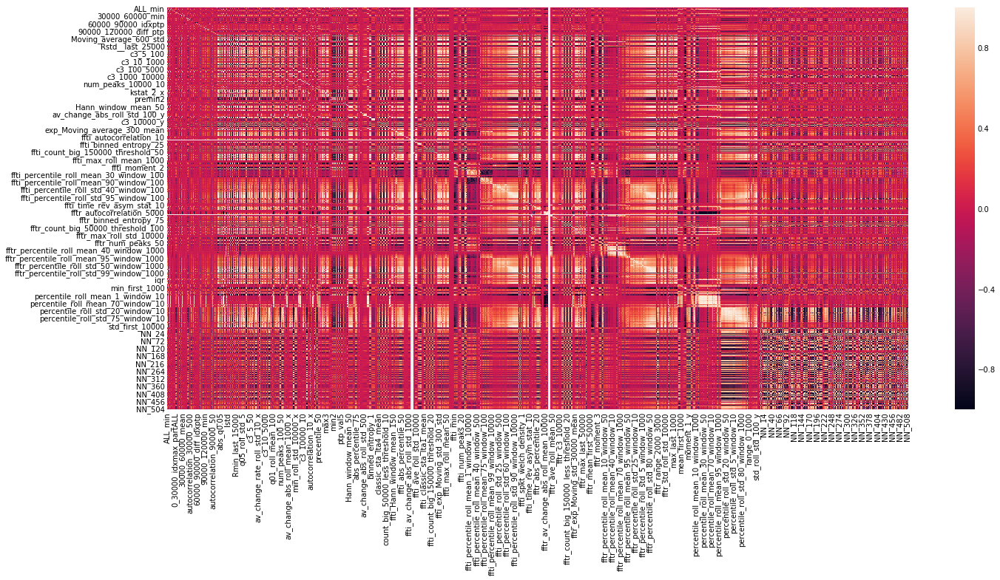

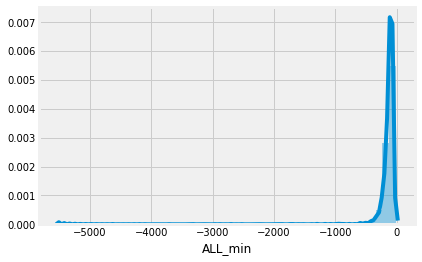

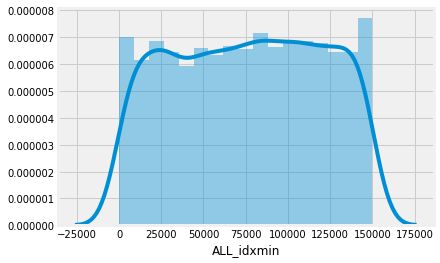

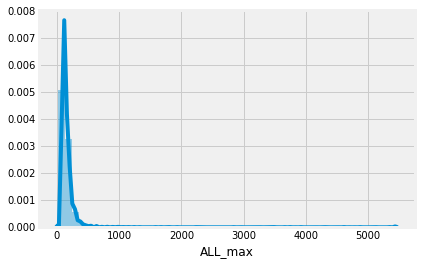

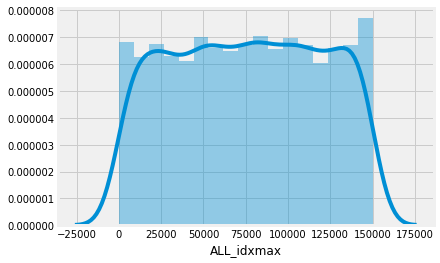

...

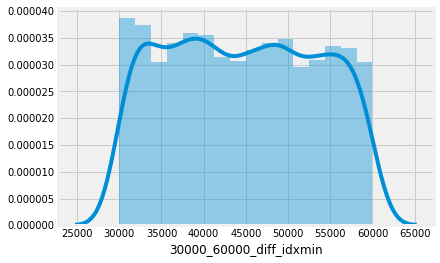

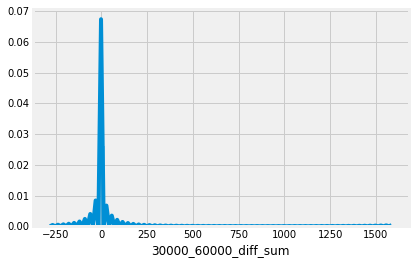

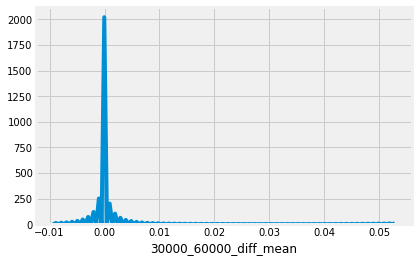

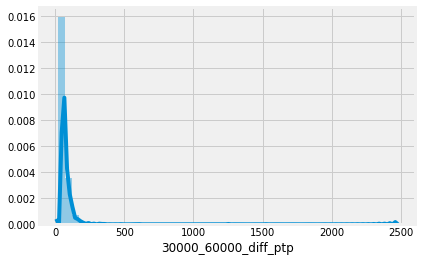

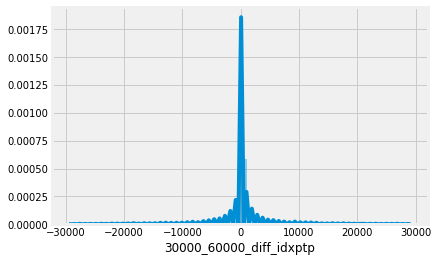

KeyboardInterrupt: 

In [73]:
plt.figure(figsize=(20, 10))

simple_analysis(
    df=X_train,
    cat_feat=None,
    target='time_to_failure'
)

## 5.5 Get skewed columns

In [26]:
pd.options.display.float_format = '{:,.4f}'.format

df_skew = data_skew(X_train)

columns_skew = df_skew[df_skew['uniq']==1]['column']
columns_skew = list(columns_skew.values)

df_skew

,column,skewness,uniq
2080,var_larger_than_std_dev,100.0000,1
1621,moment_1_y,100.0000,1
705,ffti_max_to_min,100.0000,1
706,ffti_max_to_min_diff,100.0000,1
724,ffti_med,100.0000,1
744,ffti_moment_1,100.0000,1
760,ffti_percentile_50,100.0000,1
993,ffti_var_larger_than_std_dev,100.0000,1
1052,fftr_av_change_rate_roll_mean_10,100.0000,1
1053,fftr_av_change_rate_roll_mean_100,100.0000,1


## 5.6 Get highly correlated columns

In [27]:
cols = list(X_train.columns)

try:
    cols.remove('time_to_failure')
except:
    print('Target is not there')
finally:
    cols.append('time_to_failure')

df_corr = X_train[cols].corr()

In [28]:
columns_corr = []

for r in tqdm_notebook(range(0, len(df_corr.index))):
    
    for c in df_corr.columns:
        
        if (df_corr.iloc[r][c] > .999) and (df_corr.index[r] != c):
            
            #print(df_corr.index[r], c)
            columns_corr.append(c)
            
columns_corr = np.unique(columns_corr)
columns_corr = list(columns_corr)
print(len(columns_corr))


842


## 5.7 Drop bad features

In [29]:
columns_drop = columns_skew + columns_corr

In [30]:
X_train.drop(labels=columns_drop, axis=1, inplace=True)

In [ ]:
step = 10

for i in tqdm_notebook(range(len(X_train.columns)-step)):
    
    plt.figure(figsize=(20, 10))
    
    cols = list(X_train.columns[i:i+step])
    try:
        cols.remove('time_to_failure')
    except:
        print('Target is not there')
    finally:
        cols.append('time_to_failure')

    sns.heatmap(
        data=X_train[cols].corr(),
        cmap='RdBu_r',
        annot=True,
        center=0.0
    )
    plt.title('Correlation between columns ' + str(i) + '-' + str(i+step))
    plt.show()

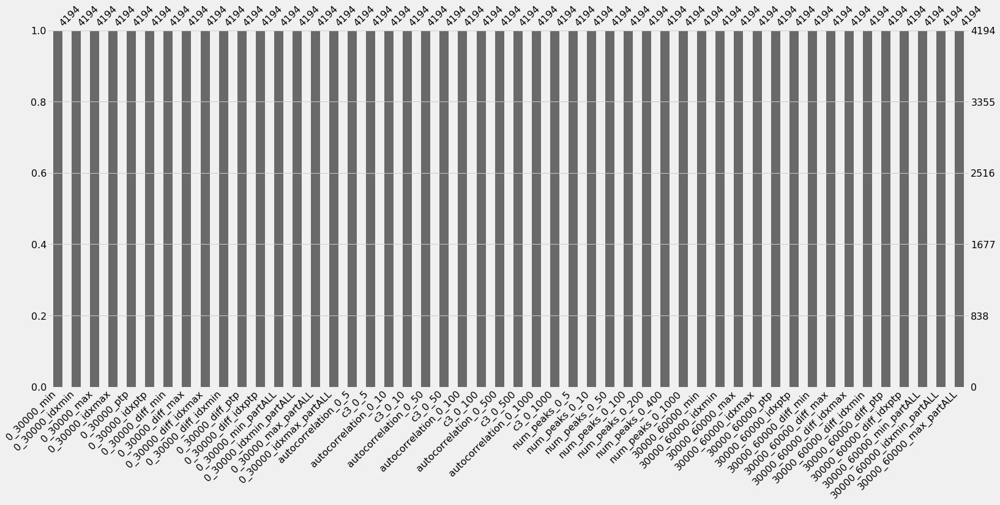

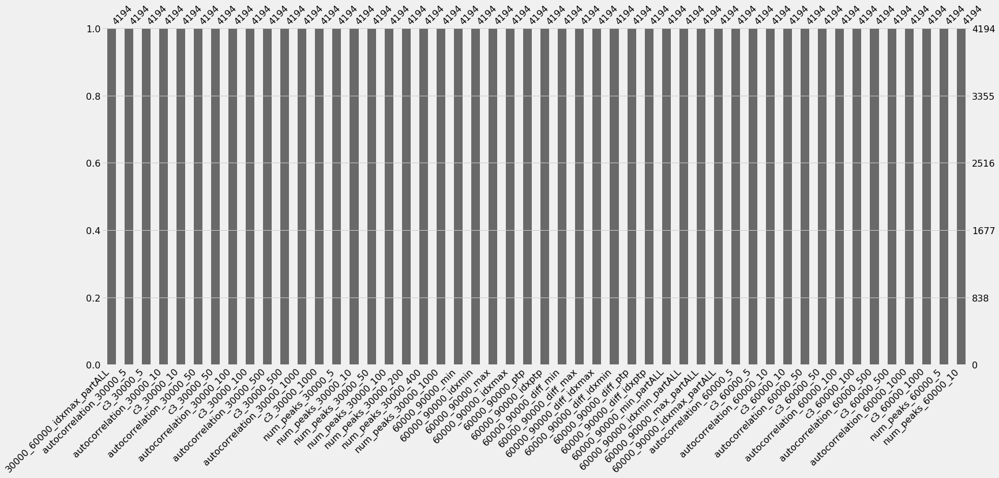

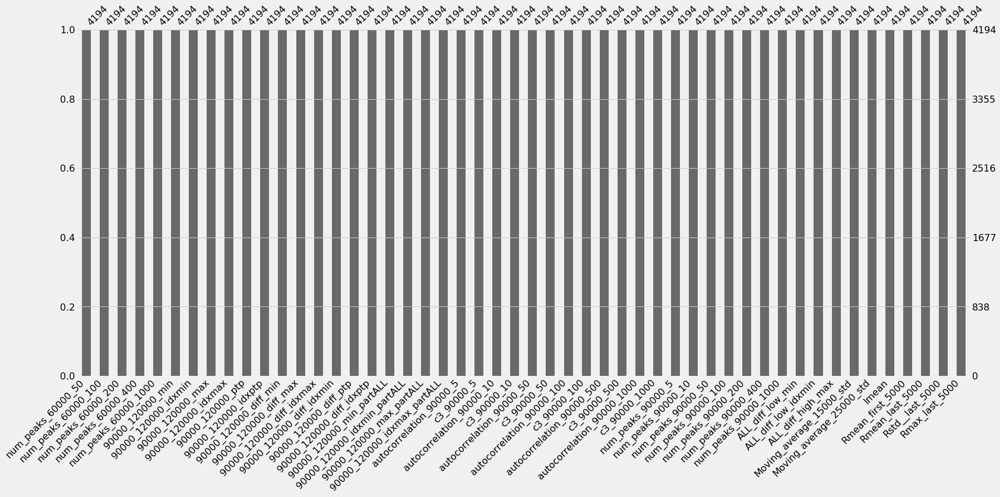

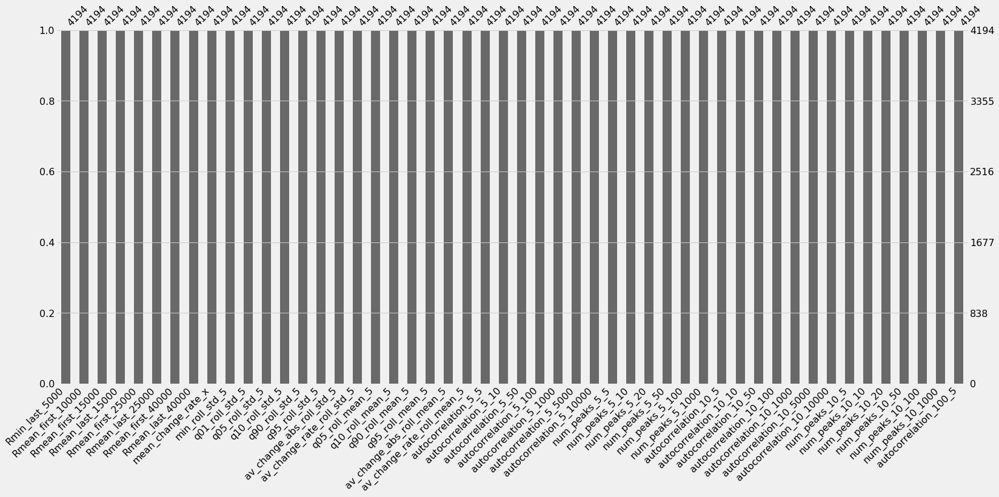

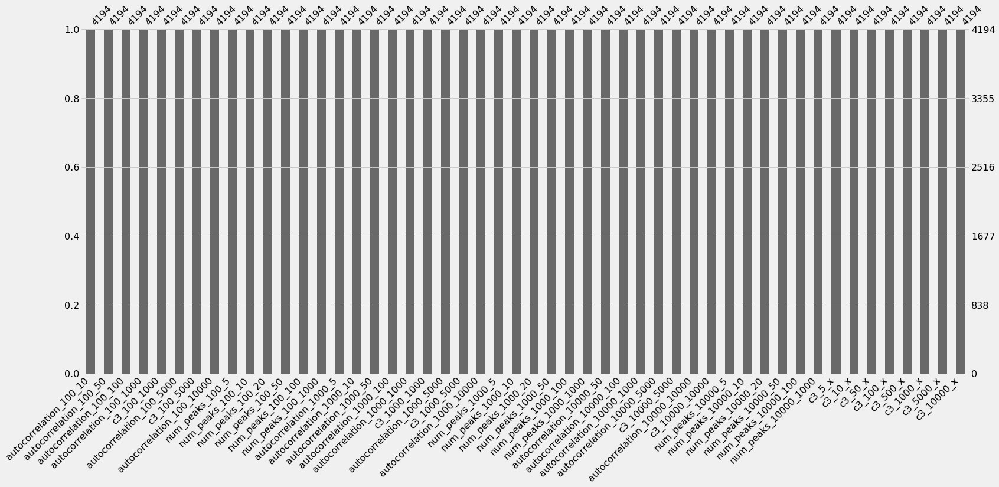

...

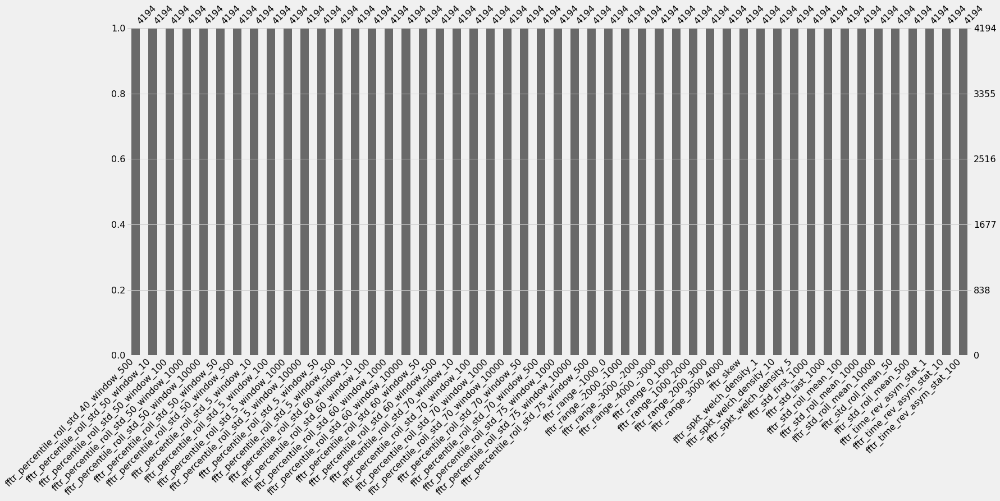

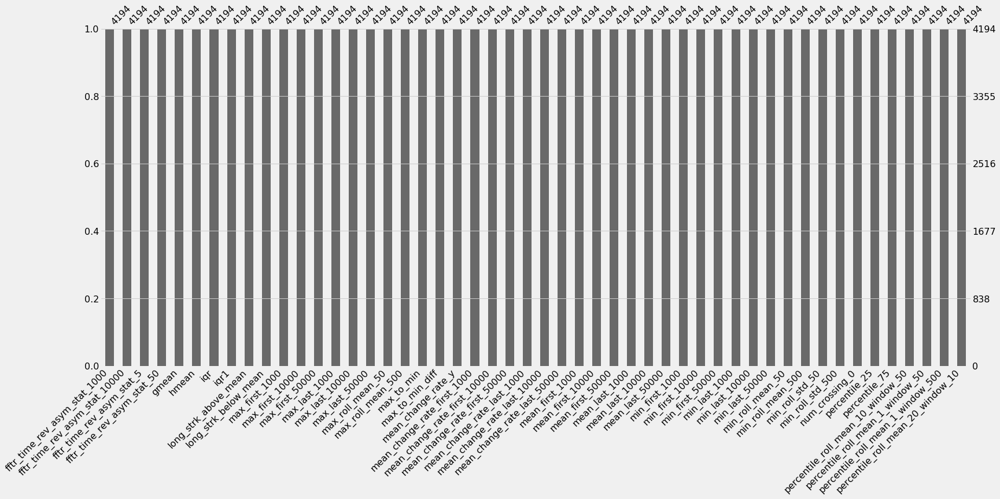

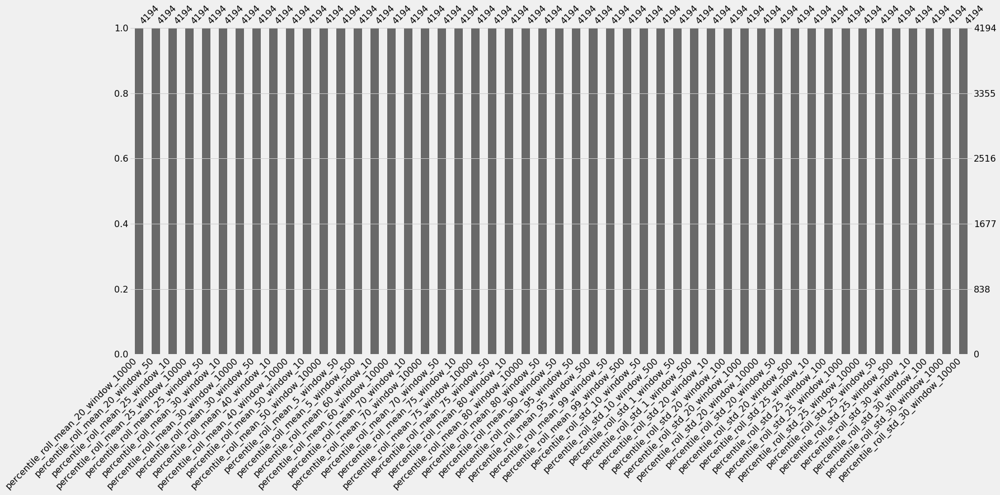

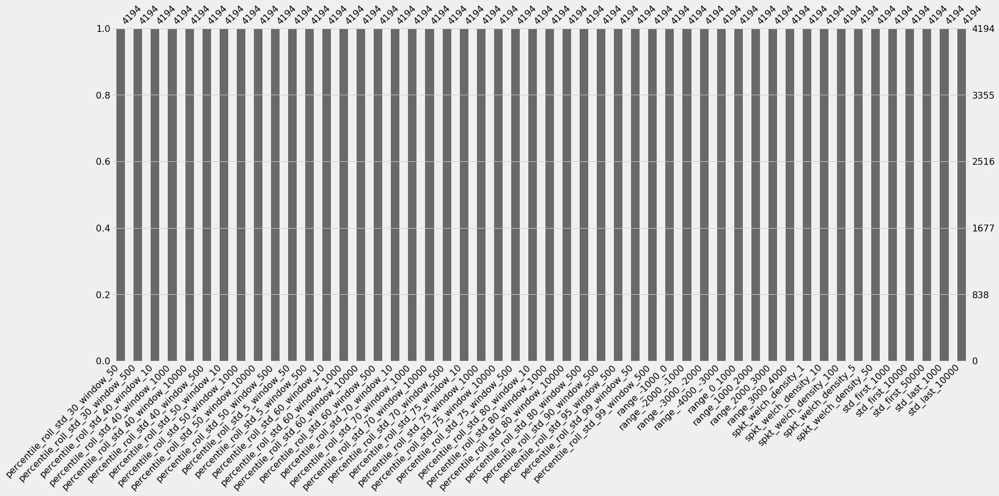

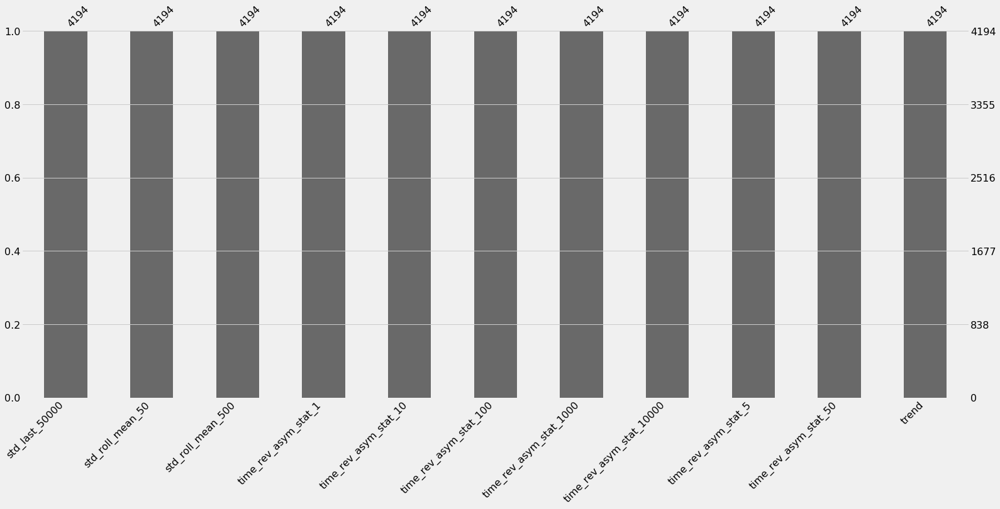

In [108]:
cols = list(X_train.drop(labels=['time_to_failure'], axis=1).columns)

l = len(cols)
inc = 0

for i in range(0, l, 50):
    
    if i==0:
        missingno.bar(X_train[cols[:i+50]])
    else:
        missingno.bar(X_train[cols[i:i+50]])

In [31]:
X_train.to_csv(path + 'X_train_clear.csv', index=None)

In [ ]:
X_train = pd.read_csv(path + 'X_train_clear.csv')

In [32]:
X_test = X_test[X_train.drop(labels=['time_to_failure'], axis=1).columns]

In [33]:
X_test.to_csv(path + 'X_test_clear.csv', index=None)

In [ ]:
X_test = pd.read_csv(path + 'X_test_clear.csv')

# 6. Prepaire final dataset

df_xgbst_feat_imp = pd.read_csv(path + 'df_xgbst_feat_imp.csv')
df_lgbm_feat_imp = pd.read_csv(path + 'df_lgbm_feat_imp.csv')
df_ctbst_feat_imp = pd.read_csv(path + 'df_ctbst_feat_imp.csv')

feat_xgbst = df_xgbst_feat_imp[df_xgbst_feat_imp['objective']=='huberobj'].sort_values(by=['importance'], ascending=False)['feature'].head(10).values
feat_lgbm = df_lgbm_feat_imp[df_lgbm_feat_imp['objective']=='huber'].sort_values(by=['importance'], ascending=False)['feature'].head(10).values
feat_ctbst = df_ctbst_feat_imp[df_ctbst_feat_imp['objective']=='MAE'].sort_values(by=['importance'], ascending=False)['feature'].head(10).values

feat_final = list(feat_xgbst) + list(feat_lgbm) + list(feat_ctbst)
feat_final = np.unique(feat_final)

print(len(feat_final))

feat = list(feat_final)

In [402]:
X_train = pd.read_csv(path + 'X_train_clear.csv')

target = 'time_to_failure'

submission = pd.read_csv(path + 'sample_submission.csv', index_col='seg_id')

X_test = pd.read_csv(path + 'X_test_clear.csv')
y_test_fake = np.ones(X_test.shape[0])

feat = list(X_test.columns)
cat_feat = []

y_train = X_train[target]
X_train = X_train[feat]

X_train = data_convert(
    df=X_train,
    col_exc='time_to_failure'
)

X_test = X_test[feat]

X_test = data_convert(
    df=X_test,
    col_exc=''
)

scaler = StandardScaler()
scaler.fit(X_train)

X_train = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)

X_train = pd.DataFrame(
    X_train,
    columns=feat
)

X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

0_30000_diff_max with type float64 converted to float32
0_30000_diff_min with type float64 converted to float32
0_30000_diff_ptp with type float64 converted to float32
0_30000_max with type float64 converted to float32
0_30000_max_partALL with type float64 converted to float32
0_30000_min with type float64 converted to float32
0_30000_min_partALL with type float64 converted to float32
0_30000_ptp with type float64 converted to float32
30000_60000_diff_max with type float64 converted to float32
30000_60000_diff_min with type float64 converted to float32
30000_60000_diff_ptp with type float64 converted to float32
30000_60000_max with type float64 converted to float32
30000_60000_max_partALL with type float64 converted to float32
30000_60000_min with type float64 converted to float32
30000_60000_min_partALL with type float64 converted to float32
30000_60000_ptp with type float64 converted to float32
60000_90000_diff_max with type float64 converted to float32
60000_90000_diff_min with type

ffti_av_change_abs_roll_std_100 with type float64 converted to float32
ffti_av_change_abs_roll_std_1000 with type float64 converted to float32
ffti_av_change_abs_roll_std_10000 with type float64 converted to float32
ffti_av_change_abs_roll_std_50 with type float64 converted to float32
ffti_av_change_abs_roll_std_500 with type float64 converted to float32
ffti_ave10 with type float64 converted to float32
ffti_ave_roll_mean_10 with type float64 converted to float32
ffti_ave_roll_mean_100 with type float64 converted to float32
ffti_ave_roll_mean_50 with type float64 converted to float32
ffti_ave_roll_mean_500 with type float64 converted to float32
ffti_binned_entropy_10 with type float64 converted to float32
ffti_binned_entropy_20 with type float64 converted to float32
ffti_binned_entropy_30 with type float64 converted to float32
ffti_binned_entropy_40 with type float64 converted to float32
ffti_binned_entropy_5 with type float64 converted to float32
ffti_binned_entropy_50 with type float

ffti_percentile_roll_std_25_window_10 with type float64 converted to float32
ffti_percentile_roll_std_25_window_100 with type float64 converted to float32
ffti_percentile_roll_std_25_window_1000 with type float64 converted to float32
ffti_percentile_roll_std_25_window_10000 with type float64 converted to float32
ffti_percentile_roll_std_25_window_50 with type float64 converted to float32
ffti_percentile_roll_std_25_window_500 with type float64 converted to float32
ffti_percentile_roll_std_30_window_10 with type float64 converted to float32
ffti_percentile_roll_std_30_window_100 with type float64 converted to float32
ffti_percentile_roll_std_30_window_1000 with type float64 converted to float32
ffti_percentile_roll_std_30_window_10000 with type float64 converted to float32
ffti_percentile_roll_std_30_window_50 with type float64 converted to float32
ffti_percentile_roll_std_30_window_500 with type float64 converted to float32
ffti_percentile_roll_std_40_window_10 with type float64 conver

fftr_percentile_roll_mean_20_window_100 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_1000 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_10000 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_50 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_500 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_10 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_100 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_1000 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_10000 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_50 with type float64 converted to float32
fftr_percentile_roll_mean_25_window_500 with type float64 converted to float32
fftr_percentile_roll_mean_30_window_10 with type float64 converted to float32
fftr_percentile_roll_mean_30_window_100 with type 

num_peaks_100_20 with type float64 converted to float32
num_peaks_100_5 with type float64 converted to float32
num_peaks_100_50 with type float64 converted to float32
num_peaks_10_10 with type float64 converted to float32
num_peaks_10_100 with type float64 converted to float32
num_peaks_10_1000 with type float64 converted to float32
num_peaks_10_20 with type float64 converted to float32
num_peaks_10_5 with type float64 converted to float32
num_peaks_10_50 with type float64 converted to float32
num_peaks_200 with type float64 converted to float32
num_peaks_30000_10 with type float64 converted to float32
num_peaks_30000_100 with type float64 converted to float32
num_peaks_30000_1000 with type float64 converted to float32
num_peaks_30000_200 with type float64 converted to float32
num_peaks_30000_400 with type float64 converted to float32
num_peaks_30000_5 with type float64 converted to float32
num_peaks_30000_50 with type float64 converted to float32
num_peaks_400 with type float64 conver

abs_percentile_60 with type float64 converted to float32
abs_percentile_70 with type float64 converted to float32
abs_percentile_75 with type float64 converted to float32
abs_percentile_80 with type float64 converted to float32
abs_percentile_90 with type float64 converted to float32
abs_trend with type float64 converted to float32
autocorrelation_0_10 with type float64 converted to float32
autocorrelation_0_100 with type float64 converted to float32
autocorrelation_0_1000 with type float64 converted to float32


IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



ffti_autocorrelation_10000 with type float64 converted to float32
ffti_autocorrelation_5 with type float64 converted to float32
ffti_autocorrelation_50 with type float64 converted to float32
ffti_autocorrelation_500 with type float64 converted to float32
ffti_autocorrelation_5000 with type float64 converted to float32
ffti_av_change_abs_roll_mean_10 with type float64 converted to float32
ffti_av_change_abs_roll_mean_100 with type float64 converted to float32
ffti_av_change_abs_roll_mean_50 with type float64 converted to float32
ffti_av_change_abs_roll_mean_500 with type float64 converted to float32
ffti_av_change_abs_roll_std_10 with type float64 converted to float32
ffti_av_change_abs_roll_std_100 with type float64 converted to float32
ffti_av_change_abs_roll_std_1000 with type float64 converted to float32
ffti_av_change_abs_roll_std_10000 with type float64 converted to float32
ffti_av_change_abs_roll_std_50 with type float64 converted to float32
ffti_av_change_abs_roll_std_500 with t

ffti_percentile_roll_std_1_window_50 with type float64 converted to float32
ffti_percentile_roll_std_1_window_500 with type float64 converted to float32
ffti_percentile_roll_std_20_window_10 with type float64 converted to float32
ffti_percentile_roll_std_20_window_100 with type float64 converted to float32
ffti_percentile_roll_std_20_window_1000 with type float64 converted to float32
ffti_percentile_roll_std_20_window_10000 with type float64 converted to float32
ffti_percentile_roll_std_20_window_50 with type float64 converted to float32
ffti_percentile_roll_std_20_window_500 with type float64 converted to float32
ffti_percentile_roll_std_25_window_10 with type float64 converted to float32
ffti_percentile_roll_std_25_window_100 with type float64 converted to float32
ffti_percentile_roll_std_25_window_1000 with type float64 converted to float32
ffti_percentile_roll_std_25_window_10000 with type float64 converted to float32
ffti_percentile_roll_std_25_window_50 with type float64 converte

fftr_percentile_roll_mean_10_window_50 with type float64 converted to float32
fftr_percentile_roll_mean_10_window_500 with type float64 converted to float32
fftr_percentile_roll_mean_1_window_100 with type float64 converted to float32
fftr_percentile_roll_mean_1_window_1000 with type float64 converted to float32
fftr_percentile_roll_mean_1_window_10000 with type float64 converted to float32
fftr_percentile_roll_mean_1_window_50 with type float64 converted to float32
fftr_percentile_roll_mean_1_window_500 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_10 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_100 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_1000 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_10000 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_50 with type float64 converted to float32
fftr_percentile_roll_mean_20_window_500 with type float

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



converted to float32
fftr_spkt_welch_density_10 with type float64 converted to float32
fftr_spkt_welch_density_5 with type float64 converted to float32
fftr_std_first_1000 with type float64 converted to float32
fftr_std_last_1000 with type float64 converted to float32
fftr_std_roll_mean_100 with type float64 converted to float32
fftr_std_roll_mean_1000 with type float64 converted to float32
fftr_std_roll_mean_10000 with type float64 converted to float32
fftr_std_roll_mean_50 with type float64 converted to float32
fftr_std_roll_mean_500 with type float64 converted to float32
fftr_time_rev_asym_stat_1 with type float64 converted to float32
fftr_time_rev_asym_stat_10 with type float64 converted to float32
fftr_time_rev_asym_stat_100 with type float64 converted to float32
fftr_time_rev_asym_stat_1000 with type float64 converted to float32
fftr_time_rev_asym_stat_10000 with type float64 converted to float32
fftr_time_rev_asym_stat_5 with type float64 converted to float32
fftr_time_rev_asym_

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:31: DataConversionWarning:

Data with input dtype uint8, uint16, float32, uint32 were all converted to float64 by StandardScaler.

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:38: DataConversionWarning:

Data with input dtype uint8, uint16, float32, uint32 were all converted to float64 by StandardScaler.



In [366]:
print(X_train.shape)
print(X_test.shape)

(4194, 1194)
(2624, 1194)


In [367]:
gc.collect()

74

In [368]:
for f in sorted(feat):
    print(f)

0_30000_diff_max
0_30000_diff_min
0_30000_diff_ptp
0_30000_max
0_30000_max_partALL
0_30000_min
0_30000_min_partALL
0_30000_ptp
30000_60000_diff_max
30000_60000_diff_min
30000_60000_diff_ptp
30000_60000_max
30000_60000_max_partALL
30000_60000_min
30000_60000_min_partALL
30000_60000_ptp
60000_90000_diff_max
60000_90000_diff_min
60000_90000_diff_ptp
60000_90000_max
60000_90000_max_partALL
60000_90000_min
60000_90000_min_partALL
60000_90000_ptp
90000_120000_diff_max
90000_120000_diff_min
90000_120000_diff_ptp
90000_120000_max
90000_120000_max_partALL
90000_120000_min
90000_120000_min_partALL
90000_120000_ptp
ALL_diff_high_max
ALL_diff_low_min
Hilbert_mean
Imean
Moving_average_15000_std
Moving_average_25000_std
Rmax_last_5000
Rmean_first_10000
Rmean_first_15000
Rmean_first_25000
Rmean_first_40000
Rmean_first_5000
Rmean_last_15000
Rmean_last_25000
Rmean_last_40000
Rmean_last_5000
Rmin_last_5000
Rstd__last_5000
abs_max_roll_mean_50
abs_max_roll_mean_500
abs_mean
abs_percentile_10
abs_percenti

fftr_binned_entropy_70
fftr_binned_entropy_75
fftr_binned_entropy_80
fftr_binned_entropy_90
fftr_binned_entropy_95
fftr_binned_entropy_99
fftr_c3_10
fftr_c3_100
fftr_c3_1000
fftr_c3_10000
fftr_c3_5
fftr_c3_50
fftr_c3_500
fftr_c3_5000
fftr_cid_ce_0
fftr_cid_ce_1
fftr_classic_sta_lta3_mean
fftr_classic_sta_lta5_mean
fftr_classic_sta_lta6_mean
fftr_classic_sta_lta7_mean
fftr_classic_sta_lta8_mean
fftr_count_above_mean
fftr_count_below_mean
fftr_count_big
fftr_count_big_100000_less_threshold_10
fftr_count_big_100000_less_threshold_100
fftr_count_big_100000_less_threshold_20
fftr_count_big_100000_less_threshold_5
fftr_count_big_100000_less_threshold_50
fftr_count_big_100000_threshold_10
fftr_count_big_100000_threshold_100
fftr_count_big_100000_threshold_20
fftr_count_big_100000_threshold_5
fftr_count_big_100000_threshold_50
fftr_count_big_150000_less_threshold_10
fftr_count_big_150000_less_threshold_100
fftr_count_big_150000_less_threshold_20
fftr_count_big_150000_less_threshold_5
fftr_coun

In [369]:
X_train.head(5)

,0_30000_diff_max,0_30000_diff_min,0_30000_diff_ptp,0_30000_max,0_30000_max_partALL,0_30000_min,0_30000_min_partALL,0_30000_ptp,30000_60000_diff_max,30000_60000_diff_min,...,std_roll_mean_50,std_roll_mean_500,time_rev_asym_stat_1,time_rev_asym_stat_10,time_rev_asym_stat_100,time_rev_asym_stat_1000,time_rev_asym_stat_10000,time_rev_asym_stat_5,time_rev_asym_stat_50,trend
0,-0.879630,0.867947,-0.881698,-0.754611,2.785833,0.539699,2.791471,-0.643292,-0.839118,0.805789,...,-0.595414,-0.755881,0.017890,0.023335,0.006848,0.021296,-0.034804,0.02342,-0.006624,-9.491700e+05
1,-0.879630,0.863636,-0.880581,-0.748204,2.785833,0.536554,2.791471,-0.640999,-0.792434,0.776631,...,-0.533280,-1.620366,0.017890,0.023335,0.006848,0.021296,-0.034804,0.02342,-0.006624,2.612086e+05
2,-0.877826,0.866222,-0.880804,-0.755193,-0.943883,0.540317,0.863698,-0.643602,-0.836005,0.800100,...,-0.514929,-1.044950,0.017889,0.023335,0.006848,0.021296,-0.034794,0.02342,-0.006624,1.145851e+06
3,-0.887748,0.879154,-0.886615,-0.757024,-4.734360,0.542508,-5.369316,-0.644654,-0.832893,0.799388,...,-0.456693,-1.041527,0.017890,0.023335,0.006848,0.021296,-0.034800,0.02342,-0.006624,4.721933e+05
4,-0.875120,0.867085,-0.880357,-0.755526,-1.568992,0.539812,0.230770,-0.643516,-0.829003,0.796544,...,-0.478602,-1.571151,0.017890,0.023335,0.006848,0.021296,-0.034797,0.02342,-0.006624,-1.954007e+05


In [370]:
X_test.head(5)

,0_30000_diff_max,0_30000_diff_min,0_30000_diff_ptp,0_30000_max,0_30000_max_partALL,0_30000_min,0_30000_min_partALL,0_30000_ptp,30000_60000_diff_max,30000_60000_diff_min,...,std_roll_mean_50,std_roll_mean_500,time_rev_asym_stat_1,time_rev_asym_stat_10,time_rev_asym_stat_100,time_rev_asym_stat_1000,time_rev_asym_stat_10000,time_rev_asym_stat_5,time_rev_asym_stat_50,trend
0,-0.011049,0.080573,-0.046523,0.292620,1.398204,-0.020962,1.418619,0.144815,-0.383674,0.315924,...,-0.139569,-0.120213,0.017810,0.023442,0.006719,0.021409,-0.039790,0.023455,-0.006644,-0.137389
1,-0.281346,0.139297,-0.210966,-0.300284,-0.940225,0.076471,-0.408516,-0.179056,0.257880,-0.590777,...,-0.061223,-0.112023,0.018539,0.024148,0.006785,0.021374,-0.033650,0.024121,-0.006176,1.077362
2,0.799840,-1.181981,0.999928,1.505793,1.398204,-0.905349,1.418619,1.187012,0.732071,-0.430771,...,-0.040198,-0.048285,0.019597,0.025163,0.006680,0.021645,-0.037958,0.025192,-0.006645,0.188516
3,-0.341412,0.403552,-0.375408,-0.446230,-0.692627,0.368768,-1.049801,-0.407426,-0.216312,0.049247,...,-0.180832,-0.159475,0.017929,0.023338,0.006931,0.021328,-0.035779,0.023464,-0.006692,-0.102324
4,-0.281346,0.198020,-0.240864,-0.309406,-1.121818,0.263841,-1.035408,-0.287012,0.174199,-0.084092,...,-0.088735,0.040803,0.017138,0.023935,0.007145,0.021204,-0.033205,0.023134,-0.006637,-0.841883


In [403]:
#you should skip categorical_feature setting in dataset and set in train if you gonna use gpu

X_train_lgb, X_test_lgb, y_train_lgb, y_test_lgb = train_test_split(
    X_train[feat],
    y_train,
    test_size=.1,
    random_state=random_state
)

X_test_lgb = X_test_lgb[feat]

X_train_lgb, X_valid_lgb, y_train_lgb, y_valid_lgb = train_test_split(
    X_train_lgb,
    y_train_lgb,
    test_size=.25,
    random_state=random_state
)

train_lgb_full = lgb.Dataset(
    data=X_train[feat],
    label=y_train,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

train_lgb = lgb.Dataset(
    data=X_train_lgb,
    label=y_train_lgb,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

valid_lgb = lgb.Dataset(
    data=X_valid_lgb,
    label=y_valid_lgb,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

test_lgb = lgb.Dataset(
    data=X_test_lgb,
    label=y_test_lgb,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

In [404]:
df_lgbm_pred = pd.DataFrame()
df_lgbm_feat_imp = pd.DataFrame()

fi_lgbm = pd.DataFrame(np.zeros(len(feat)))
fi_lgbm.columns = ['importance']
fi_lgbm['feature'] = feat

oof_lgbm = np.zeros(X_train.shape[0])
preds_lgbm = np.zeros(X_test.shape[0])

test_lgb = lgb.Dataset(
    data=X_test,
    label=y_test_fake,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

for f, (train_ind, valid_ind) in enumerate(folds.split(X_train, y_train)):

    print(
        '\n',
        'FOLD',
        f,
        '\n'
    )

    X_train_f, X_valid_f = X_train[feat].iloc[train_ind], X_train[feat].iloc[valid_ind]
    y_train_f, y_valid_f = y_train.iloc[train_ind], y_train.iloc[valid_ind]

    train_lgb = lgb.Dataset(
        data=X_train_f,
        label=y_train_f,
        reference=None,
        weight=None,
        group=None,
        init_score=None,
        silent=None,
        feature_name=feat,
        categorical_feature=cat_feat,
        params=None,
        free_raw_data=False #you should set is True if you don't wanna drop it by yourself
    )

    valid_lgb = lgb.Dataset(
        data=X_valid_f,
        label=y_valid_f,
        reference=None,
        weight=None,
        group=None,
        init_score=None,
        silent=None,
        feature_name=feat,
        categorical_feature=cat_feat,
        params=None,
        free_raw_data=False #you should set is True if you don't wanna drop it by yourself
    )

    params_cpu = {
    #Core Parameters
        #'config': '',
        'task': 'train',
        'objective': 'huber',
        'boosting': 'gbdt',
        #'data': '',
        #'valid': '',
        #num_iterations: 100000,
        'learning_rate': .01,
        'num_leaves': 180, #2^max_depth*70%
        #'tree_learner': 'serial',
        'num_threads': n_threads,
        'device_type': 'cpu',
        'seed': random_state,
    #Learning Control Parameters
        'max_depth': 8,
        'min_data_in_leaf': 20,
        'min_sum_hessian_in_leaf': 1e-3,
        'bagging_fraction': .75,
        'bagging_freq': 10,
        'bagging_seed': random_state,
        'feature_fraction': .47,
        'feature_fraction_seed': random_state,
        #'early_stopping_rounds': 100,
        'max_delta_step': 0.0,
        'lambda_l1': 0.0,
        'lambda_l2': 0.0,
        'min_gain_to_split': 0.0,
        #'drop_rate': .1, #dart
        #'max_dop': 50, #dart
        #skip_drop': .5, #dart
        #'xgboost_dart_mode': False, #dart
        #'uniform_drop': False, #dart
        #'drop_seed': random_state, #dart
        #'top_rate': .2, #goss
        #'oter_rate': .1, #goss
        'min_data_per_group': 100,
        'max_cat_threshold': 32,
        'cat_l2': 10.0,
        'cat_smooth': 10.0,
        'max_cat_to_onehot': 4,
        #'top_k': 20, #parallel
        'monotone_constraints': None,
        'feature_contri': None,
        'forcedsplits_filename': '',
        'refit_decay_rate': .9,
    #IO Parameters
        'verbosity': 1,
        'max_bin': 256,
        'min_data_in_bin': 3,
        'bin_construct_sample_cnt': 200000,
        'histogram_pool_size': -1.0,
        'data_random_seed': random_state,
        #'output_model': LightGBM_mode.txt, #model
        'snapshot_freq': -1,
        #'input_model': '', #model
        #'output_result': LightGBM_predict_result.txt, #model
        'initscore_filename': '',
        'valid_data_initscores': '',
        'pre_partition': False,
        'enable_bundle': True,
        'max_conflict_rate': 0.0,
        'is_enable_sparse': True,
        'sparse_threshold': .8,
        'use_missing': True,
        'zero_as_missing': False,
        'two_round': False,
        'save_binary': False,
        'enable_load_from_binary_file': True,
        'header': False,
        'label_column': '',
        'weight_column': '',
        'group_column': '',
        'ignore_column': '',
        #'categorial_feature': '', #train
        #'predict_raw_score': False, #predict
        #'predict_leaf_index': False, #predict
        #'predict_contrlib': False, #predict
        #'num_iterations_predict': -1, #predict
        #'pred_early_stop': False, #predict
        #'pred_early_stop_freq': 10, #predict
        #'pred_early_stop_margin': 10.0, #predict
        #'convert_model_language': '', #convert_model
        #'convert_model': 'gbdt_prediction_cpp', #convert_model
    #Objective Parameters
        #'num_class': 1, #multi_class
        #'is_unbalance': False, #binary
        #'scale_pos_weight': balance, #binary
        #'sigmoid': 1.0, #binary
        'boost_from_average': True,
        'reg_sqrt': False,
        'alpha': .9,
        'fair_c': 1.0,
        'poisson_max_delta_step': .7,
        'tweedie_variance_power': 1.5,
        #'max_position': 20, #lambdarank
        #'label_gain': 0,1,3,7,15,31,63,...,2^30-1, #lambdarank
    #Metric Parameters
        'metric': 'mae',
        'metric_freq': 1,
        'is_provide_training_metric': False,
    #Network Parameters
        'num_machines': 1,
        'local_listen_port': 12400,
        'time_out': 120,
        'machine_list_filename': '',
        'machines': '',
    #GPU Parameters
        'gpu_platform_id': 0,
        'gpu_device_id': 0,
        'gpu_use_dp': True
    }

    evals_result = {} 

    model = lgb.train(
        params=params_cpu,
        train_set=train_lgb,
        num_boost_round=50000,
        valid_sets=[train_lgb, valid_lgb],
        valid_names=None,
        fobj=None,
        feval=None,
        init_model=None,
        feature_name=feat, #for not lgbm dataset
        categorical_feature=cat_feat, #for not lgbm dataset
        early_stopping_rounds=500,
        evals_result=evals_result,
        verbose_eval=100,
        learning_rates=None,
        keep_training_booster=False,
        callbacks=None #[lgbm_callback(False)] it's so slow cause auc metric is not easy to calculate
    )

    fi_lgbm['importance'] = fi_lgbm['importance'] + model.feature_importance() / folds.n_splits

    oof_lgbm[valid_ind] = model.predict(
        data=valid_lgb.data,
        num_iteration=model.best_iteration,
        raw_score=False,
        pred_leaf=False,
        pred_contrib=False,
        data_has_header=False,
        is_reshape=True,
        pred_parameter=None
    )

    pred = model.predict(
        data=test_lgb.data,
        num_iteration=model.best_iteration,
        raw_score=False,
        pred_leaf=False,
        pred_contrib=False,
        data_has_header=False,
        is_reshape=True,
        pred_parameter=None
    )

    preds_lgbm += pred / n_folds

print('-'*100)
print(mean_absolute_error(y_train, oof_lgbm))
print('-'*100)


 FOLD 0 

Training until validation scores don't improve for 500 rounds.
[100]	training's l1: 2.58883	valid_1's l1: 2.73806
[200]	training's l1: 2.20646	valid_1's l1: 2.48106
[300]	training's l1: 1.90035	valid_1's l1: 2.2994
[400]	training's l1: 1.66175	valid_1's l1: 2.19143
[500]	training's l1: 1.47426	valid_1's l1: 2.13196
[600]	training's l1: 1.32372	valid_1's l1: 2.10337
[700]	training's l1: 1.20451	valid_1's l1: 2.09047
[800]	training's l1: 1.10174	valid_1's l1: 2.08294
[900]	training's l1: 1.01212	valid_1's l1: 2.07806
[1000]	training's l1: 0.928715	valid_1's l1: 2.07685
[1100]	training's l1: 0.854694	valid_1's l1: 2.07527
[1200]	training's l1: 0.791944	valid_1's l1: 2.07269
[1300]	training's l1: 0.738097	valid_1's l1: 2.07255
[1400]	training's l1: 0.688806	valid_1's l1: 2.07333
[1500]	training's l1: 0.641855	valid_1's l1: 2.0731
[1600]	training's l1: 0.599105	valid_1's l1: 2.07281
[1700]	training's l1: 0.558825	valid_1's l1: 2.07358
Early stopping, best iteration is:
[1272]	tra

[<matplotlib.lines.Line2D at 0x1e61ab798d0>]

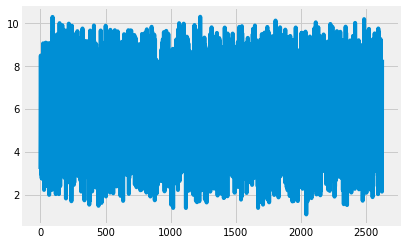

In [409]:
plt.plot(preds_lgbm)

In [405]:
feat_best = list(fi_lgbm.sort_values(by=['importance'], ascending=[False])['feature'].head(15).values)

In [406]:
for f in feat_best:
    
    print(f)

percentile_roll_std_10_window_500
autocorrelation_60000_10
percentile_roll_std_20_window_1000
percentile_roll_std_20_window_500
fftr_range_-3000_-2000
percentile_roll_std_25_window_500
min_roll_std_50
percentile_roll_std_5_window_50
percentile_roll_std_25_window_1000
percentile_roll_std_5_window_500
percentile_roll_std_25_window_100
ffti_mean_change_rate_first_50000
autocorrelation_60000_500
percentile_roll_std_20_window_100
ffti_percentile_roll_std_50_window_100


In [407]:
feat_best = [
    'percentile_roll_std_10_window_500',
    'autocorrelation_60000_10',
    'percentile_roll_std_20_window_1000',
    'percentile_roll_std_20_window_500',
    'fftr_range_-3000_-2000',
    'percentile_roll_std_25_window_500',
    'min_roll_std_50',
    'percentile_roll_std_5_window_50',
    'percentile_roll_std_25_window_1000',
    'percentile_roll_std_5_window_500',
    'percentile_roll_std_25_window_100',
    'ffti_mean_change_rate_first_50000',
    'autocorrelation_60000_500',
    'percentile_roll_std_20_window_100',
    'ffti_percentile_roll_std_50_window_100'
]

In [408]:
feat = feat_best

X_test = X_test[feat]

In [410]:
#you should skip categorical_feature setting in dataset and set in train if you gonna use gpu

X_train_lgb, X_test_lgb, y_train_lgb, y_test_lgb = train_test_split(
    X_train[feat],
    y_train,
    test_size=.1,
    random_state=random_state
)

X_test_lgb = X_test_lgb[feat]

X_train_lgb, X_valid_lgb, y_train_lgb, y_valid_lgb = train_test_split(
    X_train_lgb,
    y_train_lgb,
    test_size=.25,
    random_state=random_state
)

train_lgb_full = lgb.Dataset(
    data=X_train[feat],
    label=y_train,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

train_lgb = lgb.Dataset(
    data=X_train_lgb,
    label=y_train_lgb,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

valid_lgb = lgb.Dataset(
    data=X_valid_lgb,
    label=y_valid_lgb,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

test_lgb = lgb.Dataset(
    data=X_test_lgb,
    label=y_test_lgb,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

In [411]:
df_lgbm_pred = pd.DataFrame()
df_lgbm_feat_imp = pd.DataFrame()

fi_lgbm = pd.DataFrame(np.zeros(len(feat)))
fi_lgbm.columns = ['importance']
fi_lgbm['feature'] = feat

oof_lgbm = np.zeros(X_train.shape[0])
preds_lgbm = np.zeros(X_test.shape[0])

test_lgb = lgb.Dataset(
    data=X_test,
    label=y_test_fake,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

for f, (train_ind, valid_ind) in enumerate(folds.split(X_train, y_train)):

    print(
        '\n',
        'FOLD',
        f,
        '\n'
    )

    X_train_f, X_valid_f = X_train[feat].iloc[train_ind], X_train[feat].iloc[valid_ind]
    y_train_f, y_valid_f = y_train.iloc[train_ind], y_train.iloc[valid_ind]

    train_lgb = lgb.Dataset(
        data=X_train_f,
        label=y_train_f,
        reference=None,
        weight=None,
        group=None,
        init_score=None,
        silent=None,
        feature_name=feat,
        categorical_feature=cat_feat,
        params=None,
        free_raw_data=False #you should set is True if you don't wanna drop it by yourself
    )

    valid_lgb = lgb.Dataset(
        data=X_valid_f,
        label=y_valid_f,
        reference=None,
        weight=None,
        group=None,
        init_score=None,
        silent=None,
        feature_name=feat,
        categorical_feature=cat_feat,
        params=None,
        free_raw_data=False #you should set is True if you don't wanna drop it by yourself
    )

    params_cpu = {
    #Core Parameters
        #'config': '',
        'task': 'train',
        'objective': 'huber',
        'boosting': 'gbdt',
        #'data': '',
        #'valid': '',
        #num_iterations: 100000,
        'learning_rate': .01,
        'num_leaves': 180, #2^max_depth*70%
        #'tree_learner': 'serial',
        'num_threads': n_threads,
        'device_type': 'cpu',
        'seed': random_state,
    #Learning Control Parameters
        'max_depth': 8,
        'min_data_in_leaf': 20,
        'min_sum_hessian_in_leaf': 1e-3,
        'bagging_fraction': .75,
        'bagging_freq': 10,
        'bagging_seed': random_state,
        'feature_fraction': .47,
        'feature_fraction_seed': random_state,
        #'early_stopping_rounds': 100,
        'max_delta_step': 0.0,
        'lambda_l1': 0.0,
        'lambda_l2': 0.0,
        'min_gain_to_split': 0.0,
        #'drop_rate': .1, #dart
        #'max_dop': 50, #dart
        #skip_drop': .5, #dart
        #'xgboost_dart_mode': False, #dart
        #'uniform_drop': False, #dart
        #'drop_seed': random_state, #dart
        #'top_rate': .2, #goss
        #'oter_rate': .1, #goss
        'min_data_per_group': 100,
        'max_cat_threshold': 32,
        'cat_l2': 10.0,
        'cat_smooth': 10.0,
        'max_cat_to_onehot': 4,
        #'top_k': 20, #parallel
        'monotone_constraints': None,
        'feature_contri': None,
        'forcedsplits_filename': '',
        'refit_decay_rate': .9,
    #IO Parameters
        'verbosity': 1,
        'max_bin': 256,
        'min_data_in_bin': 3,
        'bin_construct_sample_cnt': 200000,
        'histogram_pool_size': -1.0,
        'data_random_seed': random_state,
        #'output_model': LightGBM_mode.txt, #model
        'snapshot_freq': -1,
        #'input_model': '', #model
        #'output_result': LightGBM_predict_result.txt, #model
        'initscore_filename': '',
        'valid_data_initscores': '',
        'pre_partition': False,
        'enable_bundle': True,
        'max_conflict_rate': 0.0,
        'is_enable_sparse': True,
        'sparse_threshold': .8,
        'use_missing': True,
        'zero_as_missing': False,
        'two_round': False,
        'save_binary': False,
        'enable_load_from_binary_file': True,
        'header': False,
        'label_column': '',
        'weight_column': '',
        'group_column': '',
        'ignore_column': '',
        #'categorial_feature': '', #train
        #'predict_raw_score': False, #predict
        #'predict_leaf_index': False, #predict
        #'predict_contrlib': False, #predict
        #'num_iterations_predict': -1, #predict
        #'pred_early_stop': False, #predict
        #'pred_early_stop_freq': 10, #predict
        #'pred_early_stop_margin': 10.0, #predict
        #'convert_model_language': '', #convert_model
        #'convert_model': 'gbdt_prediction_cpp', #convert_model
    #Objective Parameters
        #'num_class': 1, #multi_class
        #'is_unbalance': False, #binary
        #'scale_pos_weight': balance, #binary
        #'sigmoid': 1.0, #binary
        'boost_from_average': True,
        'reg_sqrt': False,
        'alpha': .9,
        'fair_c': 1.0,
        'poisson_max_delta_step': .7,
        'tweedie_variance_power': 1.5,
        #'max_position': 20, #lambdarank
        #'label_gain': 0,1,3,7,15,31,63,...,2^30-1, #lambdarank
    #Metric Parameters
        'metric': 'mae',
        'metric_freq': 1,
        'is_provide_training_metric': False,
    #Network Parameters
        'num_machines': 1,
        'local_listen_port': 12400,
        'time_out': 120,
        'machine_list_filename': '',
        'machines': '',
    #GPU Parameters
        'gpu_platform_id': 0,
        'gpu_device_id': 0,
        'gpu_use_dp': True
    }

    evals_result = {} 

    model = lgb.train(
        params=params_cpu,
        train_set=train_lgb,
        num_boost_round=50000,
        valid_sets=[train_lgb, valid_lgb],
        valid_names=None,
        fobj=None,
        feval=None,
        init_model=None,
        feature_name=feat, #for not lgbm dataset
        categorical_feature=cat_feat, #for not lgbm dataset
        early_stopping_rounds=500,
        evals_result=evals_result,
        verbose_eval=100,
        learning_rates=None,
        keep_training_booster=False,
        callbacks=None #[lgbm_callback(False)] it's so slow cause auc metric is not easy to calculate
    )

    fi_lgbm['importance'] = fi_lgbm['importance'] + model.feature_importance() / folds.n_splits

    oof_lgbm[valid_ind] = model.predict(
        data=valid_lgb.data,
        num_iteration=model.best_iteration,
        raw_score=False,
        pred_leaf=False,
        pred_contrib=False,
        data_has_header=False,
        is_reshape=True,
        pred_parameter=None
    )

    pred = model.predict(
        data=test_lgb.data,
        num_iteration=model.best_iteration,
        raw_score=False,
        pred_leaf=False,
        pred_contrib=False,
        data_has_header=False,
        is_reshape=True,
        pred_parameter=None
    )

    preds_lgbm += pred / n_folds

print('-'*100)
print(mean_absolute_error(y_train, oof_lgbm))
print('-'*100)


 FOLD 0 

Training until validation scores don't improve for 500 rounds.
[100]	training's l1: 2.64536	valid_1's l1: 2.73702
[200]	training's l1: 2.3299	valid_1's l1: 2.48994
[300]	training's l1: 2.09509	valid_1's l1: 2.3249
[400]	training's l1: 1.93035	valid_1's l1: 2.22167
[500]	training's l1: 1.81857	valid_1's l1: 2.16222
[600]	training's l1: 1.74079	valid_1's l1: 2.13443
[700]	training's l1: 1.68191	valid_1's l1: 2.12041
[800]	training's l1: 1.6363	valid_1's l1: 2.11223
[900]	training's l1: 1.5986	valid_1's l1: 2.10757
[1000]	training's l1: 1.5629	valid_1's l1: 2.10567
[1100]	training's l1: 1.53262	valid_1's l1: 2.10641
[1200]	training's l1: 1.50437	valid_1's l1: 2.10548
[1300]	training's l1: 1.48125	valid_1's l1: 2.10773
[1400]	training's l1: 1.45729	valid_1's l1: 2.10938
[1500]	training's l1: 1.43516	valid_1's l1: 2.11148
[1600]	training's l1: 1.41628	valid_1's l1: 2.11236
[1700]	training's l1: 1.39653	valid_1's l1: 2.11309
Early stopping, best iteration is:
[1204]	training's l1:

In [412]:
#%%time

'''
Tune Parameters for the Leaf-wise (Best-first) Tree
LightGBM uses the leaf-wise tree growth algorithm, while many other popular tools use depth-wise tree growth.
Compared with depth-wise growth, the leaf-wise algorithm can converge much faster.
However, the leaf-wise growth may be over-fitting if not used with the appropriate parameters.

To get good results using a leaf-wise tree, these are some important parameters:

num_leaves. This is the main parameter to control the complexity of the tree model.
Theoretically, we can set num_leaves = 2^(max_depth) to obtain the same number of leaves as depth-wise tree.
However, this simple conversion is not good in practice.
The reason is that a leaf-wise tree is typically much deeper than a depth-wise tree for a fixed number of leaves.
Unconstrained depth can induce over-fitting.
Thus, when trying to tune the num_leaves, we should let it be smaller than 2^(max_depth).
For example, when the max_depth=7 the depth-wise tree can get good accuracy, 
but setting num_leaves to 127 may cause over-fitting, and setting it to 70 or 80 may get better accuracy than depth-wise.

min_data_in_leaf.
This is a very important parameter to prevent over-fitting in a leaf-wise tree.
Its optimal value depends on the number of training samples and num_leaves.
Setting it to a large value can avoid growing too deep a tree, but may cause under-fitting.
In practice, setting it to hundreds or thousands is enough for a large dataset.

max_depth. You also can use max_depth to limit the tree depth explicitly.
'''

train_results = []
valid_results = []

depths = range(1, 17, 1)

for d in tqdm_notebook(depths):

    n_l = int(np.power(2, d)*.6)
    
    if n_l==1:
        n_l += 1
    
    model = lgb.LGBMModel(
        boosting_type='gbdt',
        num_leaves=n_l,
        max_depth=d,
        learning_rate=.01,
        n_estimators=50000,
        sumsample_for_bin=2000000,
        objective='huber',
        class_weight=None,
        min_split_gain=.0,
        min_child_weight=.001,
        min_child_samples=20,
        subsample=.75,
        subsample_freq=10,
        colsample_bytree=.47,
        reg_alpha=0.0,
        reg_lambda=0.0,
        random_state=random_state,
        n_jobs=n_threads,
        silent=True,
        ##**kwargs:
    #Core Parameters
        #config=,
        task='train',
        #objective='regression',
        #boosting='gbdt',
        #data='',
        #valid='',
        #num_iterations=100000,
        #learning_rate=.01,
        #num_leaves=180, #2^max_depth*70%
        #tree_learner=serial,
        num_threads=n_threads,
        device_type='cpu',
        #seed=random_state,
    #Learning Control Parameters
        #max_depth=8,
        min_data_in_leaf=20,
        min_sum_hessian_in_leaf=1e-3,
        #bagging_fraction=.75,
        #bagging_freq=2,
        bagging_seed=random_state,
        #feature_fraction=.75,
        feature_fraction_seed=random_state,
        #early_stopping_rounds=100,
        max_delta_step=0.0,
        #lambda_l1=0.0,
        #lambda_l2=0.0,
        min_gain_to_split=0.0,
        #drop_rate=.1, #dart
        #max_dop=50, #dart
        #skip_drop=.5, #dart
        #xgboost_dart_mode=False, #dart
        #uniform_drop=False, #dart
        #drop_seed=random_state, #dart
        #top_rate=.2, #goss
        #oter_rate=.1, #goss
        min_data_per_group=100,
        max_cat_threshold=32,
        cat_l2=10.0,
        cat_smooth=10.0,
        max_cat_to_onehot=4,
        #top_k=20, #parallel
        monotone_constraints=None,
        feature_contri=None,
        forcedsplits_filename='',
        refit_decay_rate=.9,
    #IO Parameters
        verbosity=1,
        max_bin=256,
        min_data_in_bin=3,
        bin_construct_sample_cnt=200000,
        histogram_pool_size=-1.0,
        data_random_seed=random_state,
        #output_model=LightGBM_mode.txt, #model
        snapshot_freq=-1,
        #input_model=, #model
        #output_result=LightGBM_predict_result.txt, #model
        initscore_filename='',
        valid_data_initscores='',
        pre_partition=False,
        enable_bundle=True,
        max_conflict_rate=0.0,
        is_enable_sparse=True,
        sparse_threshold=.8,
        use_missing=True,
        zero_as_missing=False,
        two_round=False,
        save_binary=False,
        enable_load_from_binary_file=True,
        header=False,
        #label_column='',
        #weight_column='',
        #group_column='',
        #ignore_column='',
        #categorial_feature='', #train
        #predict_raw_score=False, #predict
        #predict_leaf_index=False, #predict
        #predict_contrlib=False, #predict
        #num_iterations_predict=-1, #predict
        #pred_early_stop=False, #predict
        #pred_early_stop_freq=10, #predict
        #pred_early_stop_margin=10.0, #predict
        #convert_model_language=, #convert_model
        #convert_model=gbdt_prediction_cpp, #convert_model
    #Objective Parameters
        #num_class=1, #multi_class
        #is_unbalance=False, #binary
        #scale_pos_weight=balance, #binary
        #sigmoid=1.0, #binary
        boost_from_average=True,
        reg_sqrt=False,
        alpha=.9,
        fair_c=1.0,
        poisson_max_delta_step=.7,
        tweedie_variance_power=1.5,
        #max_position=20, #lambdarank
        #label_gain=0,1,3,7,15,31,63,...,2^30-1, #lambdarank
    #Metric Parameters
        metric='mae',
        metric_freq=1,
        is_provide_training_metric=False,
    #Network Parameters
        num_machines=1,
        local_listen_port=12400,
        time_out=120,
        machine_list_filename='',
        machines='',
    #GPU Parameters
        gpu_platform_id=0,
        gpu_device_id=0,
        gpu_use_dp=True
    )

    model.fit(
        X=train_lgb.data,
        y=train_lgb.get_label(),
        sample_weight=None,
        init_score=None,
        group=None,
        eval_set=[(train_lgb.data, train_lgb.get_label()), (valid_lgb.data, valid_lgb.get_label())],
        eval_names=None,
        eval_sample_weight=None,
        eval_class_weight=None,
        eval_init_score=None,
        eval_group=None,
        eval_metric='mae',
        early_stopping_rounds=500,
        verbose=False,
        #feature_name=feat, #for not lgbm dataset
        #categorical_feature=cat_feat, #for not lgbm dataset
        callbacks=None
    )

    y_pred_train = model.predict(
        X=train_lgb.data,
        raw_score=False,
        num_iteration=model.best_iteration_,
        pred_leaf=False,
        pred_contrib=False
    )

    y_pred_test = model.predict(
        X=test_lgb.data,
        raw_score=False,
        num_iteration=model.best_iteration_,
        pred_leaf=False,
        pred_contrib=False
    )
    
    train_results.append(mean_absolute_error(train_lgb.get_label(), y_pred_train))
    valid_results.append(mean_absolute_error(test_lgb.get_label(), y_pred_test))
    
plot_vc(
    x=[d for d in depths],
    y_train=train_results,
    y_valid=valid_results,
    xlabel='DEPTH'
)

In [413]:
model = lgb.LGBMModel(
    boosting_type='gbdt',
    num_leaves=10,
    max_depth=4,
    learning_rate=.01,
    n_estimators=50000,
    sumsample_for_bin=2000000,
    objective='huber',
    class_weight=None,
    min_split_gain=.0,
    min_child_weight=.001,
    min_child_samples=20,
    subsample=.75,
    subsample_freq=10,
    colsample_bytree=.47,
    reg_alpha=0.0,
    reg_lambda=0.0,
    random_state=random_state,
    n_jobs=n_threads,
    silent=True,
    ##**kwargs:
#Core Parameters
    #config=,
    task='train',
    #objective='regression',
    #boosting='gbdt',
    #data='',
    #valid='',
    #num_iterations=100000,
    #learning_rate=.01,
    #num_leaves=180, #2^max_depth*70%
    #tree_learner=serial,
    num_threads=n_threads,
    device_type='cpu',
    #seed=random_state,
#Learning Control Parameters
    #max_depth=8,
    min_data_in_leaf=20,
    min_sum_hessian_in_leaf=1e-3,
    #bagging_fraction=.75,
    #bagging_freq=2,
    bagging_seed=random_state,
    #feature_fraction=.75,
    feature_fraction_seed=random_state,
    #early_stopping_rounds=100,
    max_delta_step=0.0,
    #lambda_l1=0.0,
    #lambda_l2=0.0,
    min_gain_to_split=0.0,
    #drop_rate=.1, #dart
    #max_dop=50, #dart
    #skip_drop=.5, #dart
    #xgboost_dart_mode=False, #dart
    #uniform_drop=False, #dart
    #drop_seed=random_state, #dart
    #top_rate=.2, #goss
    #oter_rate=.1, #goss
    min_data_per_group=100,
    max_cat_threshold=32,
    cat_l2=10.0,
    cat_smooth=10.0,
    max_cat_to_onehot=4,
    #top_k=20, #parallel
    monotone_constraints=None,
    feature_contri=None,
    forcedsplits_filename='',
    refit_decay_rate=.9,
#IO Parameters
    verbosity=1,
    max_bin=256,
    min_data_in_bin=3,
    bin_construct_sample_cnt=200000,
    histogram_pool_size=-1.0,
    data_random_seed=random_state,
    #output_model=LightGBM_mode.txt, #model
    snapshot_freq=-1,
    #input_model=, #model
    #output_result=LightGBM_predict_result.txt, #model
    initscore_filename='',
    valid_data_initscores='',
    pre_partition=False,
    enable_bundle=True,
    max_conflict_rate=0.0,
    is_enable_sparse=True,
    sparse_threshold=.8,
    use_missing=True,
    zero_as_missing=False,
    two_round=False,
    save_binary=False,
    enable_load_from_binary_file=True,
    header=False,
    #label_column='',
    #weight_column='',
    #group_column='',
    #ignore_column='',
    #categorial_feature='', #train
    #predict_raw_score=False, #predict
    #predict_leaf_index=False, #predict
    #predict_contrlib=False, #predict
    #num_iterations_predict=-1, #predict
    #pred_early_stop=False, #predict
    #pred_early_stop_freq=10, #predict
    #pred_early_stop_margin=10.0, #predict
    #convert_model_language=, #convert_model
    #convert_model=gbdt_prediction_cpp, #convert_model
#Objective Parameters
    #num_class=1, #multi_class
    #is_unbalance=False, #binary
    #scale_pos_weight=balance, #binary
    #sigmoid=1.0, #binary
    boost_from_average=True,
    reg_sqrt=False,
    alpha=.9,
    fair_c=1.0,
    poisson_max_delta_step=.7,
    tweedie_variance_power=1.5,
    #max_position=20, #lambdarank
    #label_gain=0,1,3,7,15,31,63,...,2^30-1, #lambdarank
#Metric Parameters
    metric='mae',
    metric_freq=1,
    is_provide_training_metric=False,
#Network Parameters
    num_machines=1,
    local_listen_port=12400,
    time_out=120,
    machine_list_filename='',
    machines='',
#GPU Parameters
    gpu_platform_id=0,
    gpu_device_id=0,
    gpu_use_dp=True
)

param_grid = {
    #'boosting_type': ['gbdt'],#, 'gbrt', 'rf'],
    #'learning_rate': [float(x) for x in np.linspace(start=.01, stop=.01, num=1)],
    #'n_estimators': [int(x) for x in np.linspace(start=50000, stop=50000, num=1)],
    #'max_depth': [int(x) for x in np.linspace(start=4, stop=4, num=1)],
    'min_data_in_leaf': [int(x) for x in np.linspace(start=10, stop=100, num=5)],
    'min_sum_hessian_in_leaf': [float(x) for x in np.linspace(start=0.1, stop=40, num=5)],
    'bagging_fraction': [float(x) for x in np.linspace(start=0.1, stop=.9, num=5)],
    'bagging_freq': [int(x) for x in np.linspace(start=1, stop=10, num=5)],
    'feature_fraction': [float(x) for x in np.linspace(start=0.1, stop=.9, num=5)],
    #'num_leaves': [int(np.power(2, x)*.7) for x in np.linspace(start=3, stop=3, num=1)],
    #'num_leaves': [int(x) for x in np.linspace(start=10, stop=10, num=1)],
    'max_bin': [int(x) for x in np.linspace(start=3, stop=255, num=5)], #it will crash your python.exe if you start from 2
    #'min_data_per_group': [int(x) for x in np.linspace(start=10, stop=200, num=5)],
    #'min_data_in_bin': [int(x) for x in np.linspace(start=3, stop=30, num=5)],
    'lambda_l1': [float(x) for x in np.linspace(start=0., stop=1., num=5)],
    'lambda_l2': [float(x) for x in np.linspace(start=0., stop=1., num=5)],
    #'boost_from_average': [True, False]
}

train_grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    scoring='neg_mean_absolute_error',
    cv=5,
    n_jobs=n_threads,
    verbose=True
)

train_grid.fit(
    X=train_lgb.data,
    y=train_lgb.get_label(),
    sample_weight=None,
    init_score=None,
    #group=None, #LGBMModel
    eval_set=[(train_lgb.data, train_lgb.get_label()), (valid_lgb.data, valid_lgb.get_label())],
    eval_names=None,
    eval_sample_weight=None,
    eval_class_weight=None,
    eval_init_score=None,
    #eval_group=None, #LGBMModel
    eval_metric='mae',
    early_stopping_rounds=500,
    verbose=100,
    #feature_name=feat, #for not lgbm dataset
    #categorical_feature=cat_feat, #for not lgbm dataset
    callbacks=None
)

y_pred = train_grid.best_estimator_.predict(
    X=test_lgb.data,
    raw_score=False,
    num_iteration=train_grid.best_estimator_.best_iteration_,
    pred_leaf=False,
    pred_contrib=False
)

print(
    '\n',
    'MAE score:',
    mean_absolute_error(test_lgb.get_label(), y_pred),
)

print(train_grid.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=11)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=11)]: Done  28 tasks      | elapsed:   31.4s
[Parallel(n_jobs=11)]: Done  50 out of  50 | elapsed:   45.3s finished


Training until validation scores don't improve for 500 rounds.
[100]	training's l1: 2.67734	valid_1's l1: 2.81458
[200]	training's l1: 2.42101	valid_1's l1: 2.55107
[300]	training's l1: 2.24035	valid_1's l1: 2.35876
[400]	training's l1: 2.12172	valid_1's l1: 2.23181
[500]	training's l1: 2.04624	valid_1's l1: 2.15981
[600]	training's l1: 2.00037	valid_1's l1: 2.12302
[700]	training's l1: 1.97101	valid_1's l1: 2.09711
[800]	training's l1: 1.95034	valid_1's l1: 2.08142
[900]	training's l1: 1.93458	valid_1's l1: 2.0714
[1000]	training's l1: 1.92087	valid_1's l1: 2.06445
[1100]	training's l1: 1.90867	valid_1's l1: 2.05961
[1200]	training's l1: 1.89759	valid_1's l1: 2.05574
[1300]	training's l1: 1.88709	valid_1's l1: 2.05301
[1400]	training's l1: 1.87762	valid_1's l1: 2.05106
[1500]	training's l1: 1.86892	valid_1's l1: 2.04961
[1600]	training's l1: 1.86008	valid_1's l1: 2.04879
[1700]	training's l1: 1.85199	valid_1's l1: 2.04781
[1800]	training's l1: 1.84505	valid_1's l1: 2.04672
[1900]	trai

In [387]:
X_train_raw = pd.read_csv(path + 'train.csv', dtype={'acoustic_data': np.int16, 'time_to_failure': np.float32})

In [323]:
rows = 150000
segments = int(np.floor(X_train_raw.shape[0] / rows))
print("Number of segments: ", segments)

Number of segments:  4194


In [388]:
train_X = pd.DataFrame(index=range(segments), dtype=np.float64)
train_y = pd.DataFrame(index=range(segments), dtype=np.float64, columns=['time_to_failure'])

In [389]:
for seg_id in tqdm_notebook(range(segments)):
    
    seg = X_train_raw.iloc[seg_id*rows:seg_id*rows+rows]
    
    x = pd.Series(seg['acoustic_data'].values)
    
    train_X.loc[seg_id, 'kurt'] = x.kurtosis()
    #train_X.loc[seg_id, 'mean'] = x.mean()
    #train_X.loc[seg_id, 'med'] = x.median()
    train_X.loc[seg_id, 'skew'] = x.skew()
    train_X.loc[seg_id, 'mad'] = x.mad()
    #train_X.loc[seg_id, 'sum'] = x.sum()
    #train_X.loc[seg_id, 'min'] = x.min()
    train_X.loc[seg_id, 'max'] = x.max()
    #train_X.loc[seg_id, 'var'] = x.var()
    train_X.loc[seg_id, 'std'] = x.std()
    
    train_X.loc[seg_id, 'q01'] = np.quantile(x, .01)
    train_X.loc[seg_id, 'q05'] = np.quantile(x, .05)
    #train_X.loc[seg_id, 'q25'] = np.quantile(x, .25)
    #train_X.loc[seg_id, 'q50'] = np.quantile(x, .50)
    #train_X.loc[seg_id, 'q75'] = np.quantile(x, .75)
    train_X.loc[seg_id, 'q95'] = np.quantile(x, .95)
    train_X.loc[seg_id, 'q99'] = np.quantile(x, .99)
    
    train_y.loc[seg_id, 'time_to_failure'] = seg['time_to_failure'].values[-1]

In [416]:
test_X = pd.DataFrame(columns=train_X.columns, dtype=np.float64, index=submission.index)

for seg_id in tqdm_notebook(test_X.index):
    
    seg = pd.read_csv(path + 'test/' + seg_id + '.csv')
    
    x = pd.Series(seg['acoustic_data'].values)
    
    test_X.loc[seg_id, 'kurt'] = x.kurtosis()
    #test_X.loc[seg_id, 'mean'] = x.mean()
    #test_X.loc[seg_id, 'med'] = x.median()
    test_X.loc[seg_id, 'skew'] = x.skew()
    test_X.loc[seg_id, 'mad'] = x.mad()
    #test_X.loc[seg_id, 'sum'] = x.sum()
    #test_X.loc[seg_id, 'min'] = x.min()
    test_X.loc[seg_id, 'max'] = x.max()
    #test_X.loc[seg_id, 'var'] = x.var()
    test_X.loc[seg_id, 'std'] = x.std()
    
    test_X.loc[seg_id, 'q01'] = np.quantile(x, .01)
    test_X.loc[seg_id, 'q05'] = np.quantile(x, .05)
    #test_X.loc[seg_id, 'q25'] = np.quantile(x, .25)
    #test_X.loc[seg_id, 'q50'] = np.quantile(x, .50)
    #test_X.loc[seg_id, 'q75'] = np.quantile(x, .75)
    test_X.loc[seg_id, 'q95'] = np.quantile(x, .95)
    test_X.loc[seg_id, 'q99'] = np.quantile(x, .99)

In [467]:
def plot_feat(df, feat):

    fig, ax1 = plt.subplots(figsize=(20, 10))
    plt.plot(df[feat], color='r')
    ax1.set_ylabel(feat, color='r')
    plt.legend([feat], loc=(0.01, 0.95))
    
    ax2 = ax1.twinx()
    plt.plot(train_y, color='b')
    ax2.set_ylabel('time to failure', color='b')
    plt.legend(['time to failure'], loc=(0.01, 0.9))
    plt.grid(True)
        
    plt.show()
    plt.close()

In [481]:
def plot_feat_test(f):

    plt.figure(figsize=(20, 10))

    plt.plot(test_X[f].values, color='r')

    plt.show()

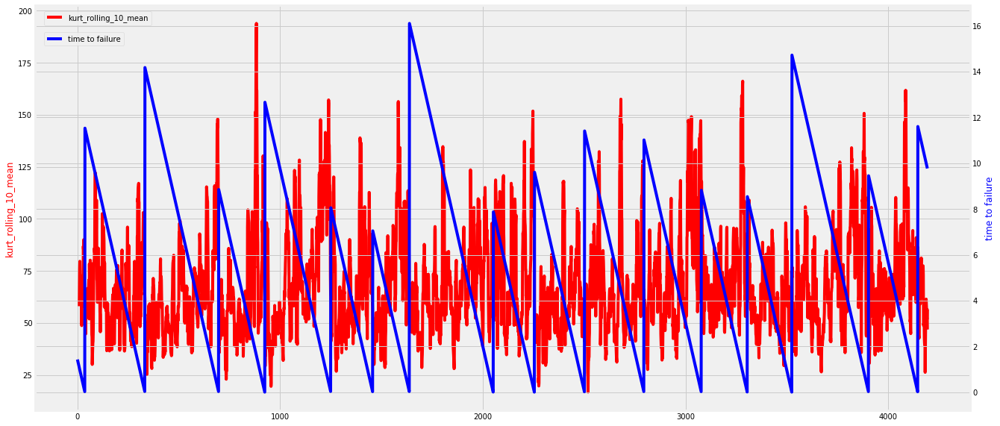

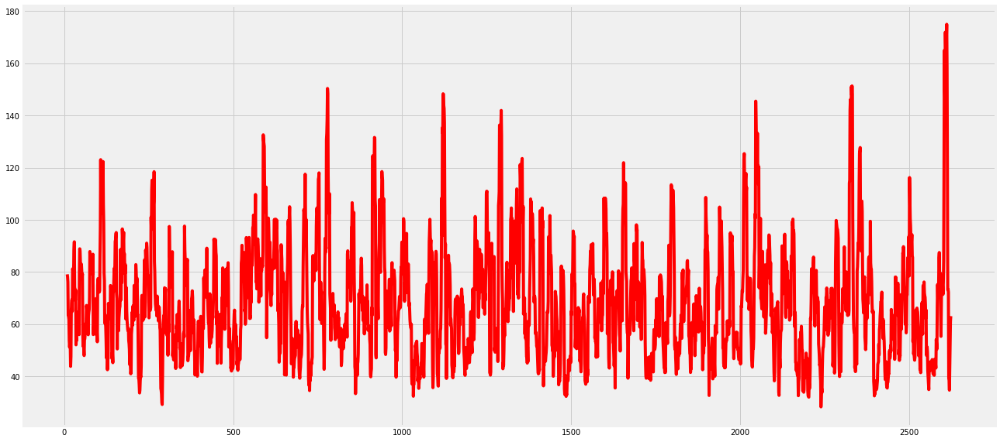

In [483]:
train_X['kurt_rolling_10_mean'] = train_X['kurt'].rolling(10).mean()
test_X['kurt_rolling_10_mean'] = test_X['kurt'].rolling(10).mean()

plot_feat(train_X, 'kurt_rolling_10_mean')
plot_feat_test('kurt_rolling_10_mean')

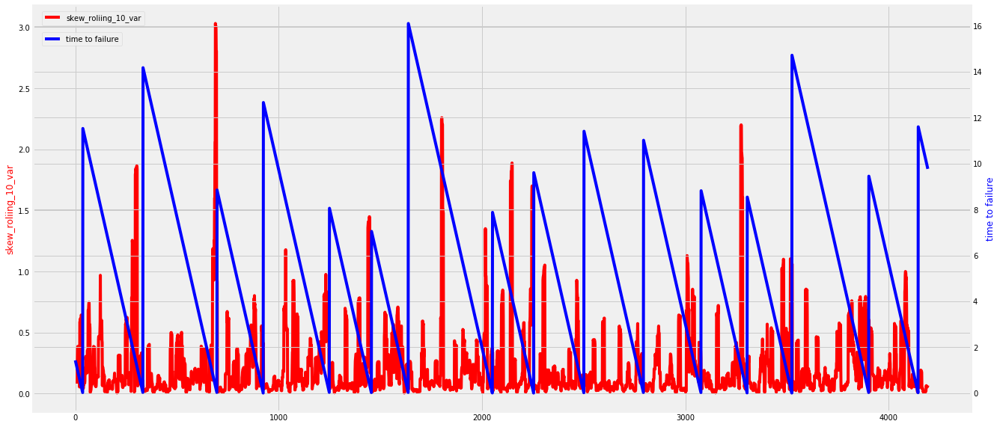

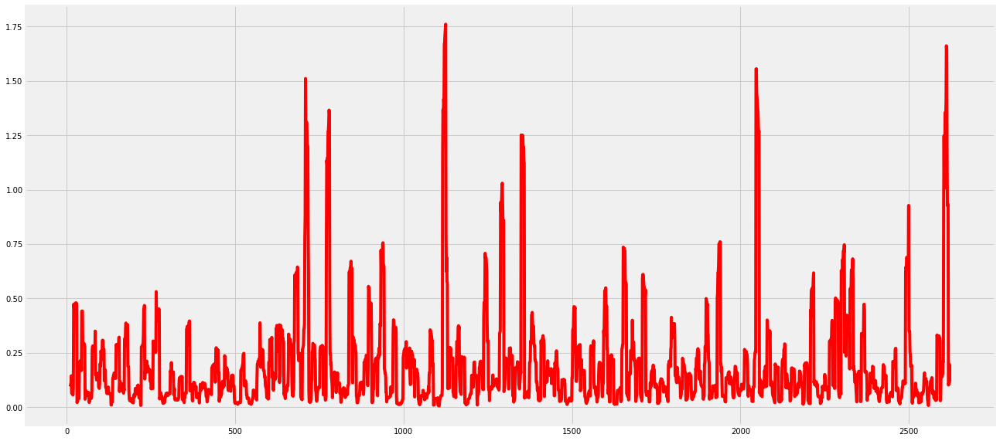

In [484]:
train_X['skew_roliing_10_var'] = train_X['skew'].rolling(10).var()
test_X['skew_roliing_10_var'] = test_X['skew'].rolling(10).var()

plot_feat(train_X, 'skew_roliing_10_var')
plot_feat_test('skew_roliing_10_var')

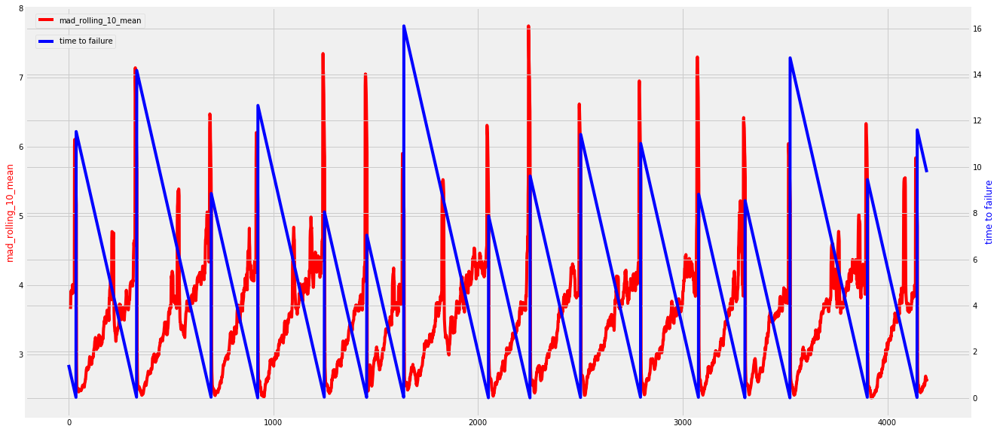

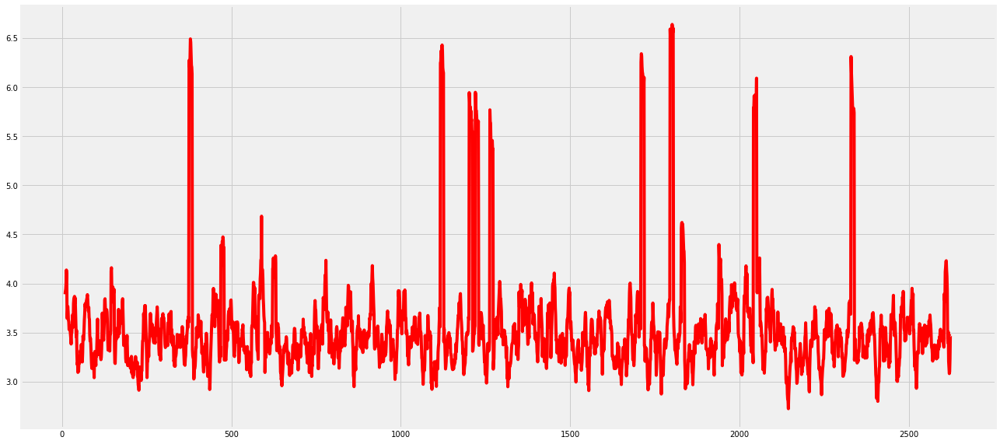

In [486]:
train_X['mad_rolling_10_mean'] = train_X['mad'].rolling(10).mean()
test_X['mad_rolling_10_mean'] = test_X['mad'].rolling(10).mean()

plot_feat(train_X, 'mad_rolling_10_mean')
plot_feat_test('mad_rolling_10_mean')

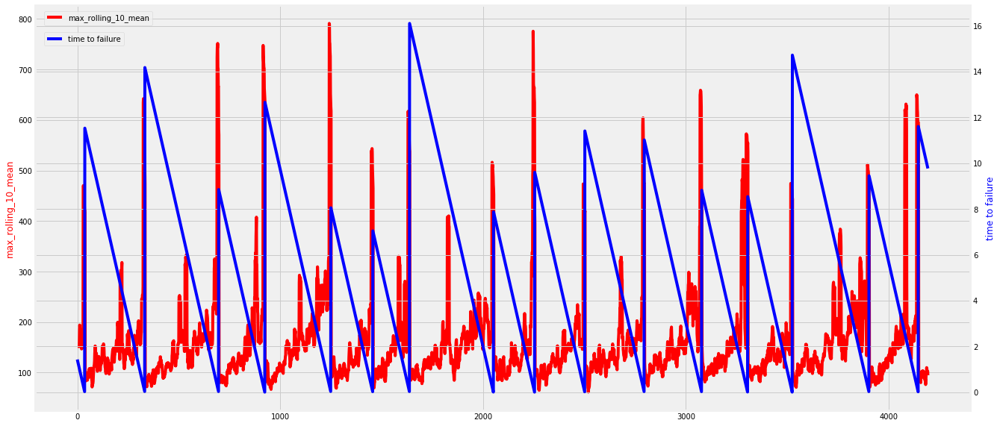

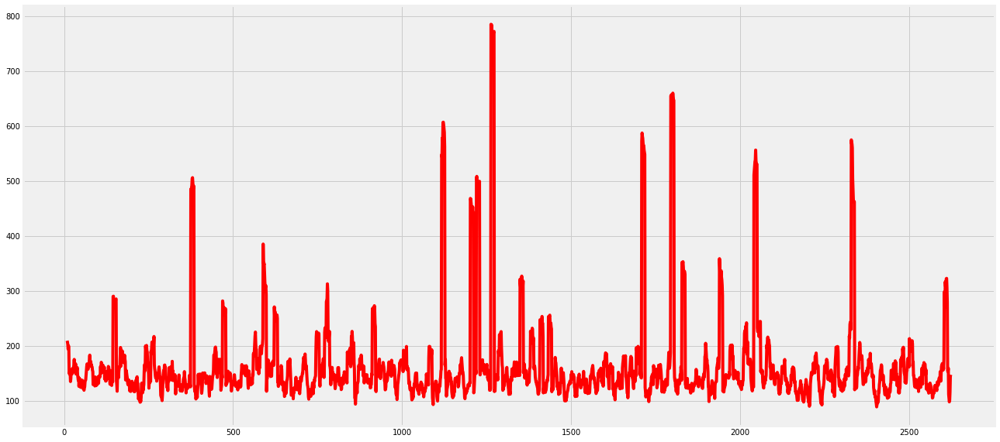

In [487]:
train_X['max_rolling_10_mean'] = train_X['max'].rolling(10).mean()
test_X['max_rolling_10_mean'] = test_X['max'].rolling(10).mean()

plot_feat(train_X, 'max_rolling_10_mean')
plot_feat_test('max_rolling_10_mean')

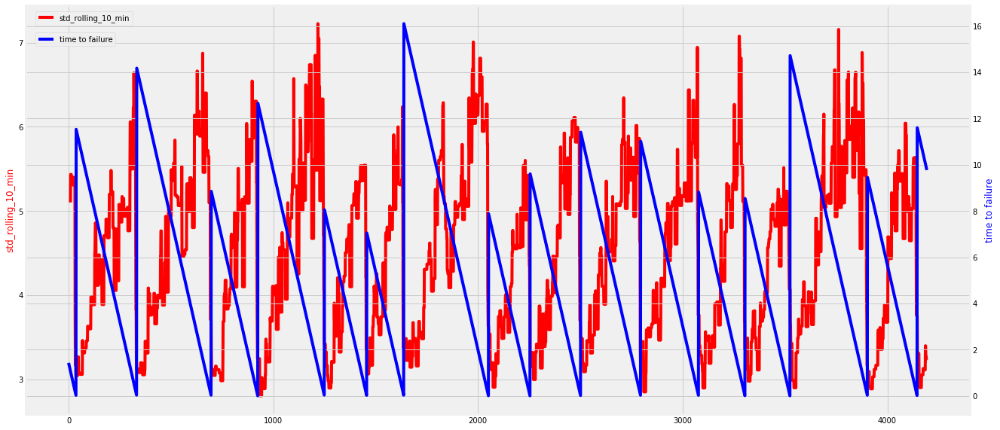

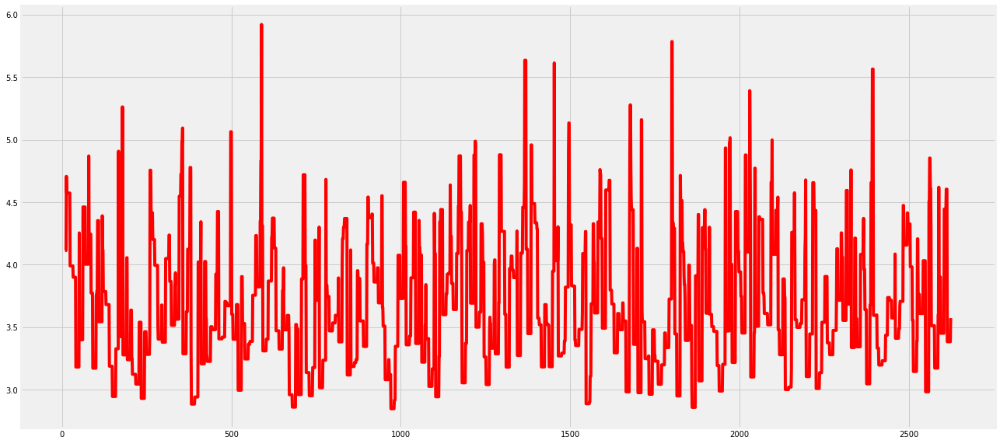

In [488]:
train_X['std_rolling_10_min'] = train_X['std'].rolling(10).min()
test_X['std_rolling_10_min'] = test_X['std'].rolling(10).min()

plot_feat(train_X, 'std_rolling_10_min')
plot_feat_test('std_rolling_10_min')

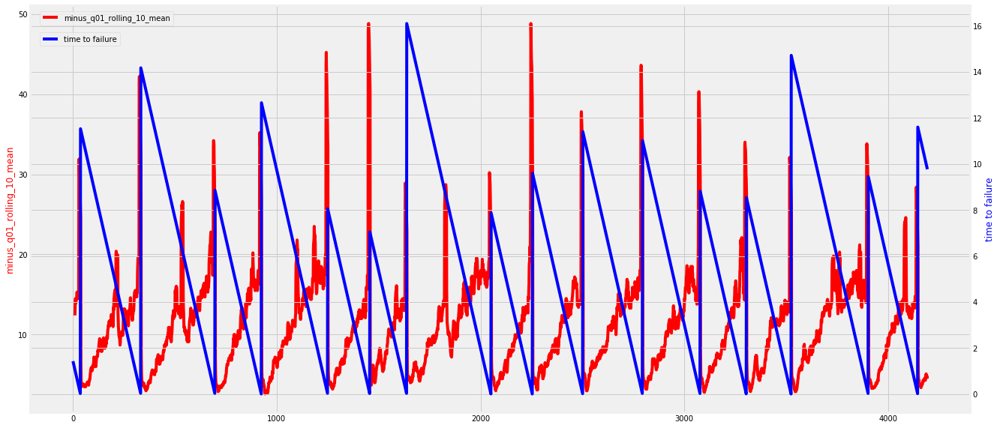

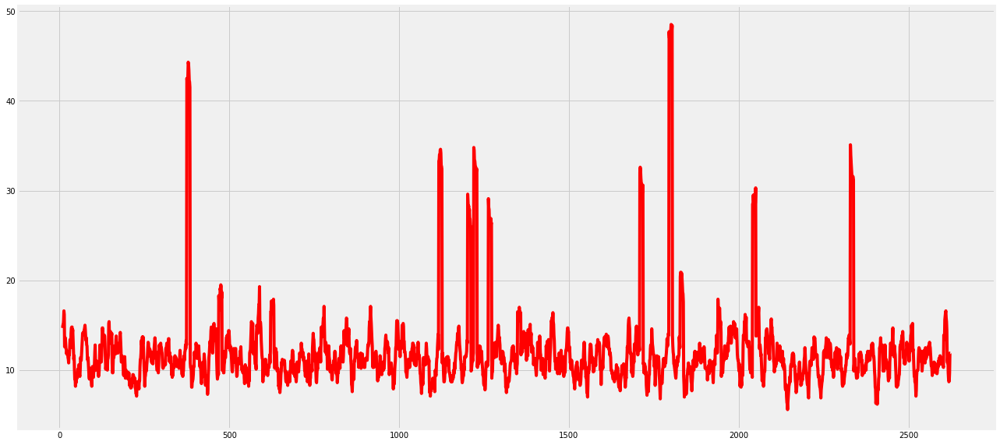

In [489]:
train_X['minus_q01_rolling_10_mean'] = -train_X['q01'].rolling(10).mean()
test_X['minus_q01_rolling_10_mean'] = -test_X['q01'].rolling(10).mean()

plot_feat(train_X, 'minus_q01_rolling_10_mean')
plot_feat_test('minus_q01_rolling_10_mean')

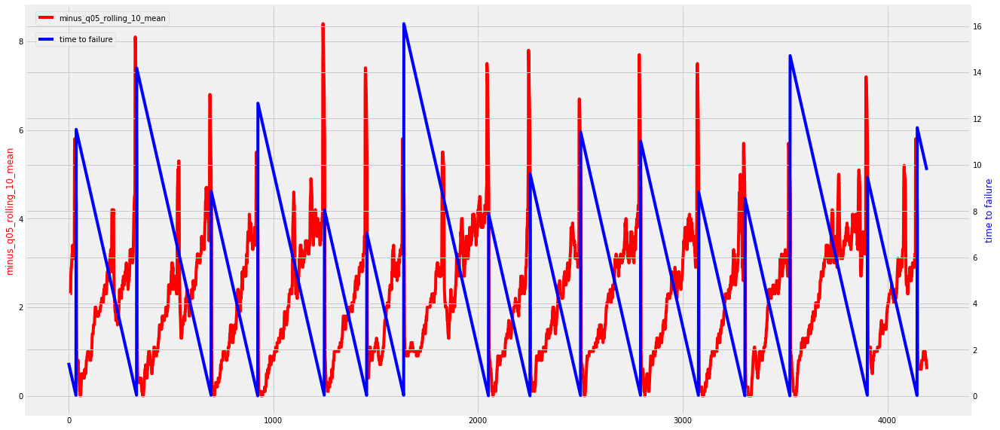

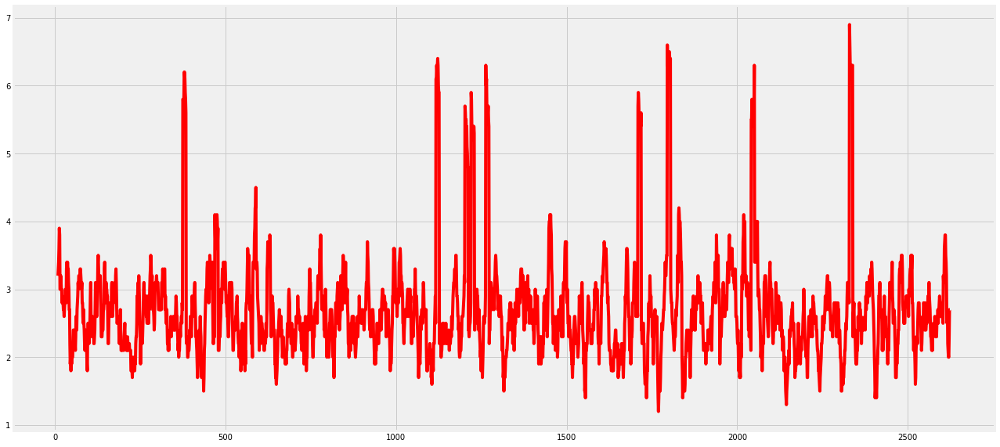

In [490]:
train_X['minus_q05_rolling_10_mean'] = -train_X['q05'].rolling(10).mean()
test_X['minus_q05_rolling_10_mean'] = -test_X['q05'].rolling(10).mean()

plot_feat(train_X, 'minus_q05_rolling_10_mean')
plot_feat_test('minus_q05_rolling_10_mean')

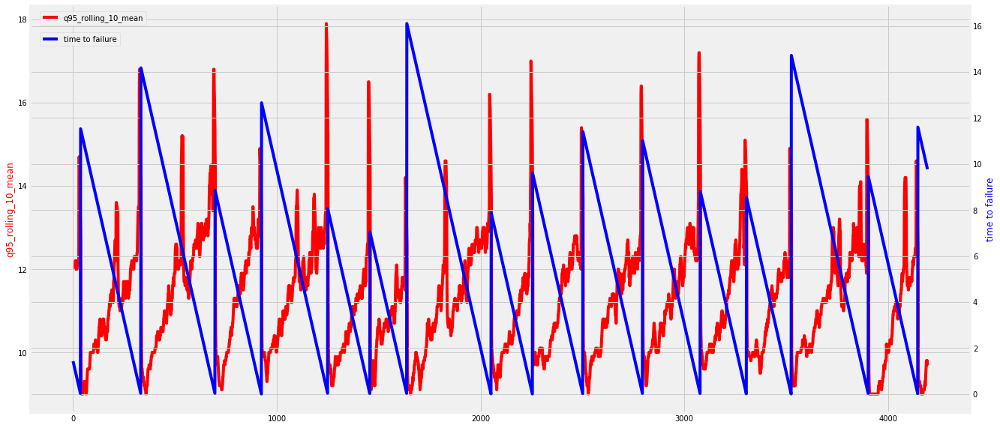

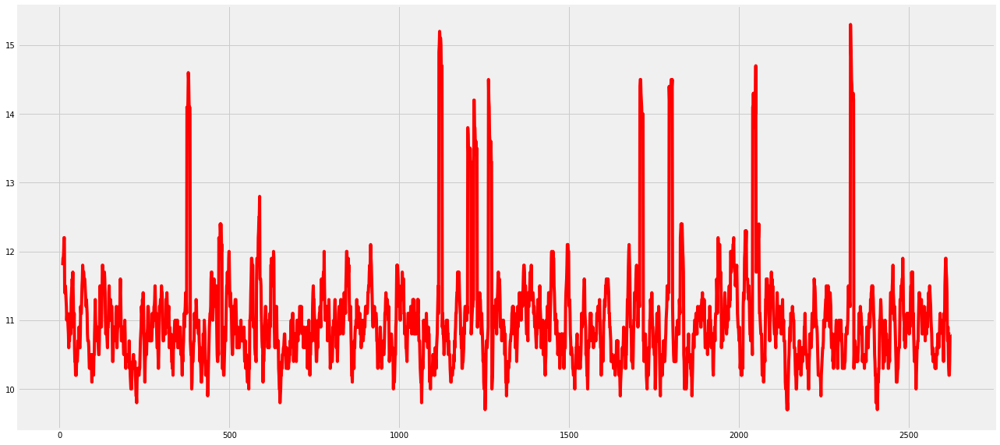

In [491]:
train_X['q95_rolling_10_mean'] = train_X['q95'].rolling(10).mean()
test_X['q95_rolling_10_mean'] = test_X['q95'].rolling(10).mean()

plot_feat(train_X, 'q95_rolling_10_mean')
plot_feat_test('q95_rolling_10_mean')

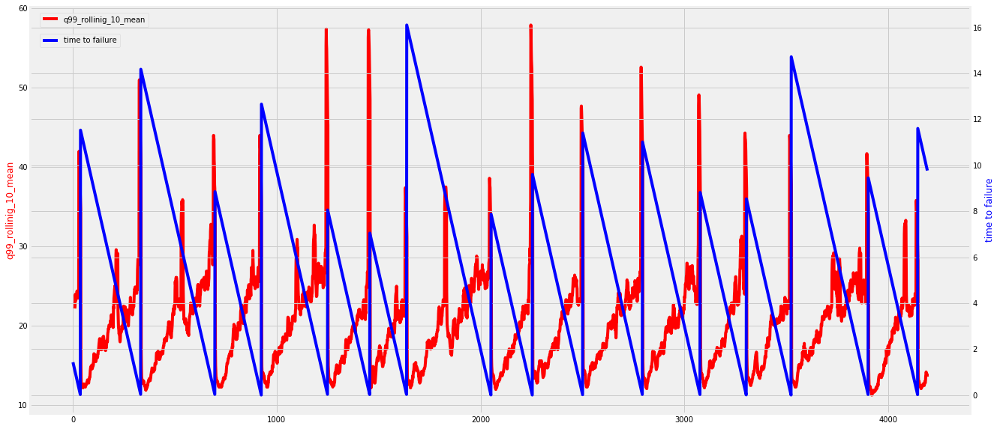

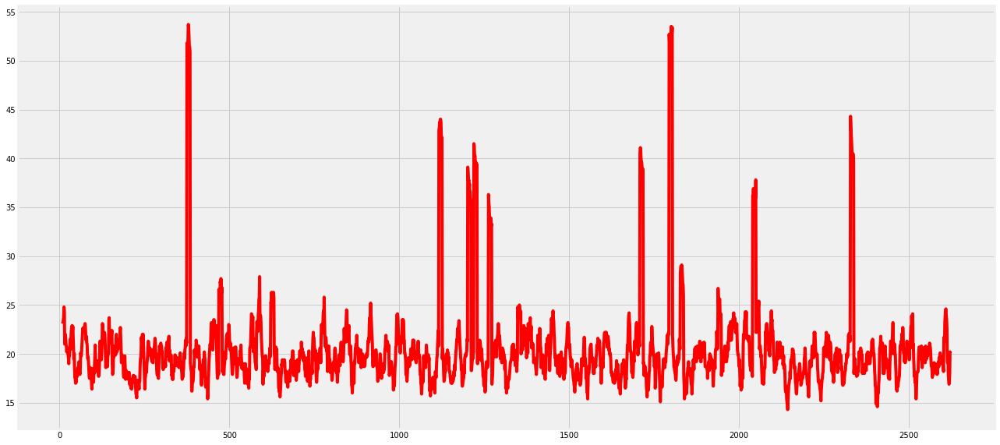

In [498]:
train_X['q99_rollinig_10_mean'] = train_X['q99'].rolling(10).mean()
test_X['q99_rollinig_10_mean'] = test_X['q99'].rolling(10).mean()

plot_feat(train_X, 'q99_rollinig_10_mean')
plot_feat_test('q99_rollinig_10_mean')

In [513]:
test_X[['q99_rollinig_10_mean']].to_csv(path + 'test_X.csv', sep=';', decimal=',')

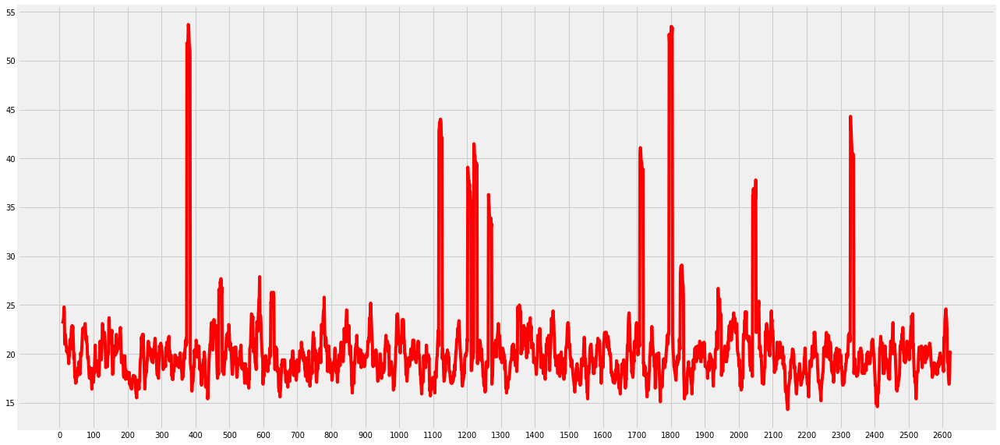

In [514]:
plt.figure(figsize=(20, 10))

plt.plot(test_X['q99_rollinig_10_mean'].values, color='r')

plt.xticks(np.arange(0, 2623, 100))

plt.show()

In [521]:
submission_craft = pd.read_csv(path + 'submission_craft.csv', sep=';', decimal=',')

[<matplotlib.lines.Line2D at 0x1e661289080>]

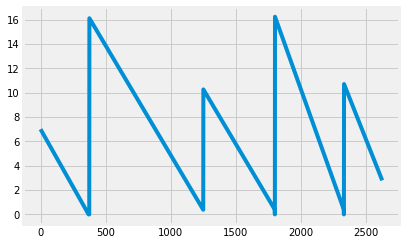

In [523]:
plt.plot(submission_craft['time_to_failure'])

In [527]:
submission['time_to_failure'] = submission_craft['time_to_failure'].values

In [529]:
submission.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2624 entries, seg_00030f to seg_ffe7cc
Data columns (total 1 columns):
time_to_failure    2624 non-null float64
dtypes: float64(1)
memory usage: 121.0+ KB


In [530]:
submission.to_csv(path + 'submission_crafted.csv')

In [401]:
X_train = pd.read_csv(path + 'X_train_clear.csv')

target = 'time_to_failure'

submission = pd.read_csv(path + 'sample_submission.csv', index_col='seg_id')

X_test = pd.read_csv(path + 'X_test_clear.csv')
y_test_fake = np.ones(X_test.shape[0])

feat = feat_best
cat_feat = []

y_train = X_train[target]
X_train = X_train[feat]

X_train = data_convert(
    df=X_train,
    col_exc='time_to_failure'
)

X_test = X_test[feat]

X_test = data_convert(
    df=X_test,
    col_exc=''
)

percentile_roll_std_10_window_500 with type float64 converted to float32
autocorrelation_60000_10 with type float64 converted to float32
percentile_roll_std_20_window_1000 with type float64 converted to float32
fftr_range_-3000_-2000 with type int64 converted to uint16
min_roll_std_50 with type float64 converted to float32
autocorrelation_60000_500 with type float64 converted to float32
percentile_roll_std_25_window_500 with type float64 converted to float32
percentile_roll_std_20_window_500 with type float64 converted to float32
percentile_roll_std_5_window_50 with type float64 converted to float32
percentile_roll_std_5_window_500 with type float64 converted to float32
num_peaks_100_20 with type float64 converted to float32
autocorrelation_60000_5 with type float64 converted to float32
ffti_percentile_roll_std_50_window_100 with type float64 converted to float32
ffti_percentile_roll_std_40_window_1000 with type float64 converted to float32
autocorrelation_0_100 with type float64 conve

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:29: DataConversionWarning:

Data with input dtype uint16, float32 were all converted to float64 by StandardScaler.



ValueError: operands could not be broadcast together with shapes (4194,15) (1194,) (4194,15) 

In [351]:
X_train = pd.concat([X_train, train_X[train_X.columns[9:]]], axis=1)

scaler = StandardScaler()
scaler.fit(X_train)

X_train = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)

X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

In [352]:
X_train.columns

Index(['percentile_roll_std_10_window_500', 'autocorrelation_60000_10',
       'percentile_roll_std_20_window_1000',
       'percentile_roll_std_20_window_500', 'fftr_range_-3000_-2000',
       'percentile_roll_std_25_window_500', 'min_roll_std_50',
       'percentile_roll_std_5_window_50', 'percentile_roll_std_25_window_1000',
       'percentile_roll_std_5_window_500', 'percentile_roll_std_25_window_100',
       'ffti_mean_change_rate_first_50000', 'autocorrelation_60000_500',
       'percentile_roll_std_20_window_100',
       'ffti_percentile_roll_std_50_window_100', 'kurt_rolling_10_mean',
       'skew_roliing_10_var', 'mad_rolling_10_mean', 'max_rolling_10_mean',
       'std_rolling_10_min', 'minus_q01_rolling_10_mean',
       'minus_q05_rolling_10_mean', 'q95_rolling_10_mean',
       'q99_rollinig_10_mean', 'feat'],
      dtype='object')

In [337]:
train_X.columns

Index(['kurt', 'skew', 'mad', 'max', 'std', 'q01', 'q05', 'q95', 'q99',
       'kurt_rolling_10_mean', 'skew_roliing_10_var', 'mad_rolling_10_mean',
       'max_rolling_10_mean', 'std_rolling_10_min',
       'minus_q01_rolling_10_mean', 'minus_q05_rolling_10_mean',
       'q95_rolling_10_mean', 'q99_rollinig_10_mean', 'feat'],
      dtype='object')

In [355]:
feat = feat_best.copy()
feat.append(train_X.columns[11])

In [356]:
feat

['percentile_roll_std_10_window_500',
 'autocorrelation_60000_10',
 'percentile_roll_std_20_window_1000',
 'percentile_roll_std_20_window_500',
 'fftr_range_-3000_-2000',
 'percentile_roll_std_25_window_500',
 'min_roll_std_50',
 'percentile_roll_std_5_window_50',
 'percentile_roll_std_25_window_1000',
 'percentile_roll_std_5_window_500',
 'percentile_roll_std_25_window_100',
 'ffti_mean_change_rate_first_50000',
 'autocorrelation_60000_500',
 'percentile_roll_std_20_window_100',
 'ffti_percentile_roll_std_50_window_100',
 'mad_rolling_10_mean']

In [357]:
df_lgbm_pred = pd.DataFrame()
df_lgbm_feat_imp = pd.DataFrame()

fi_lgbm = pd.DataFrame(np.zeros(len(feat)))
fi_lgbm.columns = ['importance']
fi_lgbm['feature'] = feat

oof_lgbm = np.zeros(X_train.shape[0])
preds_lgbm = np.zeros(X_test.shape[0])

test_lgb = lgb.Dataset(
    data=X_test,
    label=y_test_fake,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

for f, (train_ind, valid_ind) in enumerate(folds.split(X_train, y_train)):

    print(
        '\n',
        'FOLD',
        f,
        '\n'
    )

    X_train_f, X_valid_f = X_train[feat].iloc[train_ind], X_train[feat].iloc[valid_ind]
    y_train_f, y_valid_f = y_train.iloc[train_ind], y_train.iloc[valid_ind]

    train_lgb = lgb.Dataset(
        data=X_train_f,
        label=y_train_f,
        reference=None,
        weight=None,
        group=None,
        init_score=None,
        silent=None,
        feature_name=feat,
        categorical_feature=cat_feat,
        params=None,
        free_raw_data=False #you should set is True if you don't wanna drop it by yourself
    )

    valid_lgb = lgb.Dataset(
        data=X_valid_f,
        label=y_valid_f,
        reference=None,
        weight=None,
        group=None,
        init_score=None,
        silent=None,
        feature_name=feat,
        categorical_feature=cat_feat,
        params=None,
        free_raw_data=False #you should set is True if you don't wanna drop it by yourself
    )

    params_cpu = {
    #Core Parameters
        #'config': '',
        'task': 'train',
        'objective': 'huber',
        'boosting': 'gbdt',
        #'data': '',
        #'valid': '',
        #num_iterations: 100000,
        'learning_rate': .01,
        'num_leaves': 180, #2^max_depth*70%
        #'tree_learner': 'serial',
        'num_threads': n_threads,
        'device_type': 'cpu',
        'seed': random_state,
    #Learning Control Parameters
        'max_depth': 8,
        'min_data_in_leaf': 20,
        'min_sum_hessian_in_leaf': 1e-3,
        'bagging_fraction': .75,
        'bagging_freq': 10,
        'bagging_seed': random_state,
        'feature_fraction': .47,
        'feature_fraction_seed': random_state,
        #'early_stopping_rounds': 100,
        'max_delta_step': 0.0,
        'lambda_l1': 0.0,
        'lambda_l2': 0.0,
        'min_gain_to_split': 0.0,
        #'drop_rate': .1, #dart
        #'max_dop': 50, #dart
        #skip_drop': .5, #dart
        #'xgboost_dart_mode': False, #dart
        #'uniform_drop': False, #dart
        #'drop_seed': random_state, #dart
        #'top_rate': .2, #goss
        #'oter_rate': .1, #goss
        'min_data_per_group': 100,
        'max_cat_threshold': 32,
        'cat_l2': 10.0,
        'cat_smooth': 10.0,
        'max_cat_to_onehot': 4,
        #'top_k': 20, #parallel
        'monotone_constraints': None,
        'feature_contri': None,
        'forcedsplits_filename': '',
        'refit_decay_rate': .9,
    #IO Parameters
        'verbosity': 1,
        'max_bin': 256,
        'min_data_in_bin': 3,
        'bin_construct_sample_cnt': 200000,
        'histogram_pool_size': -1.0,
        'data_random_seed': random_state,
        #'output_model': LightGBM_mode.txt, #model
        'snapshot_freq': -1,
        #'input_model': '', #model
        #'output_result': LightGBM_predict_result.txt, #model
        'initscore_filename': '',
        'valid_data_initscores': '',
        'pre_partition': False,
        'enable_bundle': True,
        'max_conflict_rate': 0.0,
        'is_enable_sparse': True,
        'sparse_threshold': .8,
        'use_missing': True,
        'zero_as_missing': False,
        'two_round': False,
        'save_binary': False,
        'enable_load_from_binary_file': True,
        'header': False,
        'label_column': '',
        'weight_column': '',
        'group_column': '',
        'ignore_column': '',
        #'categorial_feature': '', #train
        #'predict_raw_score': False, #predict
        #'predict_leaf_index': False, #predict
        #'predict_contrlib': False, #predict
        #'num_iterations_predict': -1, #predict
        #'pred_early_stop': False, #predict
        #'pred_early_stop_freq': 10, #predict
        #'pred_early_stop_margin': 10.0, #predict
        #'convert_model_language': '', #convert_model
        #'convert_model': 'gbdt_prediction_cpp', #convert_model
    #Objective Parameters
        #'num_class': 1, #multi_class
        #'is_unbalance': False, #binary
        #'scale_pos_weight': balance, #binary
        #'sigmoid': 1.0, #binary
        'boost_from_average': True,
        'reg_sqrt': False,
        'alpha': .9,
        'fair_c': 1.0,
        'poisson_max_delta_step': .7,
        'tweedie_variance_power': 1.5,
        #'max_position': 20, #lambdarank
        #'label_gain': 0,1,3,7,15,31,63,...,2^30-1, #lambdarank
    #Metric Parameters
        'metric': 'mae',
        'metric_freq': 1,
        'is_provide_training_metric': False,
    #Network Parameters
        'num_machines': 1,
        'local_listen_port': 12400,
        'time_out': 120,
        'machine_list_filename': '',
        'machines': '',
    #GPU Parameters
        'gpu_platform_id': 0,
        'gpu_device_id': 0,
        'gpu_use_dp': True
    }

    evals_result = {} 

    model = lgb.train(
        params=params_cpu,
        train_set=train_lgb,
        num_boost_round=50000,
        valid_sets=[train_lgb, valid_lgb],
        valid_names=None,
        fobj=None,
        feval=None,
        init_model=None,
        feature_name=feat, #for not lgbm dataset
        categorical_feature=cat_feat, #for not lgbm dataset
        early_stopping_rounds=500,
        evals_result=evals_result,
        verbose_eval=100,
        learning_rates=None,
        keep_training_booster=False,
        callbacks=None #[lgbm_callback(False)] it's so slow cause auc metric is not easy to calculate
    )

    fi_lgbm['importance'] = fi_lgbm['importance'] + model.feature_importance() / folds.n_splits

    oof_lgbm[valid_ind] = model.predict(
        data=valid_lgb.data,
        num_iteration=model.best_iteration,
        raw_score=False,
        pred_leaf=False,
        pred_contrib=False,
        data_has_header=False,
        is_reshape=True,
        pred_parameter=None
    )

    pred = model.predict(
        data=test_lgb.data,
        num_iteration=model.best_iteration,
        raw_score=False,
        pred_leaf=False,
        pred_contrib=False,
        data_has_header=False,
        is_reshape=True,
        pred_parameter=None
    )

    preds_lgbm += pred / n_folds

print('-'*100)
print(mean_absolute_error(y_train, oof_lgbm))
print('-'*100)


 FOLD 0 

Training until validation scores don't improve for 500 rounds.
[100]	training's l1: 2.62261	valid_1's l1: 2.70691
[200]	training's l1: 2.28967	valid_1's l1: 2.43908
[300]	training's l1: 2.03851	valid_1's l1: 2.24803
[400]	training's l1: 1.85899	valid_1's l1: 2.12638
[500]	training's l1: 1.73247	valid_1's l1: 2.05386
[600]	training's l1: 1.64285	valid_1's l1: 2.01259
[700]	training's l1: 1.57076	valid_1's l1: 1.98487
[800]	training's l1: 1.51575	valid_1's l1: 1.96846
[900]	training's l1: 1.47251	valid_1's l1: 1.95517
[1000]	training's l1: 1.43349	valid_1's l1: 1.94506
[1100]	training's l1: 1.39616	valid_1's l1: 1.93817
[1200]	training's l1: 1.36492	valid_1's l1: 1.93118
[1300]	training's l1: 1.33866	valid_1's l1: 1.92456
[1400]	training's l1: 1.31217	valid_1's l1: 1.92
[1500]	training's l1: 1.28932	valid_1's l1: 1.91558
[1600]	training's l1: 1.26658	valid_1's l1: 1.91344
[1700]	training's l1: 1.24455	valid_1's l1: 1.9104
[1800]	training's l1: 1.22191	valid_1's l1: 1.90895
[19

[<matplotlib.lines.Line2D at 0x1e61c8d8908>]

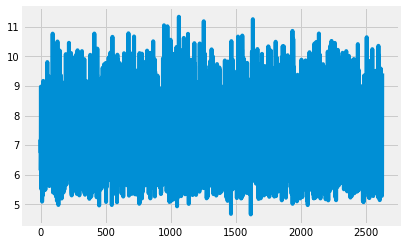

In [359]:
plt.plot(pred)

## 6.1 Searching the best feature fraction for Boruta

In [118]:
model = ExtraTreesRegressor(
    n_estimators=100,
    criterion='mae',
    max_depth=8,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features='auto',
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    min_impurity_split=None,
    bootstrap=True,
    oob_score=False,
    n_jobs=-1,
    random_state=random_state,
    verbose=0,
    warm_start=False,
)

param_grid = {
    'max_features': [float(x) for x in np.linspace(start=.02, stop=.9, num=50)],
}

train_grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    scoring='neg_mean_absolute_error',
    cv=5,
    n_jobs=n_threads,
    verbose=True
)

train_grid.fit(
    X=X_train.replace([np.NAN, np.inf, np.NINF], [0, 0, 0]),
    y=y_train
)

y_pred = train_grid.best_estimator_.predict(
    X_train.replace([np.NAN, np.inf, np.NINF], [0, 0, 0]),
)

print(
    '\n',
    'MAE score:',
    mean_absolute_error(y_train, y_pred),
)

print(train_grid.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=11)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=11)]: Done  28 tasks      | elapsed: 12.7min
[Parallel(n_jobs=11)]: Done  50 out of  50 | elapsed: 19.2min finished



 MAE score: 1.7632390850796607
{'max_features': 0.05591836734693878}


In [46]:
#looks like feature fraction does not intense on score so much as I thought

In [119]:
model = ExtraTreesRegressor(
    n_estimators=250,
    criterion='mae',
    max_depth=8,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features=0.05,
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    min_impurity_split=None,
    bootstrap=True,
    oob_score=False,
    n_jobs=-1,
    random_state=random_state,
    verbose=0,
    warm_start=False,
)

feat_sel = BorutaPy(
    estimator=model,
    n_estimators=1000,
    perc=100,
    alpha=0.05,
    two_step=True,
    max_iter=100,
    random_state=random_state,
    verbose=1
)

feat_sel.fit(
    X=X_train[feat].replace([np.NAN, np.inf, np.NINF], [0, 0, 0]).values,
    y=y_train
)

#print('\n Initial features: ', feat_common + feat_hor + feat_ver )

print('\n Number of selected features:')
print(feat_sel.n_features_)

feat_df = pd.DataFrame(feat, columns=['feat'])
feat_df['rank']=feat_sel.ranking_
feat_df = feat_df.sort_values('rank', ascending=True).reset_index(drop=True)
print ('\n Top %d features:' % feat_sel.n_features_)
print (feat_df.head(feat_sel.n_features_))

#print ('\n Feature ranking:')
#print (feat_sel.ranking_)

Iteration: 1 / 100
Iteration: 2 / 100
Iteration: 3 / 100
Iteration: 4 / 100
Iteration: 5 / 100
Iteration: 6 / 100
Iteration: 7 / 100
Iteration: 8 / 100
Iteration: 9 / 100
Iteration: 10 / 100
Iteration: 11 / 100
Iteration: 12 / 100
Iteration: 13 / 100
Iteration: 14 / 100
Iteration: 15 / 100
Iteration: 16 / 100
Iteration: 17 / 100
Iteration: 18 / 100
Iteration: 19 / 100
Iteration: 20 / 100
Iteration: 21 / 100
Iteration: 22 / 100
Iteration: 23 / 100
Iteration: 24 / 100
Iteration: 25 / 100
Iteration: 26 / 100
Iteration: 27 / 100
Iteration: 28 / 100
Iteration: 29 / 100
Iteration: 30 / 100
Iteration: 31 / 100
Iteration: 32 / 100
Iteration: 33 / 100
Iteration: 34 / 100
Iteration: 35 / 100
Iteration: 36 / 100
Iteration: 37 / 100
Iteration: 38 / 100
Iteration: 39 / 100
Iteration: 40 / 100
Iteration: 41 / 100
Iteration: 42 / 100
Iteration: 43 / 100
Iteration: 44 / 100
Iteration: 45 / 100
Iteration: 46 / 100
Iteration: 47 / 100
Iteration: 48 / 100
Iteration: 49 / 100
Iteration: 50 / 100
Iteration

In [121]:
feat_df[feat_df['rank']==1].shape

(286, 2)

In [263]:
n_folds = 5
folds = KFold(
    n_splits=n_folds,
    shuffle=True,
    random_state=random_state
)

## 6.2 XGBoost

In [11]:
#you should skip categorical_feature setting in dataset and set in train if you gonna use gpu

X_train_xgb, X_test_xgb, y_train_xgb, y_test_xgb = train_test_split(
    X_train[feat],
    y_train,
    test_size=.1,
    random_state=random_state
)

X_test_xgb = X_test_xgb[feat]

X_train_xgb, X_eval_xgb, y_train_xgb, y_eval_xgb = train_test_split(
    X_train_xgb,
    y_train_xgb,
    test_size=.25,
    random_state=random_state
)

train_xgb_full = xgb.DMatrix(
    data=X_train[feat],
    label=y_train,
    missing=None,
    weight=None,
    silent=False,
    feature_names=feat,
    #feature_types=X_train[feat].dtypes,
    nthread=n_threads
)

train_xgb = xgb.DMatrix(
    data=X_train_xgb,
    label=y_train_xgb,
    missing=None,
    weight=None,
    silent=False,
    feature_names=feat,
    #feature_types=X_train_xgb[feat].dtypes,
    nthread=n_threads
)

eval_xgb = xgb.DMatrix(
    data=X_eval_xgb,
    label=y_eval_xgb,
    missing=None,
    weight=None,
    silent=False,
    feature_names=feat,
    #feature_types=X_valid_xgb[feat].dtypes,
    nthread=n_threads
)

test_xgb = xgb.DMatrix(
    data=X_test_xgb,
    label=y_test_xgb,
    missing=None,
    weight=None,
    silent=False,
    feature_names=feat,
    #feature_types=X_test_xgb[feat].dtypes,
    nthread=n_threads
)

In [125]:
#cannot calc on GPU cause it fails with error related to parallel lib

model = xgb.XGBModel(
    max_depth=8,
    learning_rate=0.01,
    n_estimators=50000,
    verbosity=1,
    silent=None,
    objective='reg:squarederror',
    booster='gbtree',
    #nthread
    n_jobs=n_threads,
    gamma=0,
    min_child_weight=1,
    max_delta_step=0,
    subsample=.75,
    colsample_bytree=.05,
    colsample_bylevel=.05,
    colsample_bynode=.05,
    reg_alpha=0,
    reg_lambda=1,
    #scale_pos_weight=balance,
    base_score=0.5,
    #random_state
    seed=random_state,
    missing=None,
    #**kwargs
    #booster='gbtree', #default
    #silent=0, #default
    #verbosity=1, #default
    #nthread=n_threads,
    disable_default_eval_metric=0, #default
    #num_pbuffer=?, #set automatically by XGBoost, no need to be set by user
    #num_feature=?, #set automatically by XGBoost, no need to be set by user
#Parameters for Tree Booster (booster=gbtree)
    #learning_rate
    #eta=.1,
    #min_split_loss
    #gamma=0,
    #max_depth=6, #default
    #min_child_weight=1, #default #The larger min_child_weight is, the more conservative the algorithm will be.
    #max_delta_step=0, #default #Set it to value of 1-10 might help control the update.
    #subsample=.75,
    #colsample_bytree=.75,
    #colsample_bylevel=.75,
    #colsample_bynode=.75,
    ##reg_lambda l2
    #lambda=1, #default
    ##reg_alpha l1
    #alpha=0, #default
    tree_method='hist', #gpu_hist
    #sketch_eps=.03, #Only used for tree_method=approx.
    #scale_pos_weight=balance, #default
    #updater='grow_histmaker', #default
    refresh_leaf=1, #default
    process_type='default', #default
    grow_policy='depthwise', #default
    #max_leaves=0, #Only relevant when grow_policy=lossguide is set.
    max_bin=256, #default
    predictor='cpu_predictor', #gpu_predictor
    num_parallel_tree=1, #default
#Additional parameters for Dart Booster (booster=dart)
    #sample_type='uniform', #default
    #normalize_type='tree', #default
    #rate_drop=0.0, #default
    #one_dorp=0, #default
    #skip_drop=0.0, #default
#Parameters for Linear Booster (booster=gblinear)
    ##reg_lambda l2
    #lambda=1, #default
    ##reg_alpha l1
    #alpha=0, #default
    #updater='shotgun', #default
    #feature_selector='cyclic', #default
    #top_k=0, #default
#Parameters for Tweedie Regression (objective=reg:tweedie)
    #tweedie_variance_power=1.5, #default
#Learning Task Parameters
    #'objective': 'reg:squarederror',
    #'base_score': .5, #default
    #'eval_metric': 'mae',
    #'seed': random_state
)

param_grid = {
    'colsample_bytree': [float(x) for x in np.linspace(start=0.05, stop=.9, num=100)],
    'colsample_bylevel': [float(x) for x in np.linspace(start=0.05, stop=.9, num=100)],
    'colsample_bynode': [float(x) for x in np.linspace(start=0.05, stop=.9, num=100)],
}

train_grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    scoring='neg_mean_absolute_error',
    cv=5,
    n_jobs=n_threads,
    verbose=True
)

train_grid.fit(
    X=X_train_xgb,
    y=y_train_xgb,
    sample_weight=None,
    eval_set=[(X_train_xgb, y_train_xgb), (X_eval_xgb, y_eval_xgb)],
    eval_metric='mae',
    early_stopping_rounds=500,
    verbose=100,
    xgb_model=None,
    sample_weight_eval_set=None,
    callbacks=None
)

y_pred = train_grid.best_estimator_.predict(
    X_test_xgb,
    output_margin=False,
    ntree_limit=train_grid.best_estimator_.best_ntree_limit,
    validate_features=True
)

print(
    '\n',
    'MAE score:',
    mean_absolute_error(y_test_xgb, y_pred),
)

print(train_grid.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=11)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=11)]: Done  28 tasks      | elapsed: 109.6min
[Parallel(n_jobs=11)]: Done  50 out of  50 | elapsed: 162.8min finished


[0]	validation_0-mae:5.15452	validation_1-mae:5.1706
Multiple eval metrics have been passed: 'validation_1-mae' will be used for early stopping.

Will train until validation_1-mae hasn't improved in 500 rounds.
[100]	validation_0-mae:2.17328	validation_1-mae:2.57864
[200]	validation_0-mae:1.17653	validation_1-mae:2.09828
[300]	validation_0-mae:0.813813	validation_1-mae:2.04095
[400]	validation_0-mae:0.622911	validation_1-mae:2.03796
[500]	validation_0-mae:0.488689	validation_1-mae:2.04129
[600]	validation_0-mae:0.388715	validation_1-mae:2.0428
[700]	validation_0-mae:0.314547	validation_1-mae:2.04301
[800]	validation_0-mae:0.24942	validation_1-mae:2.0439
Stopping. Best iteration:
[386]	validation_0-mae:0.647303	validation_1-mae:2.03733


 MAE score: 2.097271713472548
{'colsample_bytree': 0.3419191919191919, 'colsample_bynode': 0.8398989898989899, 'colsample_bylevel': 0.5651515151515152}


In [12]:
def huberobj(preds, dtrain):
    d = preds - dtrain.get_label()
    h = 1
    scale = 1 + (d / h) ** 2
    scale_sqrt = np.sqrt(scale)
    grad = d / scale_sqrt / h
    hess = 1 / scale / scale_sqrt / h
    return grad, hess

def logcoshobj(preds, dtrain):
    labels = dtrain.get_label()
    grad = np.tanh(preds - labels)
    hess = 1.0 - grad*grad
    return grad, hess

def logexpobj(preds, dtrain):
    labels = dtrain.get_label()
    x = preds - labels
    grad = (np.exp(2.0*x) - 1) / (np.exp(2.0*x) + 1)
    hess = (4.0*np.exp(2.0*x)) / (np.exp(2.0*x) + 1)**2 
    return grad, hess

In [130]:
objs = {
    'None': None,
    'huberobj': huberobj,
    'logcoshobj': logcoshobj,
    'logexpobj': logexpobj
}

df_xgbst_pred = pd.DataFrame()
df_xgbst_feat_imp = pd.DataFrame()

for obj in ['None', 'huberobj', 'logcoshobj', 'logexpobj']:
    
    fi_xgbst = pd.DataFrame(np.zeros(len(feat)))
    fi_xgbst.columns = ['importance']
    fi_xgbst['feature'] = feat
    fi_xgbst['objective'] = obj
    
    oof_xgbst = np.zeros(X_train.shape[0])
    preds_xgbst = np.zeros(X_test.shape[0])

    test_xgb = xgb.DMatrix(
        data=X_test,
        label=y_test_fake,
        missing=None,
        weight=None,
        silent=False,
        feature_names=feat,
        #feature_types=X_test_xgb[feat].dtypes,
        nthread=n_threads
    )

    for f, (train_ind, valid_ind) in enumerate(folds.split(X_train, y_train)):
    
        print(
            '\n',
            'FOLD',
            f,
            '\n'
        )

        X_train_f, X_valid_f = X_train[feat].iloc[train_ind], X_train[feat].iloc[valid_ind]
        y_train_f, y_valid_f = y_train.iloc[train_ind], y_train.iloc[valid_ind]

        train_xgb = xgb.DMatrix(
            data=X_train_f,
            label=y_train_f,
            missing=None,
            weight=None,
            silent=False,
            feature_names=feat,
            #feature_types=X_train_xgb[feat].dtypes,
            nthread=n_threads
        )

        eval_xgb = xgb.DMatrix(
            data=X_valid_f,
            label=y_valid_f,
            missing=None,
            weight=None,
            silent=False,
            feature_names=feat,
            #feature_types=X_valid_xgb[feat].dtypes,
            nthread=n_threads
        )

        params = {
        #General Parameters
            'booster': 'gbtree', #default
            'silent': 0, #default
            'verbosity': 1, #default
            'nthread': n_threads,
            'disable_default_eval_metric': 0, #default
            #'num_pbuffer': ?, #set automatically by XGBoost, no need to be set by user
            #'num_feature': ?, #set automatically by XGBoost, no need to be set by user
        #Parameters for Tree Booster (booster=gbtree)
            #learning_rate
            'eta': .01,
            #min_split_loss
            'gamma': 0,
            'max_depth': 6, #default
            'min_child_weight': 1, #default #The larger min_child_weight is, the more conservative the algorithm will be.
            'max_delta_step': 0, #default #Set it to value of 1-10 might help control the update.
            'subsample': .75,
            'colsample_bytree': .34,
            'colsample_bylevel': .56,
            'colsample_bynode': .84,
            #reg_lambda l2
            'lambda': 1, #default
            #reg_alpha l1
            'alpha': 0, #default
            'tree_method': 'gpu_hist', #gpu_hist
            #'sketch_eps': .03, #Only used for tree_method=approx.
            #'scale_pos_weight': balance, #default
            #'updater': 'grow_histmaker', #default
            'refresh_leaf': 1, #default
            'process_type': 'default', #default
            'grow_policy': 'depthwise', #default
            #'max_leaves': 0, #Only relevant when grow_policy=lossguide is set.
            'max_bin': 256, #default
            'predictor': 'gpu_predictor', #gpu_predictor
            'num_parallel_tree': 1, #default
        #Additional parameters for Dart Booster (booster=dart)
            #'sample_type': 'uniform', #default
            #'normalize_type': 'tree', #default
            #'rate_drop': 0.0, #default
            #'one_dorp': 0, #default
            #'skip_drop': 0.0, #default
        #Parameters for Linear Booster (booster=gblinear)
            ##reg_lambda l2
            #'lambda': 1, #default
            ##reg_alpha l1
            #'alpha': 0, #default
            #'updater': 'shotgun', #default
            #'feature_selector': 'cyclic', #default
            #'top_k': 0, #default
        #Parameters for Tweedie Regression (objective=reg:tweedie)
            #'tweedie_variance_power': 1.5, #default
        #Learning Task Parameters
            'objective': 'reg:squarederror',
            'base_score': .5, #default
            'eval_metric': 'mae',
            'seed': random_state
        }

        evals_result = {}

        model = xgb.train(
            params=params,
            dtrain=train_xgb,
            num_boost_round=50000,
            evals=[(train_xgb, 'train'), (eval_xgb, 'eval')],
            obj=objs[obj],
            feval=None,
            maximize=False,
            early_stopping_rounds=500,
            evals_result=evals_result,
            verbose_eval=100,
            xgb_model=None,
            callbacks=None,
            learning_rates=None
        )

        fi_xgbst['importance'] = fi_xgbst['importance'] + pd.DataFrame(model.get_score(importance_type='weight').values()) / folds.n_splits

        oof_xgbst[valid_ind] = model.predict(
            data=eval_xgb,
            output_margin=False,
            ntree_limit=model.best_ntree_limit,
            pred_leaf=False,
            pred_contribs=False,
            approx_contribs=False,
            pred_interactions=False,
            validate_features=True
        )

        pred = model.predict(
            data=test_xgb,
            output_margin=False,
            ntree_limit=model.best_ntree_limit,
            pred_leaf=False,
            pred_contribs=False,
            approx_contribs=False,
            pred_interactions=False,
            validate_features=True
        )

        preds_xgbst += pred / n_folds

    print('-'*100)
    print(mean_absolute_error(y_train, oof_xgbst), obj)
    print('-'*100)
    
    preds_xgbst = pd.DataFrame(data=preds_xgbst, columns=['pred'])
    preds_xgbst['objective'] = obj
    df_xgbst_pred = pd.concat([preds_xgbst, df_xgbst_pred])
    df_xgbst_feat_imp = pd.concat([fi_xgbst, df_xgbst_feat_imp])


 FOLD 0 

[0]	train-mae:5.13394	eval-mae:5.2569
Multiple eval metrics have been passed: 'eval-mae' will be used for early stopping.

Will train until eval-mae hasn't improved in 500 rounds.
[100]	train-mae:2.29651	eval-mae:2.61984
[200]	train-mae:1.57159	eval-mae:2.12962
[300]	train-mae:1.35656	eval-mae:2.10097
[400]	train-mae:1.20975	eval-mae:2.10481
[500]	train-mae:1.08837	eval-mae:2.10839
[600]	train-mae:0.97918	eval-mae:2.1088
[700]	train-mae:0.880455	eval-mae:2.10832
[800]	train-mae:0.794777	eval-mae:2.10709
Stopping. Best iteration:
[300]	train-mae:1.35656	eval-mae:2.10097


 FOLD 1 

[0]	train-mae:5.18626	eval-mae:5.04958
Multiple eval metrics have been passed: 'eval-mae' will be used for early stopping.

Will train until eval-mae hasn't improved in 500 rounds.
[100]	train-mae:2.31923	eval-mae:2.48598
[200]	train-mae:1.57938	eval-mae:2.04777
[300]	train-mae:1.36403	eval-mae:2.02595
[400]	train-mae:1.22079	eval-mae:2.03284
[500]	train-mae:1.10358	eval-mae:2.04037
[600]	train-mae

Will train until eval-mae hasn't improved in 500 rounds.
[100]	train-mae:1.64055	eval-mae:2.05647
[200]	train-mae:1.34703	eval-mae:1.9894
[300]	train-mae:1.19224	eval-mae:1.98461
[400]	train-mae:1.06715	eval-mae:1.98719
[500]	train-mae:0.963692	eval-mae:1.99247
[600]	train-mae:0.87239	eval-mae:1.99832
[700]	train-mae:0.790374	eval-mae:1.99991
Stopping. Best iteration:
[294]	train-mae:1.19908	eval-mae:1.98377


 FOLD 4 

[0]	train-mae:4.55386	eval-mae:4.6894
Multiple eval metrics have been passed: 'eval-mae' will be used for early stopping.

Will train until eval-mae hasn't improved in 500 rounds.
[100]	train-mae:1.63644	eval-mae:2.18363
[200]	train-mae:1.35111	eval-mae:2.09846
[300]	train-mae:1.20188	eval-mae:2.09256
[400]	train-mae:1.07551	eval-mae:2.09238
[500]	train-mae:0.971067	eval-mae:2.09391
[600]	train-mae:0.878405	eval-mae:2.09276
[700]	train-mae:0.798719	eval-mae:2.09482
[800]	train-mae:0.727323	eval-mae:2.09723
Stopping. Best iteration:
[366]	train-mae:1.11656	eval-mae:2.091

In [131]:
df_xgbst_pred.to_csv(path + 'df_xgbst_pred.csv', index=None)
df_xgbst_feat_imp.to_csv(path + 'df_xgbst_feat_imp.csv', index=None)

In [132]:
set(df_xgbst_pred['objective'])

{'None', 'huberobj', 'logcoshobj', 'logexpobj'}

In [133]:
set(df_xgbst_feat_imp['objective'])

{'None', 'huberobj', 'logcoshobj', 'logexpobj'}

In [179]:
#with less features

In [ ]:
#cannot calc on GPU cause it fails with error related to parallel lib

model = xgb.XGBModel(
    max_depth=8,
    learning_rate=0.01,
    n_estimators=50000,
    verbosity=1,
    silent=None,
    objective='reg:squarederror',
    booster='gbtree',
    #nthread
    n_jobs=n_threads,
    gamma=0,
    min_child_weight=1,
    max_delta_step=0,
    subsample=.75,
    colsample_bytree=.05,
    colsample_bylevel=.05,
    colsample_bynode=.05,
    reg_alpha=0,
    reg_lambda=1,
    #scale_pos_weight=balance,
    base_score=0.5,
    #random_state
    seed=random_state,
    missing=None,
    #**kwargs
    #booster='gbtree', #default
    #silent=0, #default
    #verbosity=1, #default
    #nthread=n_threads,
    disable_default_eval_metric=0, #default
    #num_pbuffer=?, #set automatically by XGBoost, no need to be set by user
    #num_feature=?, #set automatically by XGBoost, no need to be set by user
#Parameters for Tree Booster (booster=gbtree)
    #learning_rate
    #eta=.1,
    #min_split_loss
    #gamma=0,
    #max_depth=6, #default
    #min_child_weight=1, #default #The larger min_child_weight is, the more conservative the algorithm will be.
    #max_delta_step=0, #default #Set it to value of 1-10 might help control the update.
    #subsample=.75,
    #colsample_bytree=.75,
    #colsample_bylevel=.75,
    #colsample_bynode=.75,
    ##reg_lambda l2
    #lambda=1, #default
    ##reg_alpha l1
    #alpha=0, #default
    tree_method='hist', #gpu_hist
    #sketch_eps=.03, #Only used for tree_method=approx.
    #scale_pos_weight=balance, #default
    #updater='grow_histmaker', #default
    refresh_leaf=1, #default
    process_type='default', #default
    grow_policy='depthwise', #default
    #max_leaves=0, #Only relevant when grow_policy=lossguide is set.
    max_bin=256, #default
    predictor='cpu_predictor', #gpu_predictor
    num_parallel_tree=1, #default
#Additional parameters for Dart Booster (booster=dart)
    #sample_type='uniform', #default
    #normalize_type='tree', #default
    #rate_drop=0.0, #default
    #one_dorp=0, #default
    #skip_drop=0.0, #default
#Parameters for Linear Booster (booster=gblinear)
    ##reg_lambda l2
    #lambda=1, #default
    ##reg_alpha l1
    #alpha=0, #default
    #updater='shotgun', #default
    #feature_selector='cyclic', #default
    #top_k=0, #default
#Parameters for Tweedie Regression (objective=reg:tweedie)
    #tweedie_variance_power=1.5, #default
#Learning Task Parameters
    obj=huberobj
    #objective='reg:squarederror',
    #base_score'=.5, #default
    #eval_metric='mae',
    #seed=random_state
)

param_grid = {
    'colsample_bytree': [float(x) for x in np.linspace(start=0.05, stop=.9, num=100)],
    'colsample_bylevel': [float(x) for x in np.linspace(start=0.05, stop=.9, num=100)],
    'colsample_bynode': [float(x) for x in np.linspace(start=0.05, stop=.9, num=100)],
}

train_grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    scoring='neg_mean_absolute_error',
    cv=5,
    n_jobs=n_threads,
    verbose=True
)

train_grid.fit(
    X=X_train_xgb,
    y=y_train_xgb,
    sample_weight=None,
    eval_set=[(X_train_xgb, y_train_xgb), (X_eval_xgb, y_eval_xgb)],
    eval_metric='mae',
    early_stopping_rounds=500,
    verbose=100,
    xgb_model=None,
    sample_weight_eval_set=None,
    callbacks=None
)

y_pred = train_grid.best_estimator_.predict(
    X_test_xgb,
    output_margin=False,
    ntree_limit=train_grid.best_estimator_.best_ntree_limit,
    validate_features=True
)

print(
    '\n',
    'MAE score:',
    mean_absolute_error(y_test_xgb, y_pred),
)

print(train_grid.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=11)]: Using backend LokyBackend with 11 concurrent workers.


In [14]:
train_results = []
valid_results = []

depths = range(1, 17, 1)

for d in tqdm_notebook(depths):
    
    model = xgb.XGBModel(
        max_depth=d,
        learning_rate=0.01,
        n_estimators=50000,
        verbosity=1,
        silent=None,
        objective='reg:squarederror',
        booster='gbtree',
        #nthread
        n_jobs=n_threads,
        gamma=0,
        min_child_weight=1,
        max_delta_step=0,
        subsample=.75,
        colsample_bytree=.38,
        colsample_bylevel=.14,
        colsample_bynode=.75,
        reg_alpha=0,
        reg_lambda=1,
        #scale_pos_weight=balance,
        base_score=0.5,
        #random_state
        seed=random_state,
        missing=None,
        #**kwargs
        #booster='gbtree', #default
        #silent=0, #default
        #verbosity=1, #default
        #nthread=n_threads,
        disable_default_eval_metric=0, #default
        #num_pbuffer=?, #set automatically by XGBoost, no need to be set by user
        #num_feature=?, #set automatically by XGBoost, no need to be set by user
    #Parameters for Tree Booster (booster=gbtree)
        #learning_rate
        #eta=.1,
        #min_split_loss
        #gamma=0,
        #max_depth=6, #default
        #min_child_weight=1, #default #The larger min_child_weight is, the more conservative the algorithm will be.
        #max_delta_step=0, #default #Set it to value of 1-10 might help control the update.
        #subsample=.75,
        #colsample_bytree=.75,
        #colsample_bylevel=.75,
        #colsample_bynode=.75,
        ##reg_lambda l2
        #lambda=1, #default
        ##reg_alpha l1
        #alpha=0, #default
        tree_method='hist', #gpu_hist
        #sketch_eps=.03, #Only used for tree_method=approx.
        #scale_pos_weight=balance, #default
        #updater='grow_histmaker', #default
        refresh_leaf=1, #default
        process_type='default', #default
        grow_policy='depthwise', #default
        #max_leaves=0, #Only relevant when grow_policy=lossguide is set.
        max_bin=256, #default
        predictor='cpu_predictor', #gpu_predictor
        num_parallel_tree=1, #default
    #Additional parameters for Dart Booster (booster=dart)
        #sample_type='uniform', #default
        #normalize_type='tree', #default
        #rate_drop=0.0, #default
        #one_dorp=0, #default
        #skip_drop=0.0, #default
    #Parameters for Linear Booster (booster=gblinear)
        ##reg_lambda l2
        #lambda=1, #default
        ##reg_alpha l1
        #alpha=0, #default
        #updater='shotgun', #default
        #feature_selector='cyclic', #default
        #top_k=0, #default
    #Parameters for Tweedie Regression (objective=reg:tweedie)
        #tweedie_variance_power=1.5, #default
    #Learning Task Parameters
        obj=huberobj
        #objective='reg:squarederror',
        #base_score'=.5, #default
        #eval_metric='mae',
        #seed=random_state
    )

    model.fit(
        X=X_train_xgb,
        y=y_train_xgb,
        sample_weight=None,
        eval_set=[(X_train_xgb, y_train_xgb), (X_eval_xgb, y_eval_xgb)],
        eval_metric='mae',
        early_stopping_rounds=500,
        verbose=100,
        xgb_model=None,
        sample_weight_eval_set=None,
        callbacks=None
    )
    
    y_pred_train = model.predict(
        data=X_train_xgb,
        output_margin=False,
        ntree_limit=None,
        validate_features=True
    )

    y_pred_test = model.predict(
        data=X_test_xgb,
        output_margin=False,
        ntree_limit=None,
        validate_features=True
    )

    train_results.append(mean_absolute_error(y_train_xgb, y_pred_train))
    valid_results.append(mean_absolute_error(y_test_xgb, y_pred_test))

plot_vc(
    x=[d for d in depths],
    y_train=train_results,
    y_valid=valid_results,
    xlabel='DEPTH'
)

[0]	validation_0-mae:5.15678	validation_1-mae:5.17095
Multiple eval metrics have been passed: 'validation_1-mae' will be used for early stopping.

Will train until validation_1-mae hasn't improved in 500 rounds.
[100]	validation_0-mae:2.76005	validation_1-mae:2.80043
[200]	validation_0-mae:2.23733	validation_1-mae:2.30822
[300]	validation_0-mae:2.13892	validation_1-mae:2.21336
[400]	validation_0-mae:2.09293	validation_1-mae:2.1625
[500]	validation_0-mae:2.06832	validation_1-mae:2.13442
[600]	validation_0-mae:2.05281	validation_1-mae:2.11609
[700]	validation_0-mae:2.04223	validation_1-mae:2.10363
[800]	validation_0-mae:2.0343	validation_1-mae:2.09551
[900]	validation_0-mae:2.02955	validation_1-mae:2.09254
[1000]	validation_0-mae:2.02505	validation_1-mae:2.08968
[1100]	validation_0-mae:2.02016	validation_1-mae:2.08686
[1200]	validation_0-mae:2.01716	validation_1-mae:2.08578
[1300]	validation_0-mae:2.01317	validation_1-mae:2.08333
[1400]	validation_0-mae:2.01008	validation_1-mae:2.0817
[1

[600]	validation_0-mae:1.05566	validation_1-mae:2.05548
[700]	validation_0-mae:0.963553	validation_1-mae:2.05668
[800]	validation_0-mae:0.878471	validation_1-mae:2.05902
[900]	validation_0-mae:0.792203	validation_1-mae:2.05976
[1000]	validation_0-mae:0.720733	validation_1-mae:2.06104
Stopping. Best iteration:
[541]	validation_0-mae:1.11873	validation_1-mae:2.05279

[0]	validation_0-mae:5.15568	validation_1-mae:5.16984
Multiple eval metrics have been passed: 'validation_1-mae' will be used for early stopping.

Will train until validation_1-mae hasn't improved in 500 rounds.
[100]	validation_0-mae:2.3506	validation_1-mae:2.60216
[200]	validation_0-mae:1.5523	validation_1-mae:2.12046
[300]	validation_0-mae:1.28641	validation_1-mae:2.07135
[400]	validation_0-mae:1.11502	validation_1-mae:2.06884
[500]	validation_0-mae:0.979116	validation_1-mae:2.07198
[600]	validation_0-mae:0.867158	validation_1-mae:2.07442
[700]	validation_0-mae:0.771089	validation_1-mae:2.07447
[800]	validation_0-mae:0.67

## 6.3 LightGBM

In [55]:
#you should skip categorical_feature setting in dataset and set in train if you gonna use gpu

X_train_lgb, X_test_lgb, y_train_lgb, y_test_lgb = train_test_split(
    X_train[feat],
    y_train,
    test_size=.1,
    random_state=random_state
)

X_test_lgb = X_test_lgb[feat]

X_train_lgb, X_valid_lgb, y_train_lgb, y_valid_lgb = train_test_split(
    X_train_lgb,
    y_train_lgb,
    test_size=.25,
    random_state=random_state
)

train_lgb_full = lgb.Dataset(
    data=X_train[feat],
    label=y_train,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

train_lgb = lgb.Dataset(
    data=X_train_lgb,
    label=y_train_lgb,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

valid_lgb = lgb.Dataset(
    data=X_valid_lgb,
    label=y_valid_lgb,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

test_lgb = lgb.Dataset(
    data=X_test_lgb,
    label=y_test_lgb,
    reference=None,
    weight=None,
    group=None,
    init_score=None,
    silent=None,
    feature_name=feat,
    categorical_feature=cat_feat,
    params=None,
    free_raw_data=False #you should set is True if you don't wanna drop it by yourself
)

In [127]:
#%%time

'''
For Faster Speed:
- Use bagging by setting bagging_fraction and bagging_freq
- Use feature sub-sampling by setting feature_fraction
- Use small max_bin
- Use save_binary to speed up data loading in future learning
- Use parallel learning, refer to Parallel Learning Guide

For Better Accuracy:
- Use large max_bin (may be slower)
- Use small learning_rate with large num_iterations
- Use large num_leaves (may cause over-fitting)
- Use bigger training data
- Try dart

Deal with Over-fitting
- Use small max_bin
- Use small num_leaves
- Use min_data_in_leaf and min_sum_hessian_in_leaf
- Use bagging by set bagging_fraction and bagging_freq
- Use feature sub-sampling by set feature_fraction
- Use bigger training data
- Try lambda_l1, lambda_l2 and min_gain_to_split for regularization
- Try max_depth to avoid growing deep tree
'''

model = lgb.LGBMModel(
    boosting_type='gbdt',
    num_leaves=180,
    max_depth=8,
    learning_rate=.01,
    n_estimators=50000,
    sumsample_for_bin=2000000,
    objective='mae',
    class_weight=None,
    min_split_gain=.0,
    min_child_weight=.001,
    min_child_samples=20,
    subsample=.75,
    subsample_freq=10,
    colsample_bytree=.05,
    reg_alpha=0.0,
    reg_lambda=0.0,
    random_state=random_state,
    n_jobs=n_threads,
    silent=True,
    ##**kwargs:
#Core Parameters
    #config=,
    task='train',
    #objective='regression',
    #boosting='gbdt',
    #data='',
    #valid='',
    #num_iterations=100000,
    #learning_rate=.01,
    #num_leaves=180, #2^max_depth*70%
    #tree_learner=serial,
    num_threads=n_threads,
    device_type='cpu',
    #seed=random_state,
#Learning Control Parameters
    #max_depth=8,
    min_data_in_leaf=20,
    min_sum_hessian_in_leaf=1e-3,
    #bagging_fraction=.75,
    #bagging_freq=2,
    bagging_seed=random_state,
    #feature_fraction=.75,
    feature_fraction_seed=random_state,
    #early_stopping_rounds=100,
    max_delta_step=0.0,
    #lambda_l1=0.0,
    #lambda_l2=0.0,
    min_gain_to_split=0.0,
    #drop_rate=.1, #dart
    #max_dop=50, #dart
    #skip_drop=.5, #dart
    #xgboost_dart_mode=False, #dart
    #uniform_drop=False, #dart
    #drop_seed=random_state, #dart
    #top_rate=.2, #goss
    #oter_rate=.1, #goss
    min_data_per_group=100,
    max_cat_threshold=32,
    cat_l2=10.0,
    cat_smooth=10.0,
    max_cat_to_onehot=4,
    #top_k=20, #parallel
    monotone_constraints=None,
    feature_contri=None,
    forcedsplits_filename='',
    refit_decay_rate=.9,
#IO Parameters
    verbosity=1,
    max_bin=256,
    min_data_in_bin=3,
    bin_construct_sample_cnt=200000,
    histogram_pool_size=-1.0,
    data_random_seed=random_state,
    #output_model=LightGBM_mode.txt, #model
    snapshot_freq=-1,
    #input_model=, #model
    #output_result=LightGBM_predict_result.txt, #model
    initscore_filename='',
    valid_data_initscores='',
    pre_partition=False,
    enable_bundle=True,
    max_conflict_rate=0.0,
    is_enable_sparse=True,
    sparse_threshold=.8,
    use_missing=True,
    zero_as_missing=False,
    two_round=False,
    save_binary=False,
    enable_load_from_binary_file=True,
    header=False,
    #label_column='',
    #weight_column='',
    #group_column='',
    #ignore_column='',
    #categorial_feature='', #train
    #predict_raw_score=False, #predict
    #predict_leaf_index=False, #predict
    #predict_contrlib=False, #predict
    #num_iterations_predict=-1, #predict
    #pred_early_stop=False, #predict
    #pred_early_stop_freq=10, #predict
    #pred_early_stop_margin=10.0, #predict
    #convert_model_language=, #convert_model
    #convert_model=gbdt_prediction_cpp, #convert_model
#Objective Parameters
    #num_class=1, #multi_class
    #is_unbalance=False, #binary
    #scale_pos_weight=balance, #binary
    sigmoid=1.0, #binary
    boost_from_average=True,
    reg_sqrt=False,
    alpha=.9,
    fair_c=1.0,
    poisson_max_delta_step=.7,
    tweedie_variance_power=1.5,
    #max_position=20, #lambdarank
    #label_gain=0,1,3,7,15,31,63,...,2^30-1, #lambdarank
#Metric Parameters
    metric='mae',
    metric_freq=1,
    is_provide_training_metric=False,
#Network Parameters
    num_machines=1,
    local_listen_port=12400,
    time_out=120,
    machine_list_filename='',
    machines='',
#GPU Parameters
    gpu_platform_id=0,
    gpu_device_id=0,
    gpu_use_dp=True
)

param_grid = {
    'feature_fraction': [float(x) for x in np.linspace(start=0.05, stop=.9, num=100)],
}

train_grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    scoring='neg_mean_absolute_error',
    cv=5,
    n_jobs=n_threads,
    verbose=True
)

train_grid.fit(
    X=train_lgb.data,
    y=train_lgb.get_label(),
    sample_weight=None,
    init_score=None,
    #group=None, #LGBMModel
    eval_set=[(train_lgb.data, train_lgb.get_label()), (valid_lgb.data, valid_lgb.get_label())],
    eval_names=None,
    eval_sample_weight=None,
    eval_class_weight=None,
    eval_init_score=None,
    #eval_group=None, #LGBMModel
    eval_metric='mae',
    early_stopping_rounds=500,
    verbose=100,
    #feature_name=feat, #for not lgbm dataset
    #categorical_feature=cat_feat, #for not lgbm dataset
    callbacks=None
)

y_pred = train_grid.best_estimator_.predict(
    X=test_lgb.data,
    raw_score=False,
    num_iteration=train_grid.best_estimator_.best_iteration_,
    pred_leaf=False,
    pred_contrib=False
)

print(
    '\n',
    'MAE score:',
    mean_absolute_error(test_lgb.get_label(), y_pred),
)

print(train_grid.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=11)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=11)]: Done  28 tasks      | elapsed: 16.3min
[Parallel(n_jobs=11)]: Done  50 out of  50 | elapsed: 24.4min finished


Training until validation scores don't improve for 500 rounds.
[100]	training's l1: 1.88731	valid_1's l1: 2.24223
[200]	training's l1: 1.50923	valid_1's l1: 2.09948
[300]	training's l1: 1.32509	valid_1's l1: 2.06697
[400]	training's l1: 1.19896	valid_1's l1: 2.05152
[500]	training's l1: 1.10574	valid_1's l1: 2.04474
[600]	training's l1: 1.04058	valid_1's l1: 2.04067
[700]	training's l1: 0.979118	valid_1's l1: 2.03964
[800]	training's l1: 0.932113	valid_1's l1: 2.03926
[900]	training's l1: 0.886931	valid_1's l1: 2.03557
[1000]	training's l1: 0.849141	valid_1's l1: 2.03346
[1100]	training's l1: 0.816472	valid_1's l1: 2.03218
[1200]	training's l1: 0.786474	valid_1's l1: 2.02884
[1300]	training's l1: 0.751546	valid_1's l1: 2.02679
[1400]	training's l1: 0.720265	valid_1's l1: 2.02609
[1500]	training's l1: 0.693516	valid_1's l1: 2.02606
[1600]	training's l1: 0.671041	valid_1's l1: 2.02636
[1700]	training's l1: 0.652264	valid_1's l1: 2.02661
[1800]	training's l1: 0.63524	valid_1's l1: 2.02609

In [134]:
df_lgbm_pred = pd.DataFrame()
df_lgbm_feat_imp = pd.DataFrame()

for lf in ['rmse', 'mae', 'huber', 'fair', 'poisson', 'quantile', 'mape', 'gamma']:

    fi_lgbm = pd.DataFrame(np.zeros(len(feat)))
    fi_lgbm.columns = ['importance']
    fi_lgbm['feature'] = feat
    fi_lgbm['objective'] = lf
    
    oof_lgbm = np.zeros(X_train.shape[0])
    preds_lgbm = np.zeros(X_test.shape[0])

    test_lgb = lgb.Dataset(
        data=X_test,
        label=y_test_fake,
        reference=None,
        weight=None,
        group=None,
        init_score=None,
        silent=None,
        feature_name=feat,
        categorical_feature=cat_feat,
        params=None,
        free_raw_data=False #you should set is True if you don't wanna drop it by yourself
    )

    for f, (train_ind, valid_ind) in enumerate(folds.split(X_train, y_train)):
    
        print(
            '\n',
            'FOLD',
            f,
            '\n'
        )

        X_train_f, X_valid_f = X_train[feat].iloc[train_ind], X_train[feat].iloc[valid_ind]
        y_train_f, y_valid_f = y_train.iloc[train_ind], y_train.iloc[valid_ind]

        train_lgb = lgb.Dataset(
            data=X_train_f,
            label=y_train_f,
            reference=None,
            weight=None,
            group=None,
            init_score=None,
            silent=None,
            feature_name=feat,
            categorical_feature=cat_feat,
            params=None,
            free_raw_data=False #you should set is True if you don't wanna drop it by yourself
        )

        valid_lgb = lgb.Dataset(
            data=X_valid_f,
            label=y_valid_f,
            reference=None,
            weight=None,
            group=None,
            init_score=None,
            silent=None,
            feature_name=feat,
            categorical_feature=cat_feat,
            params=None,
            free_raw_data=False #you should set is True if you don't wanna drop it by yourself
        )

        params_cpu = {
        #Core Parameters
            #'config': '',
            'task': 'train',
            'objective': lf,
            'boosting': 'gbdt',
            #'data': '',
            #'valid': '',
            #num_iterations: 100000,
            'learning_rate': .01,
            'num_leaves': 180, #2^max_depth*70%
            #'tree_learner': 'serial',
            'num_threads': n_threads,
            'device_type': 'cpu',
            'seed': random_state,
        #Learning Control Parameters
            'max_depth': 8,
            'min_data_in_leaf': 20,
            'min_sum_hessian_in_leaf': 1e-3,
            'bagging_fraction': .75,
            'bagging_freq': 10,
            'bagging_seed': random_state,
            'feature_fraction': .47,
            'feature_fraction_seed': random_state,
            #'early_stopping_rounds': 100,
            'max_delta_step': 0.0,
            'lambda_l1': 0.0,
            'lambda_l2': 0.0,
            'min_gain_to_split': 0.0,
            #'drop_rate': .1, #dart
            #'max_dop': 50, #dart
            #skip_drop': .5, #dart
            #'xgboost_dart_mode': False, #dart
            #'uniform_drop': False, #dart
            #'drop_seed': random_state, #dart
            #'top_rate': .2, #goss
            #'oter_rate': .1, #goss
            'min_data_per_group': 100,
            'max_cat_threshold': 32,
            'cat_l2': 10.0,
            'cat_smooth': 10.0,
            'max_cat_to_onehot': 4,
            #'top_k': 20, #parallel
            'monotone_constraints': None,
            'feature_contri': None,
            'forcedsplits_filename': '',
            'refit_decay_rate': .9,
        #IO Parameters
            'verbosity': 1,
            'max_bin': 256,
            'min_data_in_bin': 3,
            'bin_construct_sample_cnt': 200000,
            'histogram_pool_size': -1.0,
            'data_random_seed': random_state,
            #'output_model': LightGBM_mode.txt, #model
            'snapshot_freq': -1,
            #'input_model': '', #model
            #'output_result': LightGBM_predict_result.txt, #model
            'initscore_filename': '',
            'valid_data_initscores': '',
            'pre_partition': False,
            'enable_bundle': True,
            'max_conflict_rate': 0.0,
            'is_enable_sparse': True,
            'sparse_threshold': .8,
            'use_missing': True,
            'zero_as_missing': False,
            'two_round': False,
            'save_binary': False,
            'enable_load_from_binary_file': True,
            'header': False,
            'label_column': '',
            'weight_column': '',
            'group_column': '',
            'ignore_column': '',
            #'categorial_feature': '', #train
            #'predict_raw_score': False, #predict
            #'predict_leaf_index': False, #predict
            #'predict_contrlib': False, #predict
            #'num_iterations_predict': -1, #predict
            #'pred_early_stop': False, #predict
            #'pred_early_stop_freq': 10, #predict
            #'pred_early_stop_margin': 10.0, #predict
            #'convert_model_language': '', #convert_model
            #'convert_model': 'gbdt_prediction_cpp', #convert_model
        #Objective Parameters
            #'num_class': 1, #multi_class
            #'is_unbalance': False, #binary
            #'scale_pos_weight': balance, #binary
            #'sigmoid': 1.0, #binary
            'boost_from_average': True,
            'reg_sqrt': False,
            'alpha': .9,
            'fair_c': 1.0,
            'poisson_max_delta_step': .7,
            'tweedie_variance_power': 1.5,
            #'max_position': 20, #lambdarank
            #'label_gain': 0,1,3,7,15,31,63,...,2^30-1, #lambdarank
        #Metric Parameters
            'metric': 'mae',
            'metric_freq': 1,
            'is_provide_training_metric': False,
        #Network Parameters
            'num_machines': 1,
            'local_listen_port': 12400,
            'time_out': 120,
            'machine_list_filename': '',
            'machines': '',
        #GPU Parameters
            'gpu_platform_id': 0,
            'gpu_device_id': 0,
            'gpu_use_dp': True
        }

        evals_result = {} 

        model = lgb.train(
            params=params_cpu,
            train_set=train_lgb,
            num_boost_round=50000,
            valid_sets=[train_lgb, valid_lgb],
            valid_names=None,
            fobj=None,
            feval=None,
            init_model=None,
            feature_name=feat, #for not lgbm dataset
            categorical_feature=cat_feat, #for not lgbm dataset
            early_stopping_rounds=500,
            evals_result=evals_result,
            verbose_eval=100,
            learning_rates=None,
            keep_training_booster=False,
            callbacks=None #[lgbm_callback(False)] it's so slow cause auc metric is not easy to calculate
        )

        fi_lgbm['importance'] = fi_lgbm['importance'] + model.feature_importance() / folds.n_splits

        oof_lgbm[valid_ind] = model.predict(
            data=valid_lgb.data,
            num_iteration=model.best_iteration,
            raw_score=False,
            pred_leaf=False,
            pred_contrib=False,
            data_has_header=False,
            is_reshape=True,
            pred_parameter=None
        )

        pred = model.predict(
            data=test_lgb.data,
            num_iteration=model.best_iteration,
            raw_score=False,
            pred_leaf=False,
            pred_contrib=False,
            data_has_header=False,
            is_reshape=True,
            pred_parameter=None
        )

        preds_lgbm += pred / n_folds
        
    print('-'*100)
    print(mean_absolute_error(y_train, oof_lgbm), lf)
    print('-'*100)
    
    preds_lgbm = pd.DataFrame(data=preds_lgbm, columns=['pred'])
    preds_lgbm['objective'] = lf
    df_lgbm_pred = pd.concat([preds_lgbm, df_lgbm_pred])
    df_lgbm_feat_imp = pd.concat([fi_lgbm, df_lgbm_feat_imp])


 FOLD 0 

Training until validation scores don't improve for 500 rounds.
[100]	training's l1: 1.82601	valid_1's l1: 2.27253
[200]	training's l1: 1.36989	valid_1's l1: 2.13702
[300]	training's l1: 1.12254	valid_1's l1: 2.11342
[400]	training's l1: 0.957821	valid_1's l1: 2.10728
[500]	training's l1: 0.832586	valid_1's l1: 2.10495
[600]	training's l1: 0.728936	valid_1's l1: 2.10894
[700]	training's l1: 0.645612	valid_1's l1: 2.11055
[800]	training's l1: 0.563641	valid_1's l1: 2.11324
[900]	training's l1: 0.494872	valid_1's l1: 2.11589
Early stopping, best iteration is:
[439]	training's l1: 0.907294	valid_1's l1: 2.1034

 FOLD 1 

Training until validation scores don't improve for 500 rounds.
[100]	training's l1: 1.8428	valid_1's l1: 2.20759
[200]	training's l1: 1.38322	valid_1's l1: 2.07293
[300]	training's l1: 1.13351	valid_1's l1: 2.0493
[400]	training's l1: 0.982662	valid_1's l1: 2.04165
[500]	training's l1: 0.868186	valid_1's l1: 2.03848
[600]	training's l1: 0.77537	valid_1's l1: 2.0

[200]	training's l1: 1.17741	valid_1's l1: 2.04463
[300]	training's l1: 0.997461	valid_1's l1: 2.02967
[400]	training's l1: 0.884009	valid_1's l1: 2.02193
[500]	training's l1: 0.785727	valid_1's l1: 2.02139
[600]	training's l1: 0.709791	valid_1's l1: 2.01887
[700]	training's l1: 0.636497	valid_1's l1: 2.01802
[800]	training's l1: 0.572516	valid_1's l1: 2.02091
[900]	training's l1: 0.516663	valid_1's l1: 2.02163
[1000]	training's l1: 0.471536	valid_1's l1: 2.02221
[1100]	training's l1: 0.431179	valid_1's l1: 2.02214
Early stopping, best iteration is:
[630]	training's l1: 0.689646	valid_1's l1: 2.01663
----------------------------------------------------------------------------------------------------
2.0336286147568945 fair
----------------------------------------------------------------------------------------------------

 FOLD 0 

Training until validation scores don't improve for 500 rounds.
[100]	training's l1: 2.27751	valid_1's l1: 2.51118
[200]	training's l1: 1.83191	valid_1's l1

[9300]	training's l1: 1.93844	valid_1's l1: 2.84504
[9400]	training's l1: 1.93816	valid_1's l1: 2.84495
[9500]	training's l1: 1.93762	valid_1's l1: 2.84461
[9600]	training's l1: 1.93755	valid_1's l1: 2.84464
[9700]	training's l1: 1.93488	valid_1's l1: 2.84233
[9800]	training's l1: 1.93082	valid_1's l1: 2.83872
[9900]	training's l1: 1.92717	valid_1's l1: 2.83627
[10000]	training's l1: 1.92435	valid_1's l1: 2.83445
[10100]	training's l1: 1.92383	valid_1's l1: 2.83446
[10200]	training's l1: 1.92292	valid_1's l1: 2.83393
[10300]	training's l1: 1.92098	valid_1's l1: 2.83299
[10400]	training's l1: 1.91605	valid_1's l1: 2.83118
[10500]	training's l1: 1.91047	valid_1's l1: 2.82847
[10600]	training's l1: 1.90336	valid_1's l1: 2.82519
[10700]	training's l1: 1.89792	valid_1's l1: 2.82293
[10800]	training's l1: 1.89324	valid_1's l1: 2.82142
[10900]	training's l1: 1.88952	valid_1's l1: 2.82026
[11000]	training's l1: 1.88567	valid_1's l1: 2.81871
[11100]	training's l1: 1.8822	valid_1's l1: 2.8172
[1

[5400]	training's l1: 1.38214	valid_1's l1: 2.16586
[5500]	training's l1: 1.37978	valid_1's l1: 2.16489
[5600]	training's l1: 1.37849	valid_1's l1: 2.16469
[5700]	training's l1: 1.37718	valid_1's l1: 2.16459
[5800]	training's l1: 1.37516	valid_1's l1: 2.16488
[5900]	training's l1: 1.37328	valid_1's l1: 2.16512
[6000]	training's l1: 1.37023	valid_1's l1: 2.16408
[6100]	training's l1: 1.36709	valid_1's l1: 2.16247
[6200]	training's l1: 1.36627	valid_1's l1: 2.16214
[6300]	training's l1: 1.36576	valid_1's l1: 2.16177
[6400]	training's l1: 1.36356	valid_1's l1: 2.16143
[6500]	training's l1: 1.3621	valid_1's l1: 2.16116
[6600]	training's l1: 1.36266	valid_1's l1: 2.16093
[6700]	training's l1: 1.36139	valid_1's l1: 2.16091
[6800]	training's l1: 1.35973	valid_1's l1: 2.16053
[6900]	training's l1: 1.35834	valid_1's l1: 2.1602
[7000]	training's l1: 1.35652	valid_1's l1: 2.15985
[7100]	training's l1: 1.35353	valid_1's l1: 2.1599
[7200]	training's l1: 1.35194	valid_1's l1: 2.15979
[7300]	training

[12200]	training's l1: 1.28609	valid_1's l1: 2.05075
[12300]	training's l1: 1.28566	valid_1's l1: 2.05061
[12400]	training's l1: 1.28509	valid_1's l1: 2.05042
[12500]	training's l1: 1.28423	valid_1's l1: 2.05021
[12600]	training's l1: 1.28419	valid_1's l1: 2.05027
[12700]	training's l1: 1.28352	valid_1's l1: 2.05009
[12800]	training's l1: 1.28349	valid_1's l1: 2.04981
[12900]	training's l1: 1.28304	valid_1's l1: 2.04973
[13000]	training's l1: 1.28213	valid_1's l1: 2.04993
[13100]	training's l1: 1.28251	valid_1's l1: 2.04993
[13200]	training's l1: 1.28137	valid_1's l1: 2.04986
[13300]	training's l1: 1.28081	valid_1's l1: 2.04969
[13400]	training's l1: 1.27868	valid_1's l1: 2.04942
[13500]	training's l1: 1.27794	valid_1's l1: 2.04987
[13600]	training's l1: 1.27763	valid_1's l1: 2.04989
[13700]	training's l1: 1.27713	valid_1's l1: 2.04969
[13800]	training's l1: 1.277	valid_1's l1: 2.04978
Early stopping, best iteration is:
[13380]	training's l1: 1.27908	valid_1's l1: 2.0494

 FOLD 4 

Tra

In [135]:
df_lgbm_pred.to_csv(path + 'df_lgbm_pred.csv', index=None)
df_lgbm_feat_imp.to_csv(path + 'df_lgbm_feat_imp.csv', index=None)

In [136]:
set(df_lgbm_pred['objective'])

{'fair', 'gamma', 'huber', 'mae', 'mape', 'poisson', 'quantile', 'rmse'}

In [137]:
set(df_lgbm_feat_imp['objective'])

{'fair', 'gamma', 'huber', 'mae', 'mape', 'poisson', 'quantile', 'rmse'}

In [186]:
# with less features

In [189]:
#%%time

'''
For Faster Speed:
- Use bagging by setting bagging_fraction and bagging_freq
- Use feature sub-sampling by setting feature_fraction
- Use small max_bin
- Use save_binary to speed up data loading in future learning
- Use parallel learning, refer to Parallel Learning Guide

For Better Accuracy:
- Use large max_bin (may be slower)
- Use small learning_rate with large num_iterations
- Use large num_leaves (may cause over-fitting)
- Use bigger training data
- Try dart

Deal with Over-fitting
- Use small max_bin
- Use small num_leaves
- Use min_data_in_leaf and min_sum_hessian_in_leaf
- Use bagging by set bagging_fraction and bagging_freq
- Use feature sub-sampling by set feature_fraction
- Use bigger training data
- Try lambda_l1, lambda_l2 and min_gain_to_split for regularization
- Try max_depth to avoid growing deep tree
'''

model = lgb.LGBMModel(
    boosting_type='gbdt',
    num_leaves=180,
    max_depth=8,
    learning_rate=.01,
    n_estimators=50000,
    sumsample_for_bin=2000000,
    objective='huber',
    class_weight=None,
    min_split_gain=.0,
    min_child_weight=.001,
    min_child_samples=20,
    subsample=.75,
    subsample_freq=10,
    colsample_bytree=.05,
    reg_alpha=0.0,
    reg_lambda=0.0,
    random_state=random_state,
    n_jobs=n_threads,
    silent=True,
    ##**kwargs:
#Core Parameters
    #config=,
    task='train',
    #objective='regression',
    #boosting='gbdt',
    #data='',
    #valid='',
    #num_iterations=100000,
    #learning_rate=.01,
    #num_leaves=180, #2^max_depth*70%
    #tree_learner=serial,
    num_threads=n_threads,
    device_type='cpu',
    #seed=random_state,
#Learning Control Parameters
    #max_depth=8,
    min_data_in_leaf=20,
    min_sum_hessian_in_leaf=1e-3,
    #bagging_fraction=.75,
    #bagging_freq=2,
    bagging_seed=random_state,
    #feature_fraction=.75,
    feature_fraction_seed=random_state,
    #early_stopping_rounds=100,
    max_delta_step=0.0,
    #lambda_l1=0.0,
    #lambda_l2=0.0,
    min_gain_to_split=0.0,
    #drop_rate=.1, #dart
    #max_dop=50, #dart
    #skip_drop=.5, #dart
    #xgboost_dart_mode=False, #dart
    #uniform_drop=False, #dart
    #drop_seed=random_state, #dart
    #top_rate=.2, #goss
    #oter_rate=.1, #goss
    min_data_per_group=100,
    max_cat_threshold=32,
    cat_l2=10.0,
    cat_smooth=10.0,
    max_cat_to_onehot=4,
    #top_k=20, #parallel
    monotone_constraints=None,
    feature_contri=None,
    forcedsplits_filename='',
    refit_decay_rate=.9,
#IO Parameters
    verbosity=1,
    max_bin=256,
    min_data_in_bin=3,
    bin_construct_sample_cnt=200000,
    histogram_pool_size=-1.0,
    data_random_seed=random_state,
    #output_model=LightGBM_mode.txt, #model
    snapshot_freq=-1,
    #input_model=, #model
    #output_result=LightGBM_predict_result.txt, #model
    initscore_filename='',
    valid_data_initscores='',
    pre_partition=False,
    enable_bundle=True,
    max_conflict_rate=0.0,
    is_enable_sparse=True,
    sparse_threshold=.8,
    use_missing=True,
    zero_as_missing=False,
    two_round=False,
    save_binary=False,
    enable_load_from_binary_file=True,
    header=False,
    #label_column='',
    #weight_column='',
    #group_column='',
    #ignore_column='',
    #categorial_feature='', #train
    #predict_raw_score=False, #predict
    #predict_leaf_index=False, #predict
    #predict_contrlib=False, #predict
    #num_iterations_predict=-1, #predict
    #pred_early_stop=False, #predict
    #pred_early_stop_freq=10, #predict
    #pred_early_stop_margin=10.0, #predict
    #convert_model_language=, #convert_model
    #convert_model=gbdt_prediction_cpp, #convert_model
#Objective Parameters
    #num_class=1, #multi_class
    #is_unbalance=False, #binary
    #scale_pos_weight=balance, #binary
    sigmoid=1.0, #binary
    boost_from_average=True,
    reg_sqrt=False,
    alpha=.9,
    fair_c=1.0,
    poisson_max_delta_step=.7,
    tweedie_variance_power=1.5,
    #max_position=20, #lambdarank
    #label_gain=0,1,3,7,15,31,63,...,2^30-1, #lambdarank
#Metric Parameters
    metric='mae',
    metric_freq=1,
    is_provide_training_metric=False,
#Network Parameters
    num_machines=1,
    local_listen_port=12400,
    time_out=120,
    machine_list_filename='',
    machines='',
#GPU Parameters
    gpu_platform_id=0,
    gpu_device_id=0,
    gpu_use_dp=True
)

param_grid = {
    'feature_fraction': [float(x) for x in np.linspace(start=0.05, stop=.9, num=100)],
}

train_grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    scoring='neg_mean_absolute_error',
    cv=5,
    n_jobs=n_threads,
    verbose=True
)

train_grid.fit(
    X=train_lgb.data,
    y=train_lgb.get_label(),
    sample_weight=None,
    init_score=None,
    #group=None, #LGBMModel
    eval_set=[(train_lgb.data, train_lgb.get_label()), (valid_lgb.data, valid_lgb.get_label())],
    eval_names=None,
    eval_sample_weight=None,
    eval_class_weight=None,
    eval_init_score=None,
    #eval_group=None, #LGBMModel
    eval_metric='mae',
    early_stopping_rounds=500,
    verbose=100,
    #feature_name=feat, #for not lgbm dataset
    #categorical_feature=cat_feat, #for not lgbm dataset
    callbacks=None
)

y_pred = train_grid.best_estimator_.predict(
    X=test_lgb.data,
    raw_score=False,
    num_iteration=train_grid.best_estimator_.best_iteration_,
    pred_leaf=False,
    pred_contrib=False
)

print(
    '\n',
    'MAE score:',
    mean_absolute_error(test_lgb.get_label(), y_pred),
)

print(train_grid.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=11)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=11)]: Done  28 tasks      | elapsed:  1.2min
[Parallel(n_jobs=11)]: Done  50 out of  50 | elapsed:  1.8min finished


Training until validation scores don't improve for 500 rounds.
[100]	training's l1: 2.72365	valid_1's l1: 2.77645
[200]	training's l1: 2.44944	valid_1's l1: 2.55251
[300]	training's l1: 2.24448	valid_1's l1: 2.39119
[400]	training's l1: 2.08234	valid_1's l1: 2.26959
[500]	training's l1: 1.96566	valid_1's l1: 2.19164
[600]	training's l1: 1.87534	valid_1's l1: 2.13999
[700]	training's l1: 1.80954	valid_1's l1: 2.10793
[800]	training's l1: 1.75838	valid_1's l1: 2.09013
[900]	training's l1: 1.71436	valid_1's l1: 2.07738
[1000]	training's l1: 1.677	valid_1's l1: 2.06969
[1100]	training's l1: 1.64208	valid_1's l1: 2.06357
[1200]	training's l1: 1.61182	valid_1's l1: 2.05835
[1300]	training's l1: 1.58204	valid_1's l1: 2.05467
[1400]	training's l1: 1.55522	valid_1's l1: 2.05258
[1500]	training's l1: 1.53038	valid_1's l1: 2.05061
[1600]	training's l1: 1.50527	valid_1's l1: 2.0484
[1700]	training's l1: 1.48163	valid_1's l1: 2.04631
[1800]	training's l1: 1.46007	valid_1's l1: 2.04552
[1900]	traini

## 6.4 Catboost

In [12]:
X_train_ctbst, X_test_ctbst, y_train_ctbst, y_test_ctbst = train_test_split(
    X_train[feat],
    y_train,
    test_size=.1,
    random_state=random_state
)

X_test_ctbst = X_test_ctbst[feat]

X_train_ctbst, X_eval_ctbst, y_train_ctbst, y_eval_ctbst = train_test_split(
    X_train_ctbst,
    y_train_ctbst,
    test_size=.25,
    random_state=random_state
)

train_ctbst_full = ctbst.Pool(
    data=X_train[feat],
    label=y_train,
    cat_features=cat_feat,
    column_description=None,
    pairs=None,
    delimiter='\t',
    has_header=True,
    weight=None,
    group_id=None,
    group_weight=None,
    subgroup_id=None,
    pairs_weight=None,
    baseline=None,
    feature_names=feat,
    thread_count=n_threads
)

train_ctbst = ctbst.Pool(
    data=X_train_ctbst,
    label=y_train_ctbst,
    cat_features=cat_feat,
    column_description=None,
    pairs=None,
    delimiter='\t',
    has_header=True,
    weight=None,
    group_id=None,
    group_weight=None,
    subgroup_id=None,
    pairs_weight=None,
    baseline=None,
    feature_names=feat,
    thread_count=n_threads
)

eval_ctbst = ctbst.Pool(
    data=X_eval_ctbst,
    label=y_eval_ctbst,
    cat_features=cat_feat,
    column_description=None,
    pairs=None,
    delimiter='\t',
    has_header=True,
    weight=None,
    group_id=None,
    group_weight=None,
    subgroup_id=None,
    pairs_weight=None,
    baseline=None,
    feature_names=feat,
    thread_count=n_threads
)

test_ctbst = ctbst.Pool(
    data=X_test_ctbst,
    label=y_test_ctbst,
    cat_features=cat_feat,
    column_description=None,
    pairs=None,
    delimiter='\t',
    has_header=True,
    weight=None,
    group_id=None,
    group_weight=None,
    subgroup_id=None,
    pairs_weight=None,
    baseline=None,
    feature_names=feat,
    thread_count=n_threads
)

In [129]:
model = ctbst.CatBoostRegressor(
    iterations=5000,
    learning_rate=.1,
    depth=8,
    l2_leaf_reg=3,
    model_size_reg=.5,
    rsm=.05,
    loss_function='MAE',
    border_count=254,
    feature_border_type='GreedyLogSum',
    #input_borders=None,
    #output_borders=None,
    #fold_permutation_block=1
    #od_pval=.01, #IncToDec
    od_wait=20,
    od_type='Iter',
    nan_mode='Min',
    counter_calc_method='Full',
    leaf_estimation_iterations=1,
    leaf_estimation_method='Gradient',
    thread_count=n_threads,
    random_seed=random_state,
    use_best_model=True,
    best_model_min_trees=None,
    #verbose=1,
    #silent=None,
    logging_level='Silent',
    metric_period=1,
    ctr_leaf_count_limit=None,
    store_all_simple_ctr=False,
    max_ctr_complexity=4,
    has_time=False,
    allow_const_label=False,
    one_hot_max_size=2,
    random_strength=1,
    name='experiment',
    ignored_features=[],
    train_dir='catboost_info',
    custom_metric=None,
    eval_metric='MAE',
    bagging_temperature=1,
    save_snapshot=False,
    snapshot_file='experiment.cbsnapshot',
    #snapshot_interval=600,
    fold_len_multiplier=2,
    used_ram_limit=None,
    gpu_ram_part=.95, #GPU
    pinned_memory_size=1073741824, #GPU
    allow_writing_files=True,
    final_ctr_computation_mode='Default',
    approx_on_full_history=False,
    boosting_type='Ordered', #GPU
    #simple_ctr='Borders',
    #combinations_ctr='Borders',
    #per_feature_ctr='Borders',
    ctr_description=None,
    ctr_target_border_count=None,
    task_type='CPU',
    device_config=None,
    devices='0',
    bootstrap_type='Bayesian',
    #subsample=.66, #Poison or Bernulli
    sampling_unit=None,
    #dev_score_calc_obj_block_size=None,
    #dev_efb_max_buckets=None,
    efb_max_conflict_fraction=None,
    #max_depth=None,
    #n_estimators=None,
    #num_boost_round=None,
    #num_trees=None,
    #colsample_bylevel=None,
    #random_state=None,
    #reg_lambda=None,
    #objective=None,
    #eta=None,
    #max_bin=None,
    #gpu_cat_features_storage=None, #GPU
    #data_partition=None, #GPU
    metadata=None,
    #early_stopping_rounds=50, #train
    #cat_features=None,
    grow_policy='SymmetricTree', #GPU
    #min_data_in_leaf=1, #GPU
    #max_leaves=31, #GPU
    #score_function=None, #GPU
    leaf_estimation_backtracking='AnyImprovement',
    ctr_history_unit=None
)

param_grid = {
    'rsm': [float(x) for x in np.linspace(start=0.05, stop=.9, num=10)],
}

train_grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    scoring='neg_mean_absolute_error',
    cv=3,
    n_jobs=n_threads,
    verbose=True
)

train_grid.fit(
    X=train_ctbst.get_features(),
    y=train_ctbst.get_label(),
    cat_features=cat_feat, #for not Pool
    sample_weight=None, #for not Pool
    baseline=None,
    use_best_model=True,
    eval_set=[(train_ctbst.get_features(), train_ctbst.get_label()), (eval_ctbst.get_features(), eval_ctbst.get_label())],
    #verbose=True,
    logging_level=None,
    plot=False,
    column_description=None,
    verbose_eval=100,
    metric_period=None,
    silent=None,
    early_stopping_rounds=50,
    save_snapshot=None,
    snapshot_file=None,
    snapshot_interval=None
)

y_pred = train_grid.best_estimator_.predict(
    data=test_ctbst,
    ntree_start=0,
    ntree_end=train_grid.best_estimator_.best_iteration_,
    thread_count=n_threads,
    verbose=None
)

print(
    '\n',
    'MAE score:',
    mean_absolute_error(test_ctbst.get_label(), y_pred),
)

print(train_grid.best_params_)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


[Parallel(n_jobs=11)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=11)]: Done  30 out of  30 | elapsed: 255.2min finished


0:	learn: 5.6311449	test: 5.6311449	test1: 5.6416250	best: 5.6416250 (0)	total: 2.09s	remaining: 2h 54m
100:	learn: 2.8574883	test: 2.8574883	test1: 2.9085370	best: 2.9085370 (100)	total: 3m 35s	remaining: 2h 53m 54s
200:	learn: 1.9230071	test: 1.9230071	test1: 2.1018064	best: 2.1018064 (200)	total: 7m 8s	remaining: 2h 50m 38s
300:	learn: 1.7630598	test: 1.7630598	test1: 2.0454833	best: 2.0454833 (300)	total: 10m 45s	remaining: 2h 48m
400:	learn: 1.6520480	test: 1.6520480	test1: 2.0370610	best: 2.0369253 (399)	total: 14m 22s	remaining: 2h 44m 53s
500:	learn: 1.5496397	test: 1.5496397	test1: 2.0297665	best: 2.0297470 (499)	total: 17m 59s	remaining: 2h 41m 32s
600:	learn: 1.4505588	test: 1.4505588	test1: 2.0255781	best: 2.0255781 (600)	total: 21m 36s	remaining: 2h 38m 9s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 2.022872192
bestIteration = 634

Shrink model to first 635 iterations.

 MAE score: 2.057480645093594
{'rsm': 0.8055555555555556}


In [138]:
df_ctbst_pred = pd.DataFrame()
df_ctbst_feat_imp = pd.DataFrame()

for em in [
    'MAE',
    'RMSE',
    'MAPE',
    'Poisson',
    'Quantile:alpha=.1',
    'Quantile:alpha=.2',
    'Quantile:alpha=.3',
    'Quantile:alpha=.4',
    'Quantile:alpha=.5',
    'Quantile:alpha=.6',
    'Quantile:alpha=.7',
    'Quantile:alpha=.8',
    'Quantile:alpha=.9',
    'LogLinQuantile:alpha=.1',
    'LogLinQuantile:alpha=.2',
    'LogLinQuantile:alpha=.3',
    'LogLinQuantile:alpha=.4',
    'LogLinQuantile:alpha=.5',
    'LogLinQuantile:alpha=.6',
    'LogLinQuantile:alpha=.7',
    'LogLinQuantile:alpha=.8',
    'LogLinQuantile:alpha=.9'
]:

    fi_ctbst = pd.DataFrame(np.zeros(len(feat)))
    fi_ctbst.columns = ['importance']
    fi_ctbst['feature'] = feat
    fi_ctbst['objective'] = em
    
    oof_ctbst = np.zeros(X_train.shape[0])
    preds_ctbst = np.zeros(X_test.shape[0])

    test_ctbst = ctbst.Pool(
        data=X_test,
        label=y_test_fake,
        cat_features=cat_feat,
        column_description=None,
        pairs=None,
        delimiter='\t',
        has_header=True,
        weight=None,
        group_id=None,
        group_weight=None,
        subgroup_id=None,
        pairs_weight=None,
        baseline=None,
        feature_names=feat,
        thread_count=n_threads
    )

    for f, (train_ind, valid_ind) in enumerate(folds.split(X_train, y_train)):
    
        print(
            '\n',
            'FOLD',
            f,
            '\n'
        )

        X_train_f, X_valid_f = X_train[feat].iloc[train_ind], X_train[feat].iloc[valid_ind]
        y_train_f, y_valid_f = y_train.iloc[train_ind], y_train.iloc[valid_ind]

        train_ctbst = ctbst.Pool(
            data=X_train_f,
            label=y_train_f,
            cat_features=cat_feat,
            column_description=None,
            pairs=None,
            delimiter='\t',
            has_header=True,
            weight=None,
            group_id=None,
            group_weight=None,
            subgroup_id=None,
            pairs_weight=None,
            baseline=None,
            feature_names=feat,
            thread_count=n_threads
        )

        eval_ctbst = ctbst.Pool(
            data=X_valid_f,
            label=y_valid_f,
            cat_features=cat_feat,
            column_description=None,
            pairs=None,
            delimiter='\t',
            has_header=True,
            weight=None,
            group_id=None,
            group_weight=None,
            subgroup_id=None,
            pairs_weight=None,
            baseline=None,
            feature_names=feat,
            thread_count=n_threads
        )

        params_cpu = {
        #Common parameters
            'loss_function': em,
            #'custom_metric': None,
            'eval_metric': 'MAE',
            'iterations': 5000,
            'learning_rate': .1,
            'random_seed': random_state,
            'l2_leaf_reg': 3,
            'bootstrap_type': 'Bayesian',
            'bagging_temperature': 1,
            #'subsample': .66, #Poison or Bernulli
            'sampling_frequency': 'PerTreeLevel', #CPU
            'random_strength': 1,
            'use_best_model': True,
            #'best_model_min_trees': None, #set in train
            'depth': 8,
            'ignored_features': [],
            'one_hot_max_size': 2,
            'has_time': False,
            'rsm': .8, #CPU
            'nan_mode': 'Min',
            #'fold_permutation_block_size': 1,
            'leaf_estimation_iterations': 1,
            'leaf_estimation_method': 'Gradient',
            'fold_len_multiplier': 2,
            'approx_on_full_history': False,
            #'class_weights': 1, #LogLoss
            #'scale_pos_weight': balance, #LogLoss
            #'boosting_type': 'Ordered', #GPU
            'allow_const_label': False,
        #Overfitting detection settings
            'od_type': 'Iter',
            #'od_pval': .01, #IncToDec
            'od_wait': 20,
            #'early_stopping_rounds': True,
        #Binarization settings
            'border_count': 254,
            'feature_border_type': 'GreedyLogSum',
        #Multiclassification settings
            #'classes_count': None, #Multiclassification
        #Performance settings
            'thread_count': n_threads,
            'used_ram_limit': None,
            'gpu_ram_part': .95, #GPU
            'pinned_memory_size': 1073741824, #GPU
            'gpu_cat_features_storage': 'GpuRam', #GPU
            'data_partition': 'FeatureParallel', #GPU
        #Processing unit settings
            'task_type': 'CPU',
            'devices': '0',
        #Visualization settings
            'name': 'experiment',
        #Output settings
            'logging_level': 'Silent',
            'metric_period': 1,
            #'verbose': 1,
            'train_dir': 'catboost_info',
            'model_size_reg': .5,
            'allow_writing_files': True,
            'save_snapshot': False,
            'snapshot_file': 'experiment.cbsnapshot',
            #'snapshot_interval': 600,
            #'roc_file': None,
        #CTR settings
            #'simple_ctr': 'Borders',
            #'combinations_ctr': 'Borders',
            #'per_feature_ctr': 'Borsers',
            'counter_calc_method': 'Full',
            'max_ctr_complexity': 4,
            #'ctr_leaf_count_limit': None,
            'store_all_simple_ctr': False,
            'final_ctr_computation_mode': 'Default'
        }

        model = ctbst.train(
            #dtrain
            pool=train_ctbst,
            params=params_cpu,
            logging_level=None,
            #verbose_eval
            verbose=100,
            #num_boost_round=None, #get from params
            #iterations=None=None, #get from params
            #evals
            eval_set=[train_ctbst, eval_ctbst], #CPU
            plot=False,
            metric_period=None,
            early_stopping_rounds=50,
            save_snapshot=None,
            snapshot_file=None,
            snapshot_interval=None
        )

        fi_ctbst['importance'] = fi_ctbst['importance'] + pd.DataFrame(model.get_feature_importance())/ folds.n_splits

        oof_ctbst[valid_ind] = model.predict(
            data=eval_ctbst,
            prediction_type='RawFormulaVal',
            ntree_start=0,
            ntree_end=model.best_iteration_,
            thread_count=n_threads,
            verbose=None
        )

        pred = model.predict(
            data=test_ctbst,
            prediction_type='RawFormulaVal',
            ntree_start=0,
            ntree_end=model.best_iteration_,
            thread_count=n_threads,
            verbose=None
        )

        preds_ctbst += pred / n_folds

    print('-'*100)
    print(mean_absolute_error(y_train, oof_ctbst), em)
    print('-'*100)

    preds_ctbst = pd.DataFrame(data=preds_ctbst, columns=['pred'])
    preds_ctbst['objective'] = em
    df_ctbst_pred = pd.concat([preds_ctbst, df_ctbst_pred])
    df_ctbst_feat_imp = pd.concat([fi_ctbst, df_ctbst_feat_imp])


 FOLD 0 

0:	learn: 5.6104125	test: 5.6104125	test1: 5.7311809	best: 5.7311809 (0)	total: 2.02s	remaining: 2h 48m 46s
100:	learn: 2.8346915	test: 2.8346915	test1: 3.0071964	best: 3.0071964 (100)	total: 3m 34s	remaining: 2h 53m 38s
200:	learn: 1.9203390	test: 1.9203390	test1: 2.1706231	best: 2.1706231 (200)	total: 7m 10s	remaining: 2h 51m 21s
300:	learn: 1.7244392	test: 1.7244392	test1: 2.1042622	best: 2.1042622 (300)	total: 10m 49s	remaining: 2h 48m 59s
400:	learn: 1.5524226	test: 1.5524226	test1: 2.0926098	best: 2.0926098 (400)	total: 14m 33s	remaining: 2h 46m 59s
500:	learn: 1.3791019	test: 1.3791019	test1: 2.0885675	best: 2.0874226 (492)	total: 18m 17s	remaining: 2h 44m 17s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 2.085107669
bestIteration = 525

Shrink model to first 526 iterations.

 FOLD 1 

0:	learn: 5.6621779	test: 5.6621779	test1: 5.5252669	best: 5.5252669 (0)	total: 2.02s	remaining: 2h 48m 11s
100:	learn: 2.8833165	test: 2.8833165	test1: 2.8324429	be

300:	learn: 4.4936167	test: 4.4936167	test1: 4.5395761	best: 4.5395761 (300)	total: 10m 52s	remaining: 2h 49m 49s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 4.508380893
bestIteration = 317

Shrink model to first 318 iterations.

 FOLD 4 

0:	learn: 5.5982650	test: 5.5982650	test1: 5.7290025	best: 5.7290025 (0)	total: 1.99s	remaining: 2h 45m 48s
100:	learn: 4.8089930	test: 4.8089930	test1: 4.9468590	best: 4.9468590 (100)	total: 3m 33s	remaining: 2h 52m 33s
200:	learn: 4.5921552	test: 4.5921552	test1: 4.7426127	best: 4.7426127 (200)	total: 7m 5s	remaining: 2h 49m 28s
300:	learn: 4.3635782	test: 4.3635782	test1: 4.6387965	best: 4.6336492 (294)	total: 10m 40s	remaining: 2h 46m 38s
400:	learn: 4.2480522	test: 4.2480522	test1: 4.5479406	best: 4.5413055 (396)	total: 14m 19s	remaining: 2h 44m 14s
Stopped by overfitting detector  (50 iterations wait)

bestTest = 4.541305493
bestIteration = 396

Shrink model to first 397 iterations.
----------------------------------------

bestTest = 2.1981055
bestIteration = 4637

Shrink model to first 4638 iterations.

 FOLD 1 

0:	learn: 5.7004943	test: 5.7004943	test1: 5.5634552	best: 5.5634552 (0)	total: 2.02s	remaining: 2h 48m 1s
100:	learn: 5.0314772	test: 5.0314772	test1: 4.9107989	best: 4.9107989 (100)	total: 3m 33s	remaining: 2h 52m 41s
200:	learn: 4.5541000	test: 4.5541000	test1: 4.4810133	best: 4.4810133 (200)	total: 7m 8s	remaining: 2h 50m 19s
300:	learn: 4.1495624	test: 4.1495624	test1: 4.1239758	best: 4.1239758 (300)	total: 10m 45s	remaining: 2h 48m 1s
400:	learn: 3.7979701	test: 3.7979701	test1: 3.8266983	best: 3.8266983 (400)	total: 14m 26s	remaining: 2h 45m 33s
500:	learn: 3.4928583	test: 3.4928583	test1: 3.5740479	best: 3.5740479 (500)	total: 18m 9s	remaining: 2h 42m 59s
600:	learn: 3.2227892	test: 3.2227892	test1: 3.3561422	best: 3.3561422 (600)	total: 21m 51s	remaining: 2h 40m 2s
700:	learn: 2.9899316	test: 2.9899316	test1: 3.1755225	best: 3.1755225 (700)	total: 25m 35s	remaining: 2h 36m 55s
800:	lea

KeyboardInterrupt: 

In [139]:
df_ctbst_pred.to_csv(path + 'df_ctbst_pred.csv', index=None)
df_ctbst_feat_imp.to_csv(path + 'df_ctbst_feat_imp.csv', index=None)

In [140]:
set(df_ctbst_pred['objective'])

{'MAE', 'MAPE', 'Poisson', 'RMSE'}

In [141]:
set(df_ctbst_feat_imp['objective'])

{'MAE', 'MAPE', 'Poisson', 'RMSE'}

In [195]:
#with less features

In [13]:
model = ctbst.CatBoostRegressor(
    iterations=5000,
    learning_rate=.01,
    depth=8,
    l2_leaf_reg=3,
    model_size_reg=.5,
    rsm=.05,
    loss_function='MAE',
    border_count=254,
    feature_border_type='GreedyLogSum',
    #input_borders=None,
    #output_borders=None,
    #fold_permutation_block=1
    #od_pval=.01, #IncToDec
    od_wait=20,
    od_type='Iter',
    nan_mode='Min',
    counter_calc_method='Full',
    leaf_estimation_iterations=1,
    leaf_estimation_method='Gradient',
    thread_count=n_threads,
    random_seed=random_state,
    use_best_model=True,
    best_model_min_trees=None,
    #verbose=1,
    #silent=None,
    logging_level='Silent',
    metric_period=1,
    ctr_leaf_count_limit=None,
    store_all_simple_ctr=False,
    max_ctr_complexity=4,
    has_time=False,
    allow_const_label=False,
    one_hot_max_size=2,
    random_strength=1,
    name='experiment',
    ignored_features=[],
    train_dir='catboost_info',
    custom_metric=None,
    eval_metric='MAE',
    bagging_temperature=1,
    save_snapshot=False,
    snapshot_file='experiment.cbsnapshot',
    #snapshot_interval=600,
    fold_len_multiplier=2,
    used_ram_limit=None,
    gpu_ram_part=.95, #GPU
    pinned_memory_size=1073741824, #GPU
    allow_writing_files=True,
    final_ctr_computation_mode='Default',
    approx_on_full_history=False,
    boosting_type='Ordered', #GPU
    #simple_ctr='Borders',
    #combinations_ctr='Borders',
    #per_feature_ctr='Borders',
    ctr_description=None,
    ctr_target_border_count=None,
    task_type='CPU',
    device_config=None,
    devices='0',
    bootstrap_type='Bayesian',
    #subsample=.66, #Poison or Bernulli
    sampling_unit=None,
    #dev_score_calc_obj_block_size=None,
    #dev_efb_max_buckets=None,
    efb_max_conflict_fraction=None,
    #max_depth=None,
    #n_estimators=None,
    #num_boost_round=None,
    #num_trees=None,
    #colsample_bylevel=None,
    #random_state=None,
    #reg_lambda=None,
    #objective=None,
    #eta=None,
    #max_bin=None,
    #gpu_cat_features_storage=None, #GPU
    #data_partition=None, #GPU
    metadata=None,
    #early_stopping_rounds=50, #train
    #cat_features=None,
    grow_policy='SymmetricTree', #GPU
    #min_data_in_leaf=1, #GPU
    #max_leaves=31, #GPU
    #score_function=None, #GPU
    leaf_estimation_backtracking='AnyImprovement',
    ctr_history_unit=None
)

param_grid = {
    'rsm': [float(x) for x in np.linspace(start=0.05, stop=.9, num=10)],
}

train_grid = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    scoring='neg_mean_absolute_error',
    cv=5,
    n_jobs=n_threads,
    verbose=True
)

train_grid.fit(
    X=train_ctbst.get_features(),
    y=train_ctbst.get_label(),
    cat_features=cat_feat, #for not Pool
    sample_weight=None, #for not Pool
    baseline=None,
    use_best_model=True,
    eval_set=[(train_ctbst.get_features(), train_ctbst.get_label()), (eval_ctbst.get_features(), eval_ctbst.get_label())],
    #verbose=True,
    logging_level=None,
    plot=False,
    column_description=None,
    verbose_eval=100,
    metric_period=None,
    silent=None,
    early_stopping_rounds=50,
    save_snapshot=None,
    snapshot_file=None,
    snapshot_interval=None
)

y_pred = train_grid.best_estimator_.predict(
    data=test_ctbst,
    ntree_start=0,
    ntree_end=train_grid.best_estimator_.best_iteration_,
    thread_count=n_threads,
    verbose=None
)

print(
    '\n',
    'MAE score:',
    mean_absolute_error(test_ctbst.get_label(), y_pred),
)

print(train_grid.best_params_)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


[Parallel(n_jobs=11)]: Using backend LokyBackend with 11 concurrent workers.
[Parallel(n_jobs=11)]: Done  28 tasks      | elapsed: 50.1min
[Parallel(n_jobs=11)]: Done  50 out of  50 | elapsed: 103.6min finished


0:	learn: 5.6747526	test: 5.6747526	test1: 5.6850934	best: 5.6850934 (0)	total: 83.5ms	remaining: 6m 57s
100:	learn: 5.2283950	test: 5.2283950	test1: 5.2420525	best: 5.2420525 (100)	total: 2.53s	remaining: 2m 2s
200:	learn: 4.8511886	test: 4.8511886	test1: 4.8660515	best: 4.8660515 (200)	total: 5.06s	remaining: 2m
300:	learn: 4.5200097	test: 4.5200097	test1: 4.5381379	best: 4.5381379 (300)	total: 7.53s	remaining: 1m 57s
400:	learn: 4.2226493	test: 4.2226493	test1: 4.2429140	best: 4.2429140 (400)	total: 10.1s	remaining: 1m 55s
500:	learn: 3.9480507	test: 3.9480507	test1: 3.9715925	best: 3.9715925 (500)	total: 12.6s	remaining: 1m 53s
600:	learn: 3.6894911	test: 3.6894911	test1: 3.7176258	best: 3.7176258 (600)	total: 15s	remaining: 1m 49s
700:	learn: 3.4501513	test: 3.4501513	test1: 3.4804122	best: 3.4804122 (700)	total: 17.5s	remaining: 1m 47s
800:	learn: 3.2287653	test: 3.2287653	test1: 3.2609848	best: 3.2609848 (800)	total: 20s	remaining: 1m 45s
900:	learn: 3.0284130	test: 3.0284130	te

In [ ]:
train_results = []
valid_results = []

depths = range(1, 17, 2)

for d in tqdm_notebook(depths):
    
    model = xgb.XGBClassifier(
        max_depth=d,
        #eta
        learning_rate=0.1,
        n_estimators=10000,
        verbosity=1,
        silent=None,
        objective='binary:logistic',
        booster='gbtree',
        #nthread
        n_jobs=n_threads,
        gamma=0,
        min_child_weight=1,
        max_delta_step=0,
        subsample=.75,
        colsample_bytree=.75,
        colsample_bylevel=.75,
        colsample_bynode=.75,
        reg_alpha=0,
        reg_lambda=1,
        scale_pos_weight=balance,
        base_score=0.5,
        #random_state
        seed=random_state,
        missing=None,
        #**kwargs
        #booster='gbtree', #default
        #silent=0, #default
        #verbosity=1, #default
        #nthread=n_threads,
        disable_default_eval_metric=0, #default
        #num_pbuffer=?, #set automatically by XGBoost, no need to be set by user
        #num_feature=?, #set automatically by XGBoost, no need to be set by user
    #Parameters for Tree Booster (booster=gbtree)
        #learning_rate
        #eta=.1,
        #min_split_loss
        #gamma=0,
        #max_depth=6, #default
        #min_child_weight=1, #default #The larger min_child_weight is, the more conservative the algorithm will be.
        #max_delta_step=0, #default #Set it to value of 1-10 might help control the update.
        #subsample=.75,
        #colsample_bytree=.75,
        #colsample_bylevel=.75,
        #colsample_bynode=.75,
        ##reg_lambda l2
        #lambda=1, #default
        ##reg_alpha l1
        #alpha=0, #default
        tree_method='hist', #gpu_hist
        #sketch_eps=.03, #Only used for tree_method=approx.
        #scale_pos_weight=balance, #default
        #updater='grow_histmaker', #default
        refresh_leaf=1, #default
        process_type='default', #default
        grow_policy='depthwise', #default
        #max_leaves=0, #Only relevant when grow_policy=lossguide is set.
        max_bin=256, #default
        predictor='cpu_predictor', #gpu_predictor
        num_parallel_tree=1, #default
    #Additional parameters for Dart Booster (booster=dart)
        #sample_type='uniform', #default
        #normalize_type='tree', #default
        #rate_drop=0.0, #default
        #one_dorp=0, #default
        #skip_drop=0.0, #default
    #Parameters for Linear Booster (booster=gblinear)
        ##reg_lambda l2
        #lambda=1, #default
        ##reg_alpha l1
        #alpha=0, #default
        #updater='shotgun', #default
        #feature_selector='cyclic', #default
        #top_k=0, #default
    #Parameters for Tweedie Regression (objective=reg:tweedie)
        #tweedie_variance_power=1.5, #default
    #Learning Task Parameters
        #objective='binary:logistic',
        #base_score=.5, #default
        #eval_metric='auc',
        #seed=random_state
    )

    model.fit(
        X=X_train_xgb,
        y=y_train_xgb,
        sample_weight=None,
        eval_set=[(X_train_xgb, y_train_xgb), (X_valid_xgb, y_valid_xgb)],
        eval_metric='auc',
        early_stopping_rounds=3000,
        verbose=False,
        xgb_model=None,
        sample_weight_eval_set=None,
        callbacks=None
    )

    y_pred_train = model.predict_proba(
        data=X_train_xgb,
        ntree_limit=None,
        validate_features=True
    )

    y_pred_train = y_pred_train[:, 1]
    
    y_pred_test = model.predict_proba(
        data=X_test_xgb,
        ntree_limit=model.best_ntree_limit,
        validate_features=True
    )
    
    y_pred_test = y_pred_test[:, 1]
    
    train_results.append(roc_auc_score(y_train_xgb, y_pred_train))
    valid_results.append(roc_auc_score(y_test_xgb, y_pred_test))

plot_vc(
    x=[d for d in depths],
    y_train=train_results,
    y_valid=valid_results,
    xlabel='DEPTH'
)

In [ ]:
#%%time

'''
Tune Parameters for the Leaf-wise (Best-first) Tree
LightGBM uses the leaf-wise tree growth algorithm, while many other popular tools use depth-wise tree growth.
Compared with depth-wise growth, the leaf-wise algorithm can converge much faster.
However, the leaf-wise growth may be over-fitting if not used with the appropriate parameters.

To get good results using a leaf-wise tree, these are some important parameters:

num_leaves. This is the main parameter to control the complexity of the tree model.
Theoretically, we can set num_leaves = 2^(max_depth) to obtain the same number of leaves as depth-wise tree.
However, this simple conversion is not good in practice.
The reason is that a leaf-wise tree is typically much deeper than a depth-wise tree for a fixed number of leaves.
Unconstrained depth can induce over-fitting.
Thus, when trying to tune the num_leaves, we should let it be smaller than 2^(max_depth).
For example, when the max_depth=7 the depth-wise tree can get good accuracy, 
but setting num_leaves to 127 may cause over-fitting, and setting it to 70 or 80 may get better accuracy than depth-wise.

min_data_in_leaf.
This is a very important parameter to prevent over-fitting in a leaf-wise tree.
Its optimal value depends on the number of training samples and num_leaves.
Setting it to a large value can avoid growing too deep a tree, but may cause under-fitting.
In practice, setting it to hundreds or thousands is enough for a large dataset.

max_depth. You also can use max_depth to limit the tree depth explicitly.
'''

train_results = []
valid_results = []

depths = range(1, 17, 1)

for d in tqdm_notebook(depths):

    n_l = int(np.power(2, d)*.6)
    
    if n_l==1:
        n_l += 1
    
    model = lgb.LGBMModel(
        boosting_type='gbdt',
        num_leaves=n_l,
        max_depth=d,
        learning_rate=.1,
        n_estimators=10000,
        sumsample_for_bin=2000000,
        objective='mae',
        class_weight=None,
        min_split_gain=.0,
        min_child_weight=.001,
        min_child_samples=20,
        subsample=.75,
        subsample_freq=2,
        colsample_bytree=.75,
        reg_alpha=0.0,
        reg_lambda=0.0,
        random_state=random_state,
        n_jobs=n_threads,
        silent=True,
        ##**kwargs:
    #Core Parameters
        #config=,
        task='train',
        #objective='regression',
        #boosting='gbdt',
        #data='',
        #valid='',
        #num_iterations=100000,
        #learning_rate=.01,
        #num_leaves=180, #2^max_depth*70%
        #tree_learner=serial,
        num_threads=n_threads,
        device_type='cpu',
        #seed=random_state,
    #Learning Control Parameters
        #max_depth=8,
        min_data_in_leaf=20,
        min_sum_hessian_in_leaf=1e-3,
        #bagging_fraction=.75,
        #bagging_freq=2,
        bagging_seed=random_state,
        #feature_fraction=.75,
        feature_fraction_seed=random_state,
        #early_stopping_rounds=100,
        max_delta_step=0.0,
        #lambda_l1=0.0,
        #lambda_l2=0.0,
        min_gain_to_split=0.0,
        #drop_rate=.1, #dart
        #max_dop=50, #dart
        #skip_drop=.5, #dart
        #xgboost_dart_mode=False, #dart
        #uniform_drop=False, #dart
        #drop_seed=random_state, #dart
        #top_rate=.2, #goss
        #oter_rate=.1, #goss
        min_data_per_group=100,
        max_cat_threshold=32,
        cat_l2=10.0,
        cat_smooth=10.0,
        max_cat_to_onehot=4,
        #top_k=20, #parallel
        monotone_constraints=None,
        feature_contri=None,
        forcedsplits_filename='',
        refit_decay_rate=.9,
    #IO Parameters
        verbosity=1,
        max_bin=256,
        min_data_in_bin=3,
        bin_construct_sample_cnt=200000,
        histogram_pool_size=-1.0,
        data_random_seed=random_state,
        #output_model=LightGBM_mode.txt, #model
        snapshot_freq=-1,
        #input_model=, #model
        #output_result=LightGBM_predict_result.txt, #model
        initscore_filename='',
        valid_data_initscores='',
        pre_partition=False,
        enable_bundle=True,
        max_conflict_rate=0.0,
        is_enable_sparse=True,
        sparse_threshold=.8,
        use_missing=True,
        zero_as_missing=False,
        two_round=False,
        save_binary=False,
        enable_load_from_binary_file=True,
        header=False,
        #label_column='',
        #weight_column='',
        #group_column='',
        #ignore_column='',
        #categorial_feature='', #train
        #predict_raw_score=False, #predict
        #predict_leaf_index=False, #predict
        #predict_contrlib=False, #predict
        #num_iterations_predict=-1, #predict
        #pred_early_stop=False, #predict
        #pred_early_stop_freq=10, #predict
        #pred_early_stop_margin=10.0, #predict
        #convert_model_language=, #convert_model
        #convert_model=gbdt_prediction_cpp, #convert_model
    #Objective Parameters
        #num_class=1, #multi_class
        #is_unbalance=False, #binary
        #scale_pos_weight=balance, #binary
        #sigmoid=1.0, #binary
        boost_from_average=True,
        reg_sqrt=False,
        alpha=.9,
        fair_c=1.0,
        poisson_max_delta_step=.7,
        tweedie_variance_power=1.5,
        #max_position=20, #lambdarank
        #label_gain=0,1,3,7,15,31,63,...,2^30-1, #lambdarank
    #Metric Parameters
        metric='auc',
        metric_freq=1,
        is_provide_training_metric=False,
    #Network Parameters
        num_machines=1,
        local_listen_port=12400,
        time_out=120,
        machine_list_filename='',
        machines='',
    #GPU Parameters
        gpu_platform_id=0,
        gpu_device_id=0,
        gpu_use_dp=True
    )

    model.fit(
        X=train_lgb.data,
        y=train_lgb.get_label(),
        sample_weight=None,
        init_score=None,
        group=None,
        eval_set=[(train_lgb.data, train_lgb.get_label()), (valid_lgb.data, valid_lgb.get_label())],
        eval_names=None,
        eval_sample_weight=None,
        eval_class_weight=None,
        eval_init_score=None,
        eval_group=None,
        eval_metric='mae',
        early_stopping_rounds=1000,
        verbose=False,
        #feature_name=feat, #for not lgbm dataset
        #categorical_feature=cat_feat, #for not lgbm dataset
        callbacks=None
    )

    y_pred_train = model.predict(
        X=train_lgb.data,
        raw_score=False,
        num_iteration=model.best_iteration_,
        pred_leaf=False,
        pred_contrib=False
    )

    y_pred_test = model.predict(
        X=test_lgb.data,
        raw_score=False,
        num_iteration=model.best_iteration_,
        pred_leaf=False,
        pred_contrib=False
    )
    
    train_results.append(mean_absolute_error(train_lgb.get_label(), y_pred_train))
    valid_results.append(mean_absolute_error(test_lgb.get_label(), y_pred_test))
    
plot_vc(
    x=[d for d in depths],
    y_train=train_results,
    y_valid=valid_results,
    xlabel='DEPTH'
)

In [ ]:
#%%time

train_results = []
valid_results = []

ohmss = range(10, 250, 10)

for ohms in tqdm_notebook(ohmss):
    
    model = ctbst.CatBoostClassifier(
        iterations=10000,
        learning_rate=.1,
        depth=5,
        l2_leaf_reg=3,
        model_size_reg=.5,
        #rsm=.75, #CPU
        loss_function='Logloss',
        border_count=254,
        feature_border_type='GreedyLogSum',
        input_borders=None,
        output_borders=None,
        fold_permutation_block=None,
        #od_pval=.01, #IncToDec
        od_wait=20,
        od_type='Iter',
        nan_mode='Min',
        counter_calc_method='Full',
        leaf_estimation_iterations=100,
        leaf_estimation_method='Gradient',
        thread_count=n_threads,
        random_seed=random_state,
        #use_best_model=True, #set in train
        best_model_min_trees=None,
        verbose=0,
        #silent=None,
        #logging_level='Silent',
        metric_period=1,
        ctr_leaf_count_limit=None,
        store_all_simple_ctr=False,
        max_ctr_complexity=4,
        has_time=False,
        allow_const_label=False,
        #classes_count=None, #Multiclassification
        #class_weights=1,
        class_names=None,
        one_hot_max_size=ohms,
        random_strength=1,
        name='experiment',
        ignored_features=None,
        train_dir='catboost_info',
        custom_loss=None,
        custom_metric=None,
        eval_metric='AUC',
        bagging_temperature=1,
        save_snapshot=False,
        snapshot_file='experiment.cbsnapshot',
        #snapshot_interval=600,
        fold_len_multiplier=2,
        used_ram_limit=None,
        gpu_ram_part=.95, #GPU
        #pinned_memory_size=1073741824, #GPU
        allow_writing_files=True,
        final_ctr_computation_mode='Default',
        approx_on_full_history=False,
        boosting_type='Ordered', #GPU
        #simple_ctr='Borders',
        #combinations_ctr='Borders',
        #per_feature_ctr='Borsers',
        ctr_description=None,
        ctr_target_border_count=None,
        task_type='GPU',
        device_config=None,
        devices='0',
        bootstrap_type='Bayesian',
        #subsample=.66, #Poison or Bernulli
        sampling_unit=None,
        dev_score_calc_obj_block_size=None,
        dev_efb_max_buckets=None,
        efb_max_conflict_fraction=None,
        #max_depth=None, #depth
        #n_estimators=None, #iterations
        #num_boost_round=None, #iterations
        #num_trees=None, #iterations
        #colsample_bylevel=None, #rsm
        #random_state=random_state, #random_seed
        #reg_lambda=None, #l2_leaf_reg
        #objective=None, #loss_function
        #eta=None, #learning_rate
        #max_bin=None, #border_count
        scale_pos_weight=balance,
        gpu_cat_features_storage='GpuRam', #GPU
        data_partition='FeatureParallel', #GPU
        metadata=None,
        #early_stopping_rounds=3000, #set in train
        #cat_features=cat_feat, #set in train
        grow_policy='SymmetricTree', #GPU
        min_data_in_leaf=1,
        #max_leaves=31, #lossguide
        score_function='Correlation', #GPU
        leaf_estimation_backtracking='AnyImprovement',
        ctr_history_unit=None
    )

    model.fit(
        X=train_ctbst,
        #y=None, #for not Pool
        #cat_features=cat_feat, #for not Pool
        #sample_weight=None, #for not Pool
        baseline=None,
        use_best_model=True,
        eval_set=[eval_ctbst], #[train_ctbst, eval_ctbst] #CPU
        #verbose=True,
        logging_level=None,
        plot=False,
        column_description=None,
        verbose_eval=None,
        metric_period=None,
        silent=None,
        early_stopping_rounds=3000,
        save_snapshot=None,
        snapshot_file=None,
        snapshot_interval=None
    )

    y_pred_train = model.predict(
        data=train_ctbst,
        prediction_type='Probability',
        ntree_start=0,
        ntree_end=model.best_iteration_,
        thread_count=n_threads,
        verbose=None
    )

    y_pred_train = y_pred_train[:, 1]
    
    y_pred_test = model.predict(
        data=test_ctbst,
        prediction_type='Probability',
        ntree_start=0,
        ntree_end=model.best_iteration_,
        thread_count=n_threads,
        verbose=None
    )
    
    y_pred_test = y_pred_test[:, 1]
    
    train_results.append(roc_auc_score(train_ctbst.get_label(), y_pred_train))
    valid_results.append(roc_auc_score(test_ctbst.get_label(), y_pred_test))
    
plot_vc(
    x=[ohms for d in ohmss],
    y_train=train_results,
    y_valid=valid_results,
    xlabel='ohe_hot_max_size'
)

In [ ]:
#%%time

train_results = []
valid_results = []

depths = range(1, 9, 1)

for d in tqdm_notebook(depths):
    
    model = ctbst.CatBoostClassifier(
        iterations=10,
        learning_rate=.1,
        depth=d,
        l2_leaf_reg=3,
        model_size_reg=.5,
        #rsm=.75, #CPU
        loss_function='Logloss',
        border_count=254,
        feature_border_type='GreedyLogSum',
        input_borders=None,
        output_borders=None,
        fold_permutation_block=None,
        #od_pval=.01, #IncToDec
        od_wait=20,
        od_type='Iter',
        nan_mode='Min',
        counter_calc_method='Full',
        leaf_estimation_iterations=100,
        leaf_estimation_method='Gradient',
        thread_count=n_threads,
        random_seed=random_state,
        #use_best_model=True, #set in train
        best_model_min_trees=None,
        verbose=0,
        #silent=None,
        #logging_level='Silent',
        metric_period=1,
        ctr_leaf_count_limit=None,
        store_all_simple_ctr=False,
        max_ctr_complexity=4,
        has_time=False,
        allow_const_label=False,
        #classes_count=None, #Multiclassification
        #class_weights=1,
        class_names=None,
        one_hot_max_size=3,
        random_strength=1,
        name='experiment',
        ignored_features=None,
        train_dir='catboost_info',
        custom_loss=None,
        custom_metric=None,
        eval_metric='AUC',
        bagging_temperature=1,
        save_snapshot=False,
        snapshot_file='experiment.cbsnapshot',
        #snapshot_interval=600,
        fold_len_multiplier=2,
        used_ram_limit=None,
        gpu_ram_part=.95, #GPU
        #pinned_memory_size=1073741824, #GPU
        allow_writing_files=True,
        final_ctr_computation_mode='Default',
        approx_on_full_history=False,
        boosting_type='Ordered', #GPU
        #simple_ctr='Borders',
        #combinations_ctr='Borders',
        #per_feature_ctr='Borsers',
        ctr_description=None,
        ctr_target_border_count=None,
        task_type='GPU',
        device_config=None,
        devices='0',
        bootstrap_type='Bayesian',
        #subsample=.66, #Poison or Bernulli
        sampling_unit=None,
        dev_score_calc_obj_block_size=None,
        dev_efb_max_buckets=None,
        efb_max_conflict_fraction=None,
        #max_depth=None, #depth
        #n_estimators=None, #iterations
        #num_boost_round=None, #iterations
        #num_trees=None, #iterations
        #colsample_bylevel=None, #rsm
        #random_state=random_state, #random_seed
        #reg_lambda=None, #l2_leaf_reg
        #objective=None, #loss_function
        #eta=None, #learning_rate
        #max_bin=None, #border_count
        scale_pos_weight=balance,
        gpu_cat_features_storage='GpuRam', #GPU
        data_partition='FeatureParallel', #GPU
        metadata=None,
        #early_stopping_rounds=3000, #set in train
        #cat_features=cat_feat, #set in train
        grow_policy='SymmetricTree', #GPU
        min_data_in_leaf=1,
        #max_leaves=31, #lossguide
        score_function='Correlation', #GPU
        leaf_estimation_backtracking='AnyImprovement',
        ctr_history_unit=None
    )

    model.fit(
        X=train_ctbst,
        #y=None, #for not Pool
        #cat_features=cat_feat, #for not Pool
        #sample_weight=None, #for not Pool
        baseline=None,
        use_best_model=True,
        eval_set=[eval_ctbst], #[train_ctbst, eval_ctbst] #CPU
        #verbose=True,
        logging_level=None,
        plot=False,
        column_description=None,
        verbose_eval=None,
        metric_period=None,
        silent=None,
        early_stopping_rounds=3000,
        save_snapshot=None,
        snapshot_file=None,
        snapshot_interval=None
    )

    y_pred_train = model.predict(
        data=train_ctbst,
        prediction_type='Probability',
        ntree_start=0,
        ntree_end=model.best_iteration_,
        thread_count=n_threads,
        verbose=None
    )

    y_pred_train = y_pred_train[:, 1]
    
    y_pred_test = model.predict(
        data=test_ctbst,
        prediction_type='Probability',
        ntree_start=0,
        ntree_end=model.best_iteration_,
        thread_count=n_threads,
        verbose=None
    )
    
    y_pred_test = y_pred_test[:, 1]
    
    train_results.append(roc_auc_score(train_ctbst.get_label(), y_pred_train))
    valid_results.append(roc_auc_score(test_ctbst.get_label(), y_pred_test))
    
plot_vc(
    x=[d for d in depths],
    y_train=train_results,
    y_valid=valid_results,
    xlabel='DEPTH'
)

In [312]:
submission['time_to_failure'] = pred

In [313]:
submission.to_csv(path + 'submission_.csv')